****This notebook provide the covid-19 predictions for around 60 countries about the number of active infected persons
---

At the beginning of the COVID 2020 epidemic, many people were discussing the factors that could affect the disease such as smoking, age for example. I would like to know wether those are the part of the important factors. I was also interested to use China epidemic values as reference to model the evaluation of the epidemic in the other countries. I believe that China can really be taken as a reference as its policy (quarantine) was consistent throughout the epidemic (from beginning to end) without considering the economic loss.

The project will address two questions

The effect of external factors (tests, temperature, health and other descriptors of the population, policy: quarantine, school closing, restrictions) on the epidemic
Model the evolution of the epidemic value based on China numbers as reference

For the **factor analysis**, I'm using the decision tree model to analyze which factors are the most important. For the random forest, I'm plotting the feature importance.For the KNeighbors am also plotting the decision boundaries for each class. I compare all models to the "most-frequent" baseline to know how much information are captured by them. I'm using those models because they can be easily interpreted.
​
The input data will be the external factors and the target are the total number of infected and the deaths ratio. To make this a classification problem, I'm creating 6 categories from low to high and explore two manners to achieve this
​
- Equidistant bins
- "Quantile bins" to have a balanced target
​
Since the number of data points is low, I always report the cross-validated mean test score on the entire data set and only split the data into train/test sets for reporting purpose with the classification matrix.
​
For the **epidemic modelling**, I'm fitting the values from the China epidemic to other countries. To achieve this, I'm finding the epidemic peak and duration from start to peak, and fitting this to the other countries peak and duration using RMSE as a metric. To model the evolution of the numbers for each countrie, I'm also fitting a polynomial to the current points.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/covid19-global-forecasting-week-3/train.csv
/kaggle/input/covid19-global-forecasting-week-3/submission.csv
/kaggle/input/covid19-global-forecasting-week-3/test.csv
/kaggle/input/input1/time_series_covid19_confirmed_US.csv
/kaggle/input/input1/time_series_covid19_recovered_global.csv
/kaggle/input/input1/time_series_covid19_deaths_global.csv
/kaggle/input/input1/time_series_covid19_deaths_US.csv
/kaggle/input/input1/csse_covid_19_daily_reports.csv
/kaggle/input/input1/shift.JPG
/kaggle/input/input1/GlobalLandTemperaturesByCountry.csv
/kaggle/input/input1/time_series_covid19_confirmed_global.csv
/kaggle/input/input1/covid19_by_country.csv
/kaggle/input/input1/GlobalLandTemperaturesByMajorCity.csv
/kaggle/input/input1/test.csv
/kaggle/input/input1/API_SH.XPD.CHEX.GD.ZS_DS2_en_csv_v2_989101.csv


corona daten analyze and predictions
---

At the beginning of the COVID 2020 epidemic, many people were discussing the factors that could affect the disease such as smoking, age for example. I would like to know wether those are the part of the important factors. I was also interested to use China epidemic values as reference to model the evaluation of the epidemic in the other countries. I believe that China can really be taken as a reference as its policy (quarantine) was consistent throughout the epidemic (from beginning to end) without considering the economic loss.

The project will address two questions

The effect of external factors (tests, temperature, health and other descriptors of the population, policy: quarantine, school closing, restrictions) on the epidemic
Model the evolution of the epidemic value based on China numbers as reference
This was a very iterative project where the workflow evolved a lot after each finding and results.

the data mostly will be get from internet to be actual

data source : https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_time_series
              https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_daily_reports


Read actual Data 
---

In [2]:
import requests
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv'
r = requests.get(url, allow_redirects=True)
open('./time_series_covid19_confirmed_US.csv', 'wb').write(r.content)
#
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
r = requests.get(url, allow_redirects=True)
open('./time_series_covid19_confirmed_global.csv', 'wb').write(r.content)
#
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_US.csv'
r = requests.get(url, allow_redirects=True)
open('./time_series_covid19_deaths_US.csv', 'wb').write(r.content)
#
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
r = requests.get(url, allow_redirects=True)
open('./time_series_covid19_deaths_global.csv', 'wb').write(r.content)
#
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
r = requests.get(url, allow_redirects=True)
open('./time_series_covid19_recovered_global.csv', 'wb').write(r.content)
#
from datetime import datetime, timedelta
url=datetime.strftime(datetime.today() - timedelta(1), 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/%m-%d-%Y.csv')
r = requests.get(url, allow_redirects=True)
open('./csse_covid_19_daily_reports.csv', 'wb').write(r.content)


350580

`covid19_by_country.csv`
---

Source: [COVID-19 Predictors](https://www.kaggle.com/nightranger77/covid19-demographic-predictors?select=covid19_by_country.csv) version 19 (12.mai.2020)

Gives meta-information about policies and how the epidemic is handled in the different countries

Note that COVID-19 testing data will not be updated; however, COVID-19 infections and deaths from the Johns Hopkins dataset will be updated every few days.

Combines the Johns Hopkins COVID-19 data with several other public datasets

2018 GDP in Million USD in covid https://data.worldbank.org/indicator/NY.GDP.MKTP.CD

Crime and Population https://worldpopulationreview.com/countries/crime-rate-by-country/

Smoking rate https://ourworldindata.org/smoking#prevalence-of-smoking-across-the-world

Sex (% Female) https://data.worldbank.org/indicator/SP.POP.TOTL.FE.ZS

Median Age https://worldpopulationreview.com/countries/median-age/

Also includes COVID-19 specific data from @koryto https://www.kaggle.com/koryto/countryinfo

Health expenditure (% of GDP) : https://data.worldbank.org/indicator/SH.XPD.CHEX.GD.ZS

from https://www.kaggle.com/koryto/countryinfo

```
pop             : Population in 1000
tests           : The number of corona detection tests made per day (as for 3/24/2020)
testpop         : pop / tests (as for 3/24/2020)
density         : The amount of citizens per square meter
medianage       : Median age
urbanpop        : The % of people who lives in urban locations.
quarantine      : Initial date of quarantine policy
schools         : The initial date of school closure policy
publicplace     : The initial date of public places (restaurents, bars, etc.) restrictions
hospibed        : The amount of hospital bed per 1K people
smokers         : The % of smokers within the population.
sex0            : Amount of males per female at birth (2020)
sex14           : Amount of males per female in the age group 0-14
sex25           : Amount of males per female in the age group 14-25
sex54           : Amount of males per female in the age group 26-54
sex64           : Amount of males per female in the age group 55-64
sex65plus       : Amount of males per female in the age group 65+
sexratio        : Amount of males per female (not separated by age)
lungDeath       : rate from lung diseases per 100k people
femalelungDeath : rate from lung diseases per 100k people for female
malelungDeath   : rate from lung diseases per 100k people for male
gdp2019Nominal  : GDP for 2019 (in 1 million USD)
spme explanations
```

In [3]:
import shutil

original = r'../input/input1/covid19_by_country.csv'
target = r'./covid19_by_country.csv'
shutil.copyfile(original, target)
original = r'../input/input1/GlobalLandTemperaturesByCountry.csv'
target = r'./GlobalLandTemperaturesByCountry.csv'
shutil.copyfile(original, target)
original = r'../input/input1/GlobalLandTemperaturesByMajorCity.csv'
target = r'./GlobalLandTemperaturesByMajorCity.csv'
shutil.copyfile(original, target)
original = r'../input/input1/API_SH.XPD.CHEX.GD.ZS_DS2_en_csv_v2_989101.csv'
target = r'./API_SH.XPD.CHEX.GD.ZS_DS2_en_csv_v2_989101.csv'
shutil.copyfile(original, target)
original = r'../input/input1/shift.JPG'
target = r'./shift.JPG'
shutil.copyfile(original, target)

print(os.listdir("./"))


['time_series_covid19_confirmed_US.csv', 'time_series_covid19_confirmed_global.csv', 'GlobalLandTemperaturesByCountry.csv', 'time_series_covid19_deaths_US.csv', 'csse_covid_19_daily_reports.csv', 'time_series_covid19_recovered_global.csv', 'API_SH.XPD.CHEX.GD.ZS_DS2_en_csv_v2_989101.csv', 'time_series_covid19_deaths_global.csv', 'shift.JPG', '__notebook__.ipynb', 'covid19_by_country.csv', 'GlobalLandTemperaturesByMajorCity.csv']


Section 0: Data Preperation

In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# Loading datasets required for analysis

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="white", color_codes=True)
import warnings # current version of seaborn generates a bunch of warnings that we'll ignore
warnings.filterwarnings("ignore")

# Input data files are available in the "../input/" directory.
import os
print(os.listdir("./"))
#print(os.listdir("../input/input"))
%load_ext autoreload
%autoreload 2
import plotly.io as pio
pio.renderers.default = "browser"

['time_series_covid19_confirmed_US.csv', 'time_series_covid19_confirmed_global.csv', 'GlobalLandTemperaturesByCountry.csv', 'time_series_covid19_deaths_US.csv', 'csse_covid_19_daily_reports.csv', 'time_series_covid19_recovered_global.csv', 'API_SH.XPD.CHEX.GD.ZS_DS2_en_csv_v2_989101.csv', 'time_series_covid19_deaths_global.csv', 'shift.JPG', '__notebook__.ipynb', 'covid19_by_country.csv', 'GlobalLandTemperaturesByMajorCity.csv']


data cleaning

In [5]:
codiv_country=pd.read_csv('./covid19_by_country.csv')
codiv_country.sample(10)

,Country,Tests,Test Pop,Density,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,sex0,...,Male Lung,Median Age,GDP 2018,Crime Index,Population 2020,Smoking 2016,Females 2018,Total Infected,Total Deaths,Total Recovered
15,Canada,76964.0,490.387116,4.0,81.0,NaN,3/15/2020,3/20/2020,2.7,1.06,...,21.55,42.2,1.713342e+12,39.48,37742.154,14.3,50.391530,71264,5115,33007
26,Ecuador,NaN,NaN,71.0,63.0,NaN,NaN,NaN,1.5,1.05,...,30.17,27.7,1.083981e+11,48.91,17643.054,7.1,49.970625,29509,2145,3433
66,Nigeria,NaN,NaN,226.0,52.0,NaN,NaN,NaN,0.3,1.06,...,22.75,18.4,3.972696e+11,64.64,206139.589,5.8,49.336114,4641,150,902
41,Israel,3872.0,2235.417097,400.0,93.0,3/19/2020,3/12/2020,3/15/2020,3.1,1.05,...,20.23,29.9,3.705880e+11,30.71,8655.535,25.2,50.298127,16506,258,11843
68,Oman,NaN,NaN,16.0,87.0,NaN,NaN,NaN,1.6,1.05,...,12.54,25.6,7.927672e+10,21.55,5106.626,11.1,34.014084,3573,17,1250
57,Mexico,NaN,NaN,66.0,84.0,NaN,NaN,NaN,1.5,1.05,...,33.14,28.3,1.220699e+12,52.51,128932.753,14.0,51.089281,36327,3573,23100
56,Mauritius,NaN,NaN,626.0,41.0,NaN,NaN,NaN,3.4,1.05,...,48.62,35.3,1.422035e+10,47.34,1271.768,21.6,50.577106,332,10,322
64,Netherlands,6000.0,2855.812000,508.0,92.0,NaN,3/15/2020,3/15/2020,4.7,1.05,...,30.36,42.6,9.136585e+11,28.54,17134.872,25.8,50.220944,42987,5475,149
8,Bangladesh,NaN,NaN,1265.0,39.0,NaN,NaN,NaN,0.8,1.04,...,76.24,26.7,2.740250e+11,64.98,164689.383,23.0,49.387297,15691,239,2902
83,Sri Lanka,NaN,NaN,341.0,18.0,NaN,NaN,NaN,3.6,1.04,...,29.36,32.8,8.890077e+10,40.15,21413.249,13.0,51.966818,869,9,343


In [6]:
codiv_country.describe()

,Tests,Test Pop,Density,Urban Pop,Hospital Bed,sex0,sex14,sex25,sex54,sex64,...,Male Lung,Median Age,GDP 2018,Crime Index,Population 2020,Smoking 2016,Females 2018,Total Infected,Total Deaths,Total Recovered
count,47.000000,47.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,...,96.000000,96.000000,9.600000e+01,96.000000,9.600000e+01,96.000000,96.000000,9.600000e+01,96.000000,96.000000
mean,30356.319149,24405.283079,288.479167,68.614583,3.667708,1.055208,1.053021,1.075625,1.092917,0.988854,...,32.340625,34.544792,8.337040e+11,41.295833,6.674027e+04,22.953125,49.552122,3.946766e+04,2871.500000,13611.385417
std,67389.053786,71249.742246,901.306689,19.559017,2.535121,0.023169,0.028658,0.178206,0.471816,0.343808,...,23.139910,7.509010,2.577017e+12,14.385295,2.060465e+05,9.196406,4.539075,1.439362e+05,10018.200111,34989.214408
min,500.000000,35.588092,2.000000,18.000000,0.300000,0.940000,0.970000,0.830000,0.820000,0.650000,...,9.210000,17.700000,5.327457e+09,12.000000,3.412430e+02,2.000000,24.495287,1.600000e+01,0.000000,11.000000
25%,1273.000000,733.186902,47.000000,56.750000,1.850000,1.050000,1.040000,1.030000,0.980000,0.880000,...,20.627500,28.450000,5.386325e+10,29.657500,4.303718e+03,16.725000,49.897365,1.494000e+03,21.750000,511.250000
50%,6000.000000,2855.812000,103.500000,70.500000,2.900000,1.050000,1.050000,1.050000,1.010000,0.950000,...,26.045000,35.050000,1.853510e+11,40.765000,1.077845e+04,22.900000,50.426317,6.503500e+03,163.000000,2672.500000
75%,15150.000000,6121.766625,225.250000,84.250000,4.850000,1.060000,1.060000,1.070000,1.040000,0.990000,...,34.482500,41.575000,4.677126e+11,49.162500,4.778681e+04,28.800000,51.168940,2.367275e+04,711.000000,6709.500000
max,320000.000000,415993.107300,8358.000000,99.000000,13.400000,1.150000,1.170000,2.640000,4.910000,3.380000,...,174.880000,47.300000,2.054434e+13,77.020000,1.439324e+06,45.900000,54.535343,1.347881e+06,80682.000000,232733.000000


In [7]:
#nomalize some datas, also change the population in real size
codiv_country['Population 2020']=codiv_country['Population 2020']*1000
codiv_country['Tests_per_10kp']=codiv_country['Tests']*10000.0/codiv_country['Population 2020']
codiv_country['Tests_per_10kp_log1p']=np.log1p(codiv_country['Tests_per_10kp'])
codiv_country['GDP 2018 per_1p_log1p']=np.log1p((codiv_country['GDP 2018']/codiv_country['Population 2020']))

Some are skewed, apply the log-transform in such cases NB: Density is difficult to use ie canada , usa, russia have high density in big city and 0 outside, epidemy is mostly in big city
I will drop all `sex` and `Crime Index` which are not part of the analysis. I will also drop the `Total` columns since I collect this information from the real time data set `csse_covid_19_daily_reports.csv`

Testpop = Population/test, this is less interesing, better would be test*10000/population = number of test by 10000 person/day
Also the drop of density can be explain that the density in belgium is higher then in china, this is on country level, so not interesting

Female  = % female, this is the invers von sex ratio, we will drop sex ratio

In [8]:
codiv_country=codiv_country.drop([
    'Sex Ratio','Crime Index','Density','Tests_per_10kp','Test Pop','sex0','sex14','sex25','sex54','sex64','sex65plus','Total Infected','Total Deaths','Total Recovered','Tests','GDP 2018','Population 2020'
], axis=1)
codiv_country.sample(10)

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p
3,Armenia,63.0,NaN,NaN,NaN,4.2,23.86,16.17,35.99,35.1,24.1,52.956577,1.206578,8.342071
12,Brazil,88.0,NaN,NaN,NaN,2.2,26.57,19.71,35.83,32.0,13.9,50.829917,0.129011,9.081606
64,Netherlands,92.0,NaN,3/15/2020,3/15/2020,4.7,26.00,22.74,30.36,42.6,25.8,50.220944,1.504440,10.884115
91,Ukraine,69.0,NaN,NaN,NaN,8.8,11.11,4.73,22.11,40.6,28.9,53.687751,0.108252,8.003886
20,Croatia,58.0,NaN,NaN,NaN,5.6,21.75,14.54,32.70,43.0,37.0,51.852622,1.341088,9.605962
61,Morocco,64.0,NaN,NaN,NaN,1.1,10.39,7.51,13.73,29.3,23.4,50.403847,NaN,8.069589
40,Ireland,63.0,NaN,3/13/2020,3/13/2020,2.8,24.92,23.02,27.25,36.8,24.3,50.425509,1.528869,11.257547
83,Sri Lanka,18.0,NaN,NaN,NaN,3.6,21.58,15.38,29.36,32.8,13.0,51.966818,NaN,8.331507
2,Argentina,93.0,3/20/2020,NaN,NaN,5.0,29.27,20.16,42.59,31.7,21.8,51.237348,NaN,9.350420
30,France,82.0,3/17/2020,NaN,NaN,6.5,13.15,9.64,17.69,41.4,32.7,51.584240,0.991804,10.658512


Addind a new information : Health expenditure/GDP in %
---
Health expenditure (% of GDP) : https://data.worldbank.org/indicator/SH.XPD.CHEX.GD.ZS
the file dont have informations for 2018-2019, so i will use the 2017 data

In [9]:
Health_expenditure=pd.read_csv(os.path.join('./', 'API_SH.XPD.CHEX.GD.ZS_DS2_en_csv_v2_989101.csv'))
Health_expenditure=Health_expenditure.set_index('Country Name')
Health_expenditure.sample(3)

,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,1966,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,Unnamed: 64
Country Name,,,,,,,,,,,,,,,,,,,,,
Thailand,THA,Current health expenditure (% of GDP),SH.XPD.CHEX.GD.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.568261,3.522941,3.453133,3.684481,3.667894,3.763321,3.746016,NaN,NaN,NaN
Chad,TCD,Current health expenditure (% of GDP),SH.XPD.CHEX.GD.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.910466,3.856077,4.066452,4.273169,4.523955,4.957113,4.487301,NaN,NaN,NaN
Australia,AUS,Current health expenditure (% of GDP),SH.XPD.CHEX.GD.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.541520,8.675700,8.758560,9.038034,9.314740,9.196084,9.205948,NaN,NaN,NaN


In [10]:
codiv_country['Health expenditure Ratio'] = 0.0
for countryindex in Health_expenditure.index:
    # If the country exists in the other table
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        codiv_country.at[codiv_country['Country']==countryindex,'Health expenditure Ratio']=Health_expenditure[Health_expenditure.index==countryindex]['2017'][0]


Checking the distribution of the variables

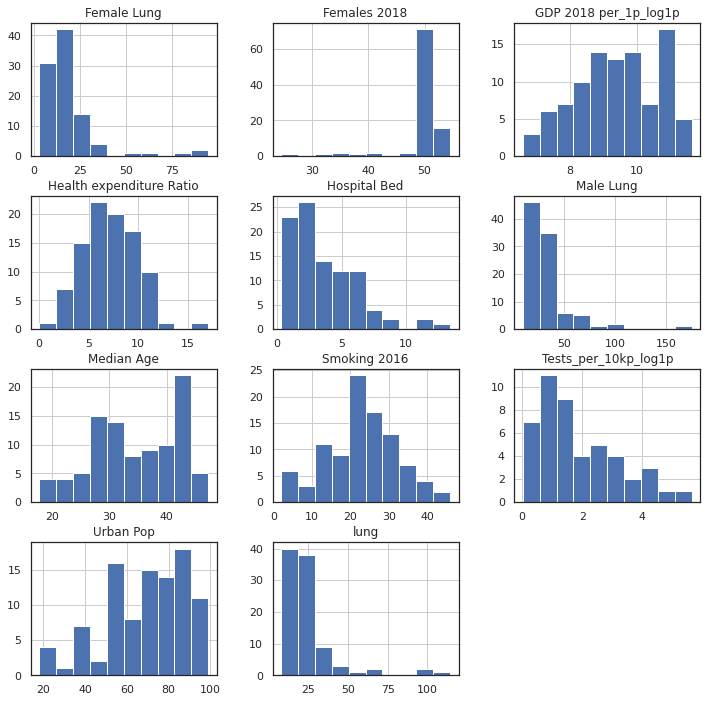

In [11]:
codiv_country.hist(figsize=(12, 12))
plt.show()

Check data types

In [12]:
codiv_country.dtypes

Country                      object
Urban Pop                   float64
Quarantine                   object
Schools                      object
Restrictions                 object
Hospital Bed                float64
lung                        float64
Female Lung                 float64
Male Lung                   float64
Median Age                  float64
Smoking 2016                float64
Females 2018                float64
Tests_per_10kp_log1p        float64
GDP 2018 per_1p_log1p       float64
Health expenditure Ratio    float64
dtype: object

Handling data types
---
We have information for 95 countries and 26 attributes left

Missing values
---
Checking for missing values. It seems that 15 countries have decided to put in place a quarantine and 67 not. But we should be careful about how quarantine is defined. For instance, the quarantine in France is not the same as in Wuhan.

In [13]:
codiv_country.isna().sum()

Country                      0
Urban Pop                    0
Quarantine                  81
Schools                     81
Restrictions                82
Hospital Bed                 0
lung                         0
Female Lung                  0
Male Lung                    0
Median Age                   0
Smoking 2016                 0
Females 2018                 0
Tests_per_10kp_log1p        49
GDP 2018 per_1p_log1p        0
Health expenditure Ratio     2
dtype: int64

In [14]:
codiv_country[codiv_country['Health expenditure Ratio'].isnull()]

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio
0,Albania,63.0,NaN,NaN,NaN,2.9,11.67,7.02,17.04,32.9,28.7,49.063095,NaN,8.565781,NaN
60,Montenegro,68.0,NaN,NaN,NaN,4.0,17.60,10.70,26.47,40.7,45.9,50.559013,NaN,9.078485,NaN


codiv_country[codiv_country['Health expenditure Ratio'].isnull()]

In [15]:
codiv_country['Health expenditure Ratio'] = codiv_country['Health expenditure Ratio'].fillna(codiv_country['Health expenditure Ratio'].mean())

If the number of Tests_per_10kp is missing, I will assume that the country is not testing and I will replace by zero.

In [16]:
codiv_country['Tests_per_10kp_log1p'] = codiv_country['Tests_per_10kp_log1p'].fillna(0) 

Later, I will join the tables together, and hence need to make sure they have the same country names.

In [17]:
codiv_country.Country[codiv_country.Country == "United States"] = "US"

checking outlier by some columns
---

Text(0.5, 0, 'country index')

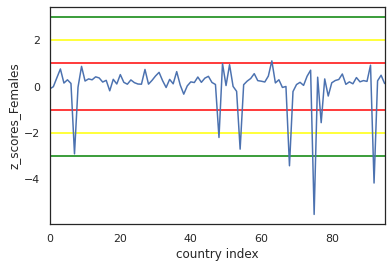

In [18]:
z_scores_Females= (codiv_country['Females 2018']- codiv_country['Females 2018'].mean()) /codiv_country['Females 2018'].std()
z_scores_Females.plot()
plt.hlines(-1,0,100,colors="red")
plt.hlines(-2,0,100,colors="yellow")
plt.hlines(-3,0,100,colors="green")
plt.hlines(1,0,100,colors="red")
plt.hlines(2,0,100,colors="yellow")
plt.hlines(3,0,100,colors="green")
plt.ylabel("z_scores_Females")
plt.xlabel("country index")

Text(0.5, 0, 'country index')

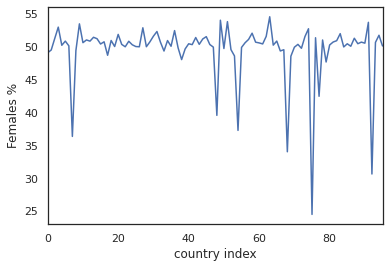

In [19]:
codiv_country['Females 2018'].plot()
plt.ylabel("Females %")
plt.xlabel("country index")

z-scores_Females: (96,)


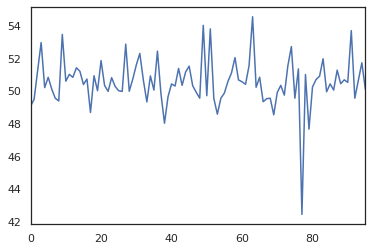

In [20]:
idx_Females = (np.abs(z_scores_Females) > 2)
codiv_country['Females 2018'][idx_Females]=codiv_country['Females 2018'].mean()
print('z-scores_Females:', z_scores_Females.shape)
codiv_country['Females 2018'].plot()

Text(0.5, 0, 'country index')

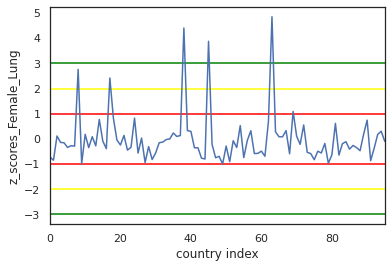

In [21]:
z_scores_Female_Lung= (codiv_country['Female Lung']- codiv_country['Female Lung'].mean()) /codiv_country['Female Lung'].std()
z_scores_Female_Lung.plot()
plt.hlines(-1,0,100,colors="red")
plt.hlines(-2,0,100,colors="yellow")
plt.hlines(-3,0,100,colors="green")
plt.hlines(1,0,100,colors="red")
plt.hlines(2,0,100,colors="yellow")
plt.hlines(3,0,100,colors="green")
plt.ylabel("z_scores_Female_Lung")
plt.xlabel("country index")

In [22]:
idx_Female_Lung = (np.abs(z_scores_Female_Lung) > 2)
codiv_country['Female Lung'][idx_Female_Lung]=codiv_country['Female Lung'].mean()
print('z-scores_Female_Lung:', z_scores_Female_Lung.shape)

z-scores_Female_Lung: (96,)


Text(0.5, 0, 'country index')

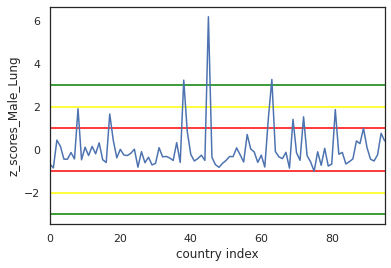

In [23]:
z_scores_Male_Lung= (codiv_country['Male Lung']- codiv_country['Male Lung'].mean()) /codiv_country['Male Lung'].std()
z_scores_Male_Lung.plot()
plt.hlines(-1,0,100,colors="red")
plt.hlines(-2,0,100,colors="yellow")
plt.hlines(-3,0,100,colors="green")
plt.hlines(1,0,100,colors="red")
plt.hlines(2,0,100,colors="yellow")
plt.hlines(3,0,100,colors="green")
plt.ylabel("z_scores_Male_Lung")
plt.xlabel("country index")

In [24]:
idx_Male_Lung = (np.abs(z_scores_Male_Lung) > 2)
codiv_country['Male Lung'][idx_Male_Lung]=codiv_country['Male Lung'].mean()
print('z-scores_Male_Lung:', z_scores_Male_Lung.shape)

z-scores_Male_Lung: (96,)


Text(0.5, 0, 'country index')

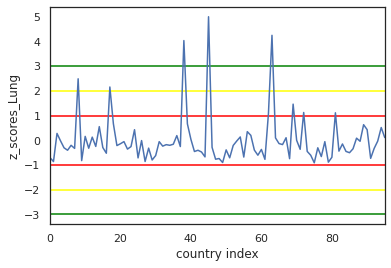

In [25]:
z_scores_Lung= (codiv_country['lung']- codiv_country['lung'].mean()) /codiv_country['lung'].std()
z_scores_Lung.plot()
plt.hlines(-1,0,100,colors="red",label="np.abs(z_scores_Females) > 1)")
plt.hlines(-2,0,100,colors="yellow",label="np.abs(z_scores_Females) > 2)")
plt.hlines(-3,0,100,colors="green",label="np.abs(z_scores_Females) > 3)")
plt.hlines(1,0,100,colors="red",label="np.abs(z_scores_Females) > 1)")
plt.hlines(2,0,100,colors="yellow",label="np.abs(z_scores_Females) > 2)")
plt.hlines(3,0,100,colors="green",label="np.abs(z_scores_Females) > 3)")
plt.ylabel("z_scores_Lung")
plt.xlabel("country index")

In [26]:
idx_Lung = (np.abs(z_scores_Lung) > 2)
codiv_country['lung'][idx_Lung]=codiv_country['lung'].mean()
print('z-scores_Lung:', z_scores_Lung.shape)

z-scores_Lung: (96,)


Remark: 

1. The informations like number of bed reflect the political decision : 
        ie in belgium aged poeple in hospice have no right for hospital, so the number of needed bed is not huge
        ie, in wuhan the was building extra new hospital to give youg and aged poeple a chance to get healty
thats why i will not considere parameter depending of the political impact

2. The number of test, there is missing the time information about the test number, ie, if the test capacity increased, then when

working on the time serie file csse_covid_19_daily_reports.csv
---
Removing columns that I won't use in the analysis

In [27]:
codiv_csse=pd.read_csv(os.path.join('./', 'csse_covid_19_daily_reports.csv'))
codiv_csse=codiv_csse.drop(['FIPS','Admin2','Last_Update','Combined_Key','Long_','Lat'], axis=1)
codiv_csse.sample(10)

,Province_State,Country_Region,Confirmed,Deaths,Recovered,Active
1402,California,US,416,2,0,414
394,Minnesota,US,11,2,0,9
1694,South Dakota,US,3,0,0,3
1791,Minnesota,US,15,1,0,14
310,South Dakota,US,0,0,0,0
1732,Georgia,US,11,0,0,11
2848,Wisconsin,US,7,0,0,7
2067,Florida,US,328,12,0,316
491,Arkansas,US,35,0,0,35
598,Missouri,US,9,0,0,9


The number of "comfirmed" is referred to in the first DataFrame as "Infected". I will rename it

In [28]:
codiv_csse = codiv_csse.rename(columns={'Confirmed': 'Infected'})

Now, I'm aggregating the information by country. Two countries will be affected: US and China.

In [29]:
codiv_csse=codiv_csse.groupby('Country_Region').sum().reset_index()
codiv_csse.sample(10)

,Country_Region,Infected,Deaths,Recovered,Active
183,West Bank and Gaza,398,2,346,50
20,Bolivia,4919,199,553,4167
59,Ethiopia,389,5,122,262
34,Chad,565,57,177,331
83,Ireland,24315,1571,21060,1684
2,Algeria,7542,568,3968,3006
23,Brazil,291579,18859,116683,156037
4,Angola,52,3,17,32
168,Thailand,3034,56,2888,90
158,Spain,232555,27888,150376,54291


New feature : deaths_ratio
---
                create deaths_ratio = number of deaths*1000 / number of infected


deaths_ratio means how much from 1000 infected persons was dying

In [30]:
codiv_csse["Deaths Ratio"]=codiv_csse["Deaths"]*1000/codiv_csse["Infected"]
codiv_csse.sample(10)

,Country_Region,Infected,Deaths,Recovered,Active,Deaths Ratio
80,Indonesia,19189,1242,4575,13372,64.724582
106,Malawi,71,3,27,41,42.253521
152,Singapore,29364,22,11207,18135,0.749217
17,Belize,18,2,16,0,111.111111
44,Cuba,1900,79,1573,248,41.578947
75,Holy See,12,0,2,10,0.000000
49,Djibouti,1828,9,1052,767,4.923414
156,South Africa,18003,339,8950,8714,18.830195
123,New Zealand,1503,21,1452,30,13.972056
109,Mali,931,55,543,333,59.076262


Later, I will only analyze the top 60 countries where the epidemic is the worse.

In [31]:
set(codiv_country['Country'].unique()) - set(codiv_csse['Country_Region'].unique())

{'Czech Republic', 'South Korea'}

Because of the joining that I will do later, I also need to normalize the country names.

In [32]:
codiv_csse.Country_Region[codiv_csse.Country_Region == "Korea, South"] = "South Korea"
codiv_csse.Country_Region[codiv_csse.Country_Region == "Czechia"] = "Czech Republic"

Setting the index to Countries

In [33]:
codiv_csse=codiv_csse.set_index('Country_Region')
codiv_csse.sample(10)

,Infected,Deaths,Recovered,Active,Deaths Ratio
Country_Region,,,,,
Fiji,18,0,15,3,0.000000
Holy See,12,0,2,10,0.000000
Bangladesh,26738,386,5207,21145,14.436383
Cabo Verde,349,3,85,261,8.595989
Barbados,90,7,70,13,77.777778
Kuwait,17568,124,4885,12559,7.058288
Qatar,37097,16,6600,30481,0.431302
Botswana,25,1,17,7,40.000000
Eritrea,39,0,39,0,0.000000


In [34]:
codiv_csse.describe()

,Infected,Deaths,Recovered,Active,Deaths Ratio
count,1.880000e+02,188.000000,188.000000,1.880000e+02,188.000000
mean,2.657698e+04,1745.292553,10092.904255,1.472977e+04,36.824626
std,1.223008e+05,8282.846561,32579.098640,8.851505e+04,38.031312
min,1.000000e+00,0.000000,0.000000,0.000000e+00,0.000000
25%,2.615000e+02,4.000000,81.250000,7.025000e+01,8.908836
50%,1.482000e+03,30.000000,586.000000,4.515000e+02,28.313126
75%,9.456500e+03,234.250000,4020.000000,3.630750e+03,49.962350
max,1.551853e+06,93439.000000,294312.000000,1.162407e+06,222.222222


Checking data type

In [35]:
codiv_csse.dtypes

Infected          int64
Deaths            int64
Recovered         int64
Active            int64
Deaths Ratio    float64
dtype: object

In [36]:
codiv_csse.isna().sum()

Infected        0
Deaths          0
Recovered       0
Active          0
Deaths Ratio    0
dtype: int64

Create the total infected, deaths, recovered and infected columns for the `codiv_country` DataFrame. I however have to check that the country is in the `codiv_csse` DataFrame which will not be used anymore later in the analysis. I will create this column with the following fomula

$$\text{Total Active} = \text{Confirmed} - \text{Deaths} - \text{Recovered}$$

In [37]:
codiv_country['Total Infected'] = 0.0
codiv_country['Total Deaths'] = 0.0
codiv_country['Total Recovered'] = 0.0
codiv_country['Total Active'] = 0.0
codiv_country['Deaths Ratio'] = 0.0
for countryindex in codiv_csse.index:
    # If the country exists in the other table
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        codiv_country.at[codiv_country['Country']==countryindex,'Total Infected Log10']=np.log1p(codiv_csse[codiv_csse.index==countryindex]['Infected'][0])
        codiv_country.at[codiv_country['Country']==countryindex,'Total Infected']=codiv_csse[codiv_csse.index==countryindex]['Infected'][0]
        codiv_country.at[codiv_country['Country']==countryindex,'Total Deaths Log10']=np.log1p(codiv_csse[codiv_csse.index==countryindex]['Deaths'][0])
        codiv_country.at[codiv_country['Country']==countryindex,'Total Deaths']=codiv_csse[codiv_csse.index==countryindex]['Deaths'][0]
        codiv_country.at[codiv_country['Country']==countryindex,'Total Recovered Log10']=np.log1p(codiv_csse[codiv_csse.index==countryindex]['Recovered'][0])
        codiv_country.at[codiv_country['Country']==countryindex,'Total Recovered']=codiv_csse[codiv_csse.index==countryindex]['Recovered'][0]
        codiv_country.at[codiv_country['Country']==countryindex,'Deaths Ratio']=codiv_csse[codiv_csse.index==countryindex]['Deaths Ratio'][0]
        if codiv_csse[codiv_csse.index==countryindex]['Active'][0] ==0.0:
            codiv_country.at[codiv_country['Country']==countryindex,'Total Active Log10']=np.log1p(codiv_csse[codiv_csse.index==countryindex]['Infected'][0]-codiv_csse[codiv_csse.index==countryindex]['Deaths'][0]-codiv_csse[codiv_csse.index==countryindex]['Recovered'][0])
            codiv_country.at[codiv_country['Country']==countryindex,'Total Active']=codiv_csse[codiv_csse.index==countryindex]['Infected'][0]-codiv_csse[codiv_csse.index==countryindex]['Deaths'][0]-codiv_csse[codiv_csse.index==countryindex]['Recovered'][0]
        else:
            codiv_country.at[codiv_country['Country']==countryindex,'Total Active Log10']=np.log1p(codiv_csse[codiv_csse.index==countryindex]['Active'][0])
            codiv_country.at[codiv_country['Country']==countryindex,'Total Active']=codiv_csse[codiv_csse.index==countryindex]['Active'][0]

In [38]:
codiv_country.isnull()[['Total Infected', 'Total Deaths', 'Total Recovered', 'Total Active', 'Deaths Ratio']].sum()

Total Infected     0
Total Deaths       0
Total Recovered    0
Total Active       0
Deaths Ratio       0
dtype: int64

For the second and 3rd part i will build new table, covid without restriction / with quarantine / with rectriction 

In [39]:
codiv_country_qurantine=codiv_country[codiv_country['Quarantine'].notnull()]
codiv_country_Restrictions=codiv_country[codiv_country['Restrictions'].notnull()]
codiv_country_without_Restrictions_qurantine=codiv_country[codiv_country['Restrictions'].isnull() & codiv_country['Quarantine'].isnull()]

print("codiv_country_qurantine shape" , codiv_country_qurantine.shape)
print("codiv_country_Restrictionse shape" , codiv_country_Restrictions.shape)
print("codiv_country_without_Restrictions_quarantine" , codiv_country_without_Restrictions_qurantine.shape)

codiv_country_qurantine shape (15, 24)
codiv_country_Restrictionse shape (14, 24)
codiv_country_without_Restrictions_quarantine (68, 24)


Preparing the time series data
---
I'm dropping the Latitude and Longitude information which are not part of the analysis.

In [40]:
codiv_time_confirmed=pd.read_csv(os.path.join('./', 'time_series_covid19_confirmed_global.csv'))
codiv_time_confirmed=codiv_time_confirmed.drop(['Lat','Long'], axis=1)

codiv_time_deaths=pd.read_csv(os.path.join('./', 'time_series_covid19_deaths_global.csv'))
codiv_time_deaths=codiv_time_deaths.drop(['Lat','Long'], axis=1)

codiv_time_recovered=pd.read_csv(os.path.join('./', 'time_series_covid19_recovered_global.csv'))
codiv_time_recovered=codiv_time_recovered.drop(['Lat','Long'], axis=1)

codiv_time_confirmed.sample(10)

,Province/State,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20
140,NaN,Jordan,0,0,0,0,0,0,0,0,...,562,576,582,586,596,607,613,629,649,672
36,British Columbia,Canada,0,0,0,0,0,0,1,1,...,2353,2360,2376,2392,2407,2428,2428,2444,2446,2467
2,NaN,Algeria,0,0,0,0,0,0,0,0,...,5891,6067,6253,6442,6629,6821,7019,7201,7377,7542
3,NaN,Andorra,0,0,0,0,0,0,0,0,...,755,758,760,761,761,761,761,761,761,762
138,NaN,Jamaica,0,0,0,0,0,0,0,0,...,505,507,509,509,511,517,520,520,520,529
116,NaN,France,0,0,2,3,3,3,4,5,...,175479,176207,175981,176712,177319,177207,177240,177554,178428,179069
183,NaN,Poland,0,0,0,0,0,0,0,0,...,16326,16921,17204,17615,18016,18257,18529,18885,19268,19739
168,Sint Maarten,Netherlands,0,0,0,0,0,0,0,0,...,76,76,76,76,76,77,77,77,77,77
258,Saint Pierre and Miquelon,France,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
143,NaN,"Korea, South",1,1,2,2,3,4,4,4,...,10936,10962,10991,11018,11037,11050,11065,11078,11110,11122


---
codiv_country_temp and codiv_country_tempMajorCity
---
The temperature table deliver 1 value/month from 1700 till 2013, 
- the epidemic started in january, till april,
- The actual temperature value are not available, so i till build the data based on the last 3 years available to protect against temperature fluctuations


In [41]:
codiv_country_temp=pd.read_csv('.//GlobalLandTemperaturesByCountry.csv')
#codiv_country_temp.loc['2020-01-01':'2020-04-01']
codiv_country_temp=codiv_country_temp.drop(['AverageTemperatureUncertainty'], axis=1)
codiv_country_temp=codiv_country_temp[((codiv_country_temp['dt'] > '2013-01-01') & (codiv_country_temp['dt'] < '2013-04-01')) | 
                                      ((codiv_country_temp['dt'] > '2012-01-01') & (codiv_country_temp['dt'] < '2012-04-01')) | 
                                      ((codiv_country_temp['dt'] > '2011-01-01') & (codiv_country_temp['dt'] < '2011-04-01'))]
codiv_country_temp = codiv_country_temp.groupby(['Country'])['AverageTemperature'].mean()
print(codiv_country_temp.sample(10))
print("codiv_country_temp",codiv_country_temp.shape)

Country
Slovakia                   0.171167
Gabon                     25.866500
Africa                    24.066000
Svalbard And Jan Mayen   -12.140167
Turkmenistan               5.948500
El Salvador               25.964000
Netherlands (Europe)       3.572833
Albania                    6.459667
French Polynesia          27.729833
Brazil                    25.840333
Name: AverageTemperature, dtype: float64
codiv_country_temp (243,)


In [42]:
print(codiv_country_temp.describe())

count    242.000000
mean      16.359284
std       12.364130
min      -27.589167
25%        5.334417
50%       22.826083
75%       26.387333
max       30.405500
Name: AverageTemperature, dtype: float64


The temperature table deliver 1 value/month till 2013, so i use the last 3 Years periode jan to april and make the mean.

the temperature is mainly done from big city information. epidemie is mostly also in big cities

In [43]:
codiv_country_tempMajorCity=pd.read_csv('.//GlobalLandTemperaturesByMajorCity.csv')

codiv_country_tempMajorCity=codiv_country_tempMajorCity.drop(['AverageTemperatureUncertainty','Latitude','Longitude'], axis=1)
codiv_country_tempMajorCity=codiv_country_tempMajorCity[((codiv_country_tempMajorCity['dt'] > '2013-01-01') & (codiv_country_tempMajorCity['dt'] < '2013-04-01')) | 
                                      ((codiv_country_tempMajorCity['dt'] > '2012-01-01') & (codiv_country_tempMajorCity['dt'] < '2012-04-01')) | 
                                      ((codiv_country_tempMajorCity['dt'] > '2011-01-01') & (codiv_country_tempMajorCity['dt'] < '2011-04-01'))]
codiv_country_tempMajorCity= codiv_country_tempMajorCity.groupby(['Country'])['AverageTemperature'].mean()
print(codiv_country_tempMajorCity.sample(10))
print("codiv_country_tempMajorCity",codiv_country_tempMajorCity.shape)
print("243-49=194 countries dont have temperature for big city")

Country
Sudan             28.181833
Spain              6.174167
Egypt             16.474500
Côte D'Ivoire     28.658500
Australia         19.668000
Taiwan            18.279833
United Kingdom     5.226000
Kenya             18.501333
Italy              6.002167
France             5.485833
Name: AverageTemperature, dtype: float64
codiv_country_tempMajorCity (49,)
243-49=194 countries dont have temperature for big city


The epidemy happen mostly in big city
big country like usa/china/Russia have lot of unmanned area which have completely different temperature
That means, the representative temp, should be the one of the big cities ( if they exists)

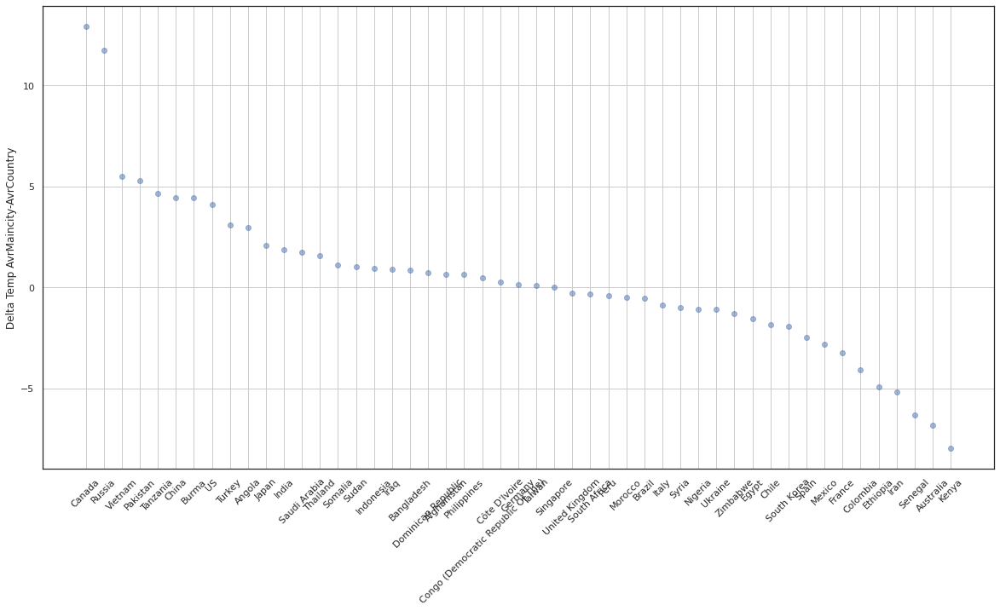

In [44]:
Temperature_difference=(codiv_country_tempMajorCity-codiv_country_temp).dropna()
Temperature_difference=Temperature_difference.sort_values( ascending=False)
x=Temperature_difference.index
y=Temperature_difference
fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(x, y, alpha=0.5)
plt.xticks(rotation=45)
plt.ylabel("Delta Temp AvrMaincity-AvrCountry")
plt.grid(True)
plt.show()

you can see the adjustment for some country like russia and canada, the avr temp big city is slightly different for the avr country temperature, the same for the hot countries

complete the tabelle first  with the main city temp if they exists

In [45]:
codiv_country['Temp_mean_jan_apr'] = 0.0
for countryindex in codiv_country_tempMajorCity.index:
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        codiv_country.at[codiv_country['Country']==countryindex,'Temp_mean_jan_apr']=codiv_country_tempMajorCity.loc[countryindex]
codiv_country['Temp_mean_jan_apr'].sample(10)

3      0.000000
90     5.661389
66    28.550167
87    28.461000
81    22.260500
64     0.000000
5      0.000000
36     0.000000
6      0.000000
82     6.174167
Name: Temp_mean_jan_apr, dtype: float64

complete missing value with mean country value

In [46]:
for countryindex in codiv_country_temp.index:
    if not codiv_country[codiv_country['Country']==countryindex].empty:
        if codiv_country[codiv_country['Country']==countryindex]['Temp_mean_jan_apr'].values[0] == 0:
            codiv_country.at[codiv_country['Country']==countryindex,'Temp_mean_jan_apr']=codiv_country_temp.loc[countryindex]
codiv_country.head()

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,...,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
0,Albania,63.0,NaN,NaN,NaN,2.9,11.67,7.02,17.04,32.9,...,964.0,31.0,758.0,175.0,32.157676,6.872128,3.465736,6.632002,5.170484,6.459667
1,Algeria,73.0,NaN,NaN,NaN,1.9,8.77,5.03,12.81,28.1,...,7542.0,568.0,3968.0,3006.0,75.311588,8.928375,6.343880,8.286269,8.008698,16.661167
2,Argentina,93.0,3/20/2020,NaN,NaN,5.0,29.27,20.16,42.59,31.7,...,9283.0,403.0,2933.0,5947.0,43.412690,9.136048,6.001415,7.984122,8.690810,19.763667
3,Armenia,63.0,NaN,NaN,NaN,4.2,23.86,16.17,35.99,35.1,...,5271.0,67.0,2419.0,2785.0,12.711061,8.570165,4.219508,7.791523,7.932362,0.073500
4,Australia,86.0,NaN,NaN,3/23/2020,3.8,18.79,15.90,22.16,38.7,...,7081.0,100.0,6470.0,511.0,14.122299,8.865312,4.615121,8.775086,6.238325,19.668000


Checking for missing values

In [47]:
codiv_country[(codiv_country['Temp_mean_jan_apr'] == 0)]

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,...,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
11,Bosnia and Herzegovina,52.0,NaN,NaN,NaN,3.5,18.48,12.88,26.05,42.1,...,2338.0,136.0,1557.0,645.0,58.169376,7.757479,4.919981,7.351158,6.470800,0.0
54,Maldives,35.0,NaN,NaN,NaN,4.3,26.70,26.61,26.89,28.2,...,1186.0,4.0,91.0,1091.0,3.372681,7.079184,1.609438,4.521789,6.995766,0.0


Two countries have missing values for the temperatures. I will keep them in the data and see if this produces issues later in the analysis.

The table have a heatmap per collumn, the higher value have dark red, smaller light red

now let show the data with total infected ascending=false
FIRST for the Total Infected

In [48]:
transit=codiv_country.sort_values(by='Total Infected', ascending=False)
transit = transit.reset_index(drop=True)
transit.head(11).style.background_gradient(cmap='Blues')

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
0,US,83,nan,nan,nan,2.9,32.01,30.04,34.55,38.1,21.8,50.52,1.06228,11.036,17.0613,1.55185e+06,93439,294312,1.16241e+06,60.2112,14.255,11.4451,12.5924,13.966,5.66139
1,Brazil,88,nan,nan,nan,2.2,26.57,19.71,35.83,32,13.9,50.8299,0.129011,9.08161,9.46748,291579,18859,116683,156037,64.6789,12.5831,9.8448,11.6672,11.9579,25.3104
2,United Kingdom,83,nan,3/20/2020,3/20/2020,2.8,23.66,21.11,26.84,40.5,22.3,50.6353,2.13184,10.6469,9.63169,249619,35786,1116,212717,143.362,12.4277,10.4853,7.0184,12.2677,5.226
3,Spain,80,3/15/2020,nan,nan,3,16.37,8.22,27.49,42.7,29.3,50.8966,0,10.3206,8.87313,232555,27888,150376,54291,119.92,12.3569,10.236,11.9209,10.9021,6.17417
4,Italy,69,3/8/2020,nan,nan,3.4,17,12.78,22.78,45.5,23.7,51.3767,3.24208,10.4478,8.84026,227364,32330,132282,62752,142.195,12.3343,10.3838,11.7927,11.047,6.00217
5,France,82,3/17/2020,nan,nan,6.5,13.15,9.64,17.69,41.4,32.7,51.5842,0.991804,10.6585,11.3129,181700,28135,63472,90093,154.843,12.1101,10.2448,11.0584,11.4086,5.48583
6,Germany,76,3/21/2020,nan,nan,8.3,20.01,16.32,24.67,47.1,30.6,50.6604,0,10.7604,11.2468,178473,8144,156966,13363,45.6316,12.0922,9.00516,11.9638,9.50032,1.87783
7,Turkey,76,nan,3/16/2020,3/16/2020,2.7,35.63,21.2,55.26,30.9,27.2,50.6778,0,9.12116,4.2163,152587,4222,113987,34378,27.6695,11.9355,8.3483,11.6438,10.4452,7.10883
8,India,35,3/23/2020,nan,nan,0.7,24.3045,18.3551,32.3406,27.9,11.5,48.0235,0.0418648,7.58634,3.53496,112028,3434,45422,63172,30.6531,11.6265,8.14177,10.7238,11.0536,24.1535
9,Peru,79,3/15/2020,nan,nan,1.6,17.69,14.94,20.96,28,4.8,50.3378,0,8.81513,4.99515,104020,3024,41968,59028,29.0713,11.5523,8.01467,10.6447,10.9858,20.1127


let show the data with total active ascending=false for the active

In [49]:
transit=codiv_country.sort_values(by='Total Active', ascending=False)
transit = transit.reset_index(drop=True)
transit.head(11).style.background_gradient(cmap='Greens')

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
0,US,83,nan,nan,nan,2.9,32.01,30.04,34.55,38.1,21.8,50.52,1.06228,11.036,17.0613,1.55185e+06,93439,294312,1.16241e+06,60.2112,14.255,11.4451,12.5924,13.966,5.66139
1,United Kingdom,83,nan,3/20/2020,3/20/2020,2.8,23.66,21.11,26.84,40.5,22.3,50.6353,2.13184,10.6469,9.63169,249619,35786,1116,212717,143.362,12.4277,10.4853,7.0184,12.2677,5.226
2,Brazil,88,nan,nan,nan,2.2,26.57,19.71,35.83,32,13.9,50.8299,0.129011,9.08161,9.46748,291579,18859,116683,156037,64.6789,12.5831,9.8448,11.6672,11.9579,25.3104
3,France,82,3/17/2020,nan,nan,6.5,13.15,9.64,17.69,41.4,32.7,51.5842,0.991804,10.6585,11.3129,181700,28135,63472,90093,154.843,12.1101,10.2448,11.0584,11.4086,5.48583
4,India,35,3/23/2020,nan,nan,0.7,24.3045,18.3551,32.3406,27.9,11.5,48.0235,0.0418648,7.58634,3.53496,112028,3434,45422,63172,30.6531,11.6265,8.14177,10.7238,11.0536,24.1535
5,Italy,69,3/8/2020,nan,nan,3.4,17,12.78,22.78,45.5,23.7,51.3767,3.24208,10.4478,8.84026,227364,32330,132282,62752,142.195,12.3343,10.3838,11.7927,11.047,6.00217
6,Peru,79,3/15/2020,nan,nan,1.6,17.69,14.94,20.96,28,4.8,50.3378,0,8.81513,4.99515,104020,3024,41968,59028,29.0713,11.5523,8.01467,10.6447,10.9858,20.1127
7,Spain,80,3/15/2020,nan,nan,3,16.37,8.22,27.49,42.7,29.3,50.8966,0,10.3206,8.87313,232555,27888,150376,54291,119.92,12.3569,10.236,11.9209,10.9021,6.17417
8,Netherlands,92,nan,3/15/2020,3/15/2020,4.7,26,22.74,30.36,42.6,25.8,50.2209,1.50444,10.8841,10.1008,44647,5767,169,38711,129.169,10.7066,8.66008,5.1358,10.5639,4.0755
9,Canada,81,nan,3/15/2020,3/20/2020,2.7,19.01,16.95,21.55,42.2,14.3,50.3915,3.06302,10.7232,10.5728,81575,6150,40793,34632,75.3907,11.3093,8.72437,10.6163,10.4526,-3.59


Finaly let show the data with total Deaths ascending=false for the Deaths

In [50]:
transit=codiv_country.sort_values(by='Total Deaths', ascending=False)
transit = transit.reset_index(drop=True)
transit.head(11).style.background_gradient(cmap='Reds')

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
0,US,83,nan,nan,nan,2.9,32.01,30.04,34.55,38.1,21.8,50.52,1.06228,11.036,17.0613,1.55185e+06,93439,294312,1.16241e+06,60.2112,14.255,11.4451,12.5924,13.966,5.66139
1,United Kingdom,83,nan,3/20/2020,3/20/2020,2.8,23.66,21.11,26.84,40.5,22.3,50.6353,2.13184,10.6469,9.63169,249619,35786,1116,212717,143.362,12.4277,10.4853,7.0184,12.2677,5.226
2,Italy,69,3/8/2020,nan,nan,3.4,17,12.78,22.78,45.5,23.7,51.3767,3.24208,10.4478,8.84026,227364,32330,132282,62752,142.195,12.3343,10.3838,11.7927,11.047,6.00217
3,France,82,3/17/2020,nan,nan,6.5,13.15,9.64,17.69,41.4,32.7,51.5842,0.991804,10.6585,11.3129,181700,28135,63472,90093,154.843,12.1101,10.2448,11.0584,11.4086,5.48583
4,Spain,80,3/15/2020,nan,nan,3,16.37,8.22,27.49,42.7,29.3,50.8966,0,10.3206,8.87313,232555,27888,150376,54291,119.92,12.3569,10.236,11.9209,10.9021,6.17417
5,Brazil,88,nan,nan,nan,2.2,26.57,19.71,35.83,32,13.9,50.8299,0.129011,9.08161,9.46748,291579,18859,116683,156037,64.6789,12.5831,9.8448,11.6672,11.9579,25.3104
6,Belgium,98,3/18/2020,nan,nan,6.2,27.11,21.2,34.98,41.4,28.2,50.5933,1.5359,10.7543,10.3387,55983,9150,14847,31986,163.442,10.9328,9.12162,9.60562,10.3731,4.12683
7,Germany,76,3/21/2020,nan,nan,8.3,20.01,16.32,24.67,47.1,30.6,50.6604,0,10.7604,11.2468,178473,8144,156966,13363,45.6316,12.0922,9.00516,11.9638,9.50032,1.87783
8,Canada,81,nan,3/15/2020,3/20/2020,2.7,19.01,16.95,21.55,42.2,14.3,50.3915,3.06302,10.7232,10.5728,81575,6150,40793,34632,75.3907,11.3093,8.72437,10.6163,10.4526,-3.59
9,Mexico,84,nan,nan,nan,1.5,27.85,23.43,33.14,28.3,14,51.0893,0,9.15575,5.51654,56594,6090,38419,12085,107.609,10.9437,8.71457,10.5563,9.3998,15.6355


In [51]:
transit=codiv_country.sort_values(by='Deaths Ratio', ascending=False)
transit = transit.reset_index(drop=True)
transit.head(11).style.background_gradient(cmap='Oranges')

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
0,Belgium,98,3/18/2020,nan,nan,6.2,27.11,21.2,34.98,41.4,28.2,50.5933,1.5359,10.7543,10.3387,55983,9150,14847,31986,163.442,10.9328,9.12162,9.60562,10.3731,4.12683
1,France,82,3/17/2020,nan,nan,6.5,13.15,9.64,17.69,41.4,32.7,51.5842,0.991804,10.6585,11.3129,181700,28135,63472,90093,154.843,12.1101,10.2448,11.0584,11.4086,5.48583
2,United Kingdom,83,nan,3/20/2020,3/20/2020,2.8,23.66,21.11,26.84,40.5,22.3,50.6353,2.13184,10.6469,9.63169,249619,35786,1116,212717,143.362,12.4277,10.4853,7.0184,12.2677,5.226
3,Italy,69,3/8/2020,nan,nan,3.4,17,12.78,22.78,45.5,23.7,51.3767,3.24208,10.4478,8.84026,227364,32330,132282,62752,142.195,12.3343,10.3838,11.7927,11.047,6.00217
4,Hungary,72,nan,nan,nan,7,27.68,19.86,39.93,42.3,30.6,52.4324,0.971838,9.70164,6.87999,3598,470,1454,1674,130.628,8.18841,6.15486,7.28276,7.42357,2.33833
5,Netherlands,92,nan,3/15/2020,3/15/2020,4.7,26,22.74,30.36,42.6,25.8,50.2209,1.50444,10.8841,10.1008,44647,5767,169,38711,129.169,10.7066,8.66008,5.1358,10.5639,4.0755
6,Sweden,88,nan,3/17/2020,3/11/2020,2.6,16.17,16.58,17.03,41.2,18.8,49.9458,2.71862,10.9162,11.0187,31523,3831,4971,22721,121.53,10.3585,8.25114,8.51158,10.0311,-5.46633
7,Spain,80,3/15/2020,nan,nan,3,16.37,8.22,27.49,42.7,29.3,50.8966,0,10.3206,8.87313,232555,27888,150376,54291,119.92,12.3569,10.236,11.9209,10.9021,6.17417
8,Mexico,84,nan,nan,nan,1.5,27.85,23.43,33.14,28.3,14,51.0893,0,9.15575,5.51654,56594,6090,38419,12085,107.609,10.9437,8.71457,10.5563,9.3998,15.6355
9,Ecuador,63,nan,nan,nan,1.5,24.07,18.85,30.17,27.7,7.1,49.9706,0,8.72339,8.25743,34854,2888,3557,28409,82.8599,10.459,7.96867,8.17695,10.2545,22.5758


The deaths ratio deliver complete new tops. I think it is in relation to the land registration policy, ie how they register a codiv death
---
---
Section 1: data analyze
---
the interest is to check the worst country, so i limit the number  to 60 country  sorted on the higest infected

In [52]:
codiv_country_short=codiv_country.sort_values(by='Total Infected', ascending=False).head(n=60).reset_index(drop=True)
codiv_country_short

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,...,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
0,US,83.0,NaN,NaN,NaN,2.9,32.010000,30.040000,34.550000,38.1,...,1551853.0,93439.0,294312.0,1162407.0,60.211244,14.254961,11.445075,12.592399,13.966004,5.661389
1,Brazil,88.0,NaN,NaN,NaN,2.2,26.570000,19.710000,35.830000,32.0,...,291579.0,18859.0,116683.0,156037.0,64.678869,12.583070,9.844799,11.667225,11.957855,25.310389
2,United Kingdom,83.0,NaN,3/20/2020,3/20/2020,2.8,23.660000,21.110000,26.840000,40.5,...,249619.0,35786.0,1116.0,212717.0,143.362484,12.427695,10.485340,7.018402,12.267723,5.226000
3,Spain,80.0,3/15/2020,NaN,NaN,3.0,16.370000,8.220000,27.490000,42.7,...,232555.0,27888.0,150376.0,54291.0,119.920019,12.356886,10.235988,11.920901,10.902132,6.174167
4,Italy,69.0,3/8/2020,NaN,NaN,3.4,17.000000,12.780000,22.780000,45.5,...,227364.0,32330.0,132282.0,62752.0,142.194895,12.334312,10.383782,11.792699,11.046962,6.002167
5,France,82.0,3/17/2020,NaN,NaN,6.5,13.150000,9.640000,17.690000,41.4,...,181700.0,28135.0,63472.0,90093.0,154.843148,12.110118,10.244805,11.058370,11.408609,5.485833
6,Germany,76.0,3/21/2020,NaN,NaN,8.3,20.010000,16.320000,24.670000,47.1,...,178473.0,8144.0,156966.0,13363.0,45.631552,12.092198,9.005160,11.963791,9.500320,1.877833
7,Turkey,76.0,NaN,3/16/2020,3/16/2020,2.7,35.630000,21.200000,55.260000,30.9,...,152587.0,4222.0,113987.0,34378.0,27.669461,11.935497,8.348301,11.643848,10.445201,7.108833
8,India,35.0,3/23/2020,NaN,NaN,0.7,24.304479,18.355104,32.340625,27.9,...,112028.0,3434.0,45422.0,63172.0,30.653051,11.626513,8.141772,10.723774,11.053632,24.153512
9,Peru,79.0,3/15/2020,NaN,NaN,1.6,17.690000,14.940000,20.960000,28.0,...,104020.0,3024.0,41968.0,59028.0,29.071332,11.552348,8.014666,10.644687,10.985784,20.112667


In [53]:
codiv_country_short.describe()

,Urban Pop,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,...,Total Infected,Total Deaths,Total Recovered,Total Active,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
count,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000,...,6.000000e+01,60.000000,60.000000,6.000000e+01,60.000000,60.000000,60.000000,60.000000,60.000000,60.000000
mean,74.083333,3.798333,20.994965,15.606174,29.433021,34.893333,21.808333,50.276573,1.098839,9.656108,...,7.381013e+04,5224.233333,27553.916667,4.100373e+04,46.499719,10.158814,6.589041,9.117794,9.080380,10.830429
std,16.107995,2.833665,9.311542,7.566936,15.604799,7.099245,8.114734,1.545016,1.426025,1.201572,...,2.054780e+05,14083.840921,51245.222856,1.515926e+05,41.339160,1.253673,2.025208,1.569387,1.700724,12.317086
min,35.000000,0.300000,7.870000,2.830000,9.210000,18.400000,3.900000,42.445848,0.000000,7.262046,...,3.971000e+03,12.000000,32.000000,1.150000e+02,0.431302,8.287025,2.564949,3.496508,4.753590,-27.002500
25%,63.000000,1.600000,14.467500,9.537500,20.025000,29.025000,16.275000,49.552122,0.000000,8.746513,...,9.142500e+03,231.750000,4065.500000,3.151500e+03,16.620950,9.120437,5.449921,8.310441,8.055588,1.141792
50%,79.000000,2.800000,19.345000,15.695000,25.505000,34.850000,22.850000,50.397689,0.268994,9.652689,...,1.920950e+04,559.000000,6871.000000,1.002050e+04,33.943321,9.863212,6.327897,8.834432,9.210848,8.918083
75%,86.000000,5.175000,24.458359,20.010000,33.310000,41.400000,26.475000,50.903924,1.706594,10.730984,...,5.420850e+04,3126.500000,21421.000000,2.916625e+04,63.917500,10.900435,8.046443,9.971757,10.280470,22.093937
max,99.000000,13.400000,50.610000,35.500000,76.240000,47.300000,39.400000,53.687751,5.641882,11.637268,...,1.551853e+06,93439.000000,294312.000000,1.162407e+06,163.442474,14.254961,11.445075,12.592399,13.966004,29.603167


---
scatter plot for total infected
---
Checking the relation between Tests_per_10kp and total infected.

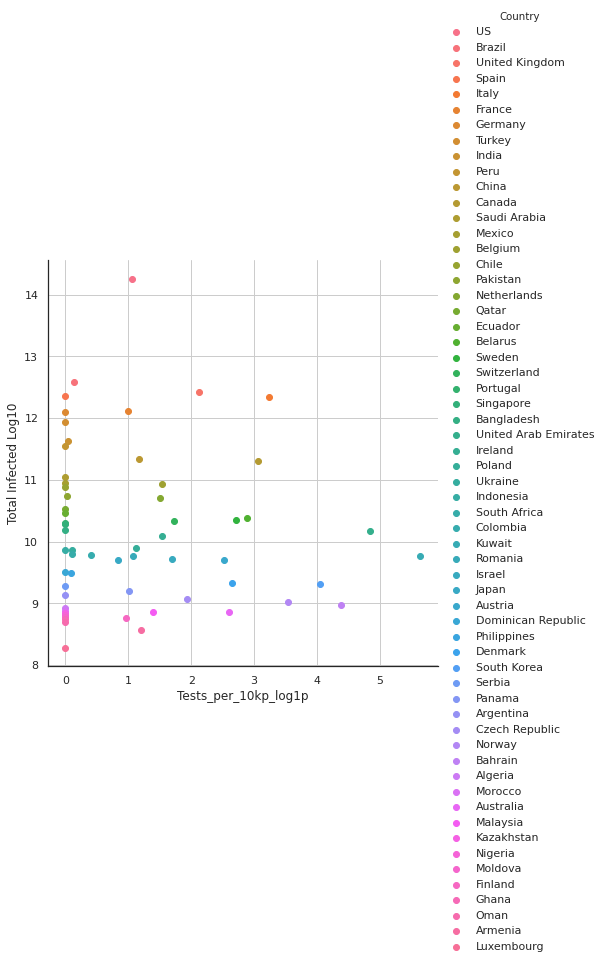

In [54]:
sns.FacetGrid(codiv_country_short, hue="Country", size=6.5) \
   .map(plt.scatter, "Tests_per_10kp_log1p", "Total Infected Log10") \
   .add_legend()

plt.grid(True)

Text(0.5, 1.0, 'Histogram Tests_per_10kp_log1p==0')

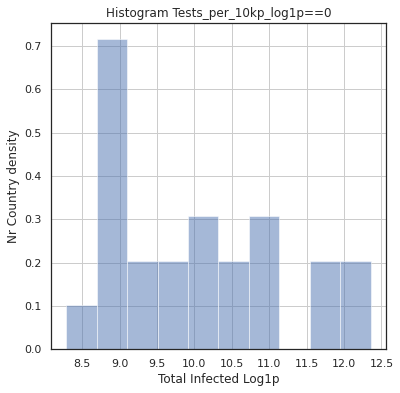

In [55]:
#histogram of "total infected" for countries that have Tests_per_10kp_log1p == 0
codiv_country_short[codiv_country_short["Tests_per_10kp_log1p"] == 0]["Total Infected Log10"].hist(figsize=(6, 6), alpha=0.5, density=True)
plt.xlabel('Total Infected Log1p')
plt.ylabel('Nr Country density')
plt.title('Histogram Tests_per_10kp_log1p==0')

Text(0.5, 1.0, 'Histogram Tests_per_10kp_log1p not 0')

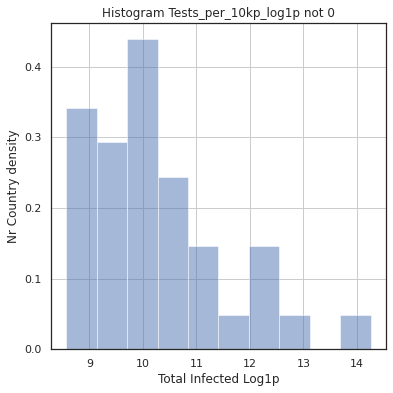

In [56]:
#histogram of "total infected" for countries that have Tests_per_10kp_log1p != 0
codiv_country_short[codiv_country_short["Tests_per_10kp_log1p"] != 0]["Total Infected Log10"].hist(figsize=(6,6), alpha=0.5, density=True)
plt.xlabel('Total Infected Log1p')
plt.ylabel('Nr Country density')
plt.title('Histogram Tests_per_10kp_log1p not 0')

---
scatter plot for total active
---

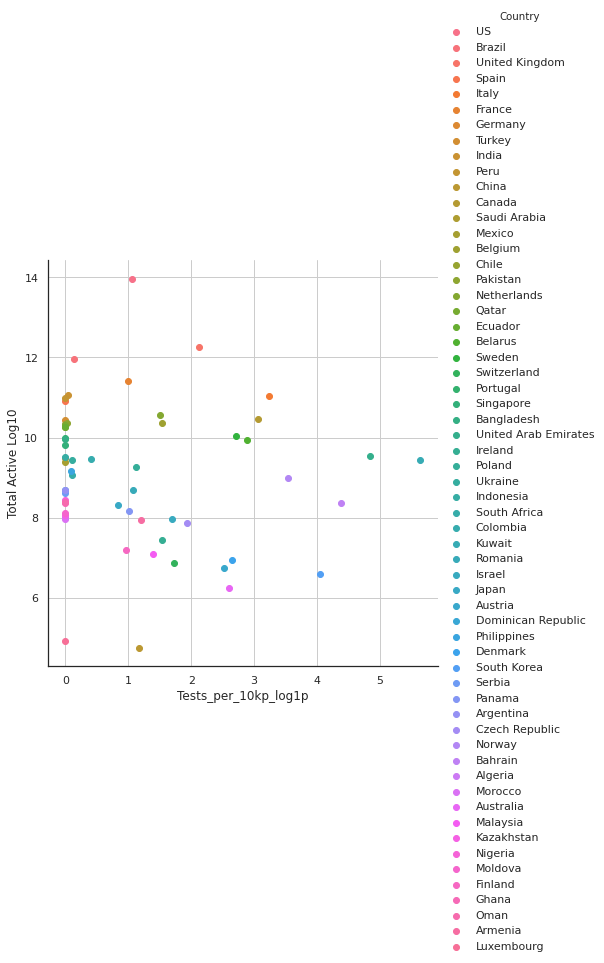

In [57]:
sns.FacetGrid(codiv_country_short, hue="Country", size=6.5) \
   .map(plt.scatter, "Tests_per_10kp_log1p", "Total Active Log10") \
   .add_legend()
plt.grid(True)

Historgram of "total infected" for countries that have Tests_per_10kp_log1p  == 0

Text(0.5, 1.0, 'Histogram Tests_per_10kp_log1p==0')

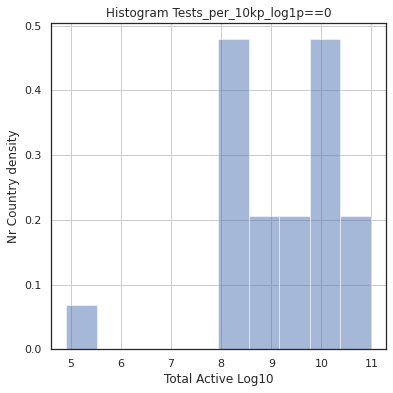

In [58]:
codiv_country_short[codiv_country_short["Tests_per_10kp_log1p"] == 0]["Total Active Log10"].hist(figsize=(6, 6), alpha=0.5, density=True)
plt.xlabel('Total Active Log10')
plt.ylabel('Nr Country density')
plt.title('Histogram Tests_per_10kp_log1p==0')

the country density and incted porsone is slightly higher then the country making test

histogram of "Total Active" for countries that have Tests_per_10kp_per_100ps_log1p > 0

Text(0.5, 1.0, 'Histogram Tests_per_10kp_log1p not 0')

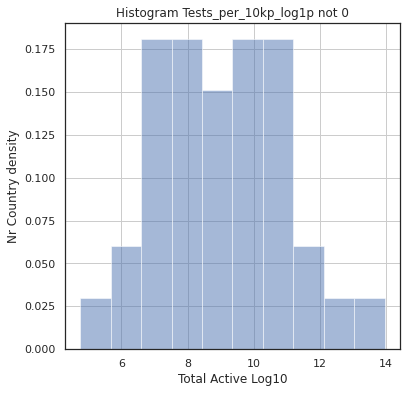

In [59]:
codiv_country_short[codiv_country_short["Tests_per_10kp_log1p"] != 0]["Total Active Log10"].hist(figsize=(6,6), alpha=0.5, density=True)
plt.xlabel('Total Active Log10')
plt.ylabel('Nr Country density')
plt.title('Histogram Tests_per_10kp_log1p not 0')

In [60]:
codiv_country_short.drop([   'Total Infected', 'Total Deaths', 'Total Recovered', 'Total Active'], axis=1)

,Country,Urban Pop,Quarantine,Schools,Restrictions,Hospital Bed,lung,Female Lung,Male Lung,Median Age,...,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Deaths Ratio,Total Infected Log10,Total Deaths Log10,Total Recovered Log10,Total Active Log10,Temp_mean_jan_apr
0,US,83.0,NaN,NaN,NaN,2.9,32.010000,30.040000,34.550000,38.1,...,50.520015,1.062275,11.035986,17.061269,60.211244,14.254961,11.445075,12.592399,13.966004,5.661389
1,Brazil,88.0,NaN,NaN,NaN,2.2,26.570000,19.710000,35.830000,32.0,...,50.829917,0.129011,9.081606,9.467477,64.678869,12.583070,9.844799,11.667225,11.957855,25.310389
2,United Kingdom,83.0,NaN,3/20/2020,3/20/2020,2.8,23.660000,21.110000,26.840000,40.5,...,50.635275,2.131844,10.646880,9.631694,143.362484,12.427695,10.485340,7.018402,12.267723,5.226000
3,Spain,80.0,3/15/2020,NaN,NaN,3.0,16.370000,8.220000,27.490000,42.7,...,50.896641,0.000000,10.320609,8.873130,119.920019,12.356886,10.235988,11.920901,10.902132,6.174167
4,Italy,69.0,3/8/2020,NaN,NaN,3.4,17.000000,12.780000,22.780000,45.5,...,51.376670,3.242081,10.447751,8.840259,142.194895,12.334312,10.383782,11.792699,11.046962,6.002167
5,France,82.0,3/17/2020,NaN,NaN,6.5,13.150000,9.640000,17.690000,41.4,...,51.584240,0.991804,10.658512,11.312892,154.843148,12.110118,10.244805,11.058370,11.408609,5.485833
6,Germany,76.0,3/21/2020,NaN,NaN,8.3,20.010000,16.320000,24.670000,47.1,...,50.660367,0.000000,10.760403,11.246835,45.631552,12.092198,9.005160,11.963791,9.500320,1.877833
7,Turkey,76.0,NaN,3/16/2020,3/16/2020,2.7,35.630000,21.200000,55.260000,30.9,...,50.677813,0.000000,9.121162,4.216303,27.669461,11.935497,8.348301,11.643848,10.445201,7.108833
8,India,35.0,3/23/2020,NaN,NaN,0.7,24.304479,18.355104,32.340625,27.9,...,48.023540,0.041865,7.586342,3.534960,30.653051,11.626513,8.141772,10.723774,11.053632,24.153512
9,Peru,79.0,3/15/2020,NaN,NaN,1.6,17.690000,14.940000,20.960000,28.0,...,50.337755,0.000000,8.815129,4.995150,29.071332,11.552348,8.014666,10.644687,10.985784,20.112667


---
check some correlation possibilities
---
the goal is to check which parapemer could have an impact, the GDP/population size//density are take out, hmore population you have more it you will have infected., more poeple you have higher is the GDP, etc..
I will also check the pearsons correlation factor.

Pearsons correlation Total Infected Log10 <-> Urban Pop : 0.114
Pearsons correlation Total Deaths Log10 <-> Urban Pop : -0.009
Pearsons correlation Total Active Log10 <-> Urban Pop : 0.074
Pearsons correlation Deaths Ratio <-> Urban Pop : 0.130
Pearsons correlation Total Infected Log10 <-> Hospital Bed : -0.089
Pearsons correlation Total Deaths Log10 <-> Hospital Bed : -0.018
Pearsons correlation Total Active Log10 <-> Hospital Bed : -0.230
Pearsons correlation Deaths Ratio <-> Hospital Bed : 0.034
Pearsons correlation Total Infected Log10 <-> lung : 0.133
Pearsons correlation Total Deaths Log10 <-> lung : 0.245
Pearsons correlation Total Active Log10 <-> lung : 0.141
Pearsons correlation Deaths Ratio <-> lung : 0.104
Pearsons correlation Total Infected Log10 <-> Female Lung : 0.179
Pearsons correlation Total Deaths Log10 <-> Female Lung : 0.301
Pearsons correlation Total Active Log10 <-> Female Lung : 0.154
Pearsons correlation Deaths Ratio <-> Female Lung : 0.174
Pearsons correlation

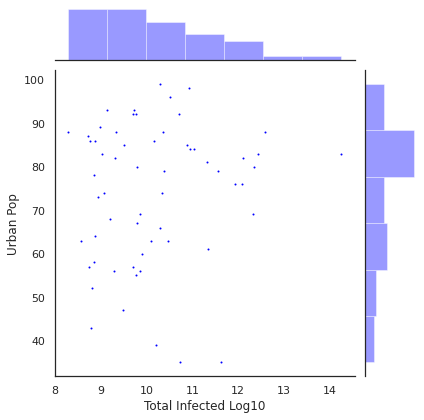

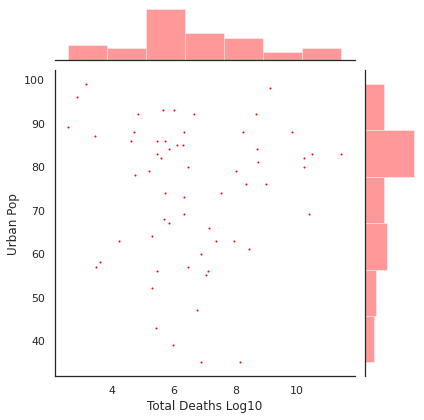

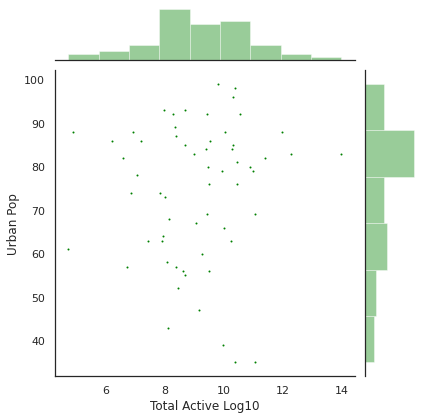

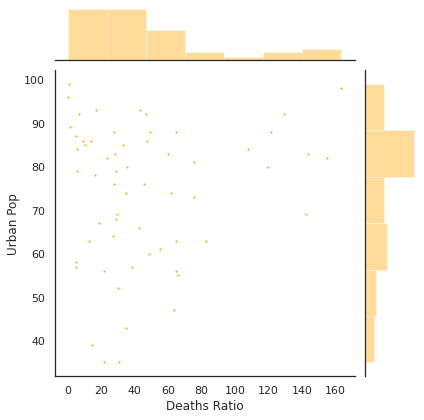

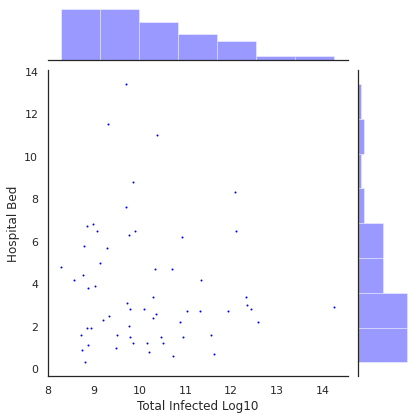

...

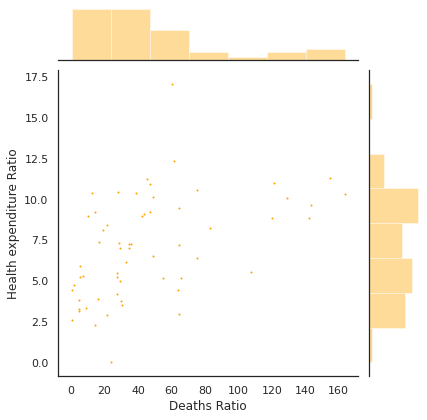

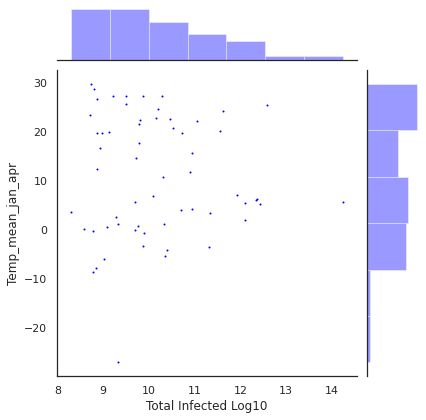

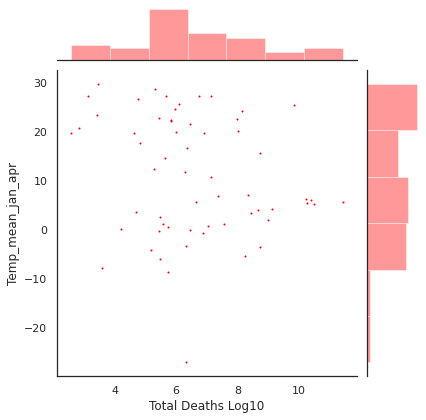

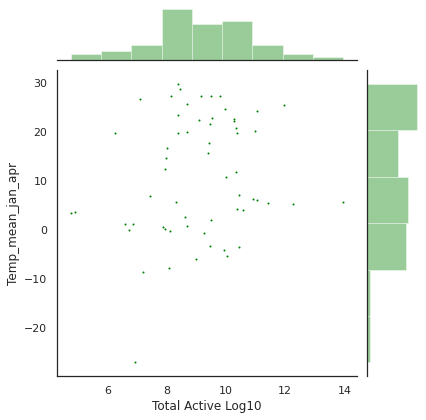

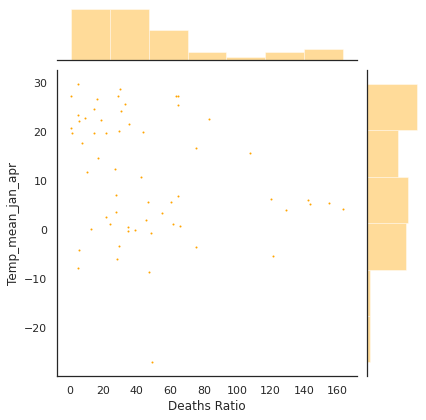

In [61]:
import seaborn as sns
import numpy as np
from scipy.stats import pearsonr
#I use a temp table to hide some columns not needed for the sns.
codiv_country_short_tmp=codiv_country_short.drop([ 'Deaths Ratio','Total Infected', 'Total Deaths', 'Total Recovered', 'Total Active','Total Recovered Log10','Total Infected Log10','Total Deaths Log10','Total Active Log10'], axis=1)
for col in codiv_country_short_tmp.loc[:, codiv_country_short_tmp.dtypes == np.number].keys():
    sns.jointplot(codiv_country_short['Total Infected Log10'], col, data=codiv_country_short, height=6, s=1, color="blue")
    corr, _ = pearsonr(codiv_country_short['Total Infected Log10'], codiv_country_short[col])
    print("Pearsons correlation Total Infected Log10 <-> %s : %.3f" %(col, corr))
    sns.jointplot(codiv_country_short['Total Deaths Log10'], col, data=codiv_country_short, height=6, s=1, color="red")
    corr, _ = pearsonr(codiv_country_short['Total Deaths Log10'], codiv_country_short[col])
    print("Pearsons correlation Total Deaths Log10 <-> %s : %.3f" %(col, corr))
    sns.jointplot(codiv_country_short['Total Active Log10'], col, data=codiv_country_short, height=6, s=1, color="green")
    corr, _ = pearsonr(codiv_country_short['Total Active Log10'], codiv_country_short[col])
    print("Pearsons correlation Total Active Log10 <-> %s : %.3f" %(col, corr))
    sns.jointplot(codiv_country_short['Deaths Ratio'], col, data=codiv_country_short, height=6, s=1, color="orange")
    corr, _ = pearsonr(codiv_country_short['Deaths Ratio'], codiv_country_short[col])
    print("Pearsons correlation Deaths Ratio <-> %s : %.3f" %(col, corr))
plt.show()

```
a low correlation Pearsons correlation Total Deaths Log10 <-> Health expenditure Ratio : 0.580 very strange
```
no correlation on number of smoking/male/female/lung (-0.5<Pearsons correlation<0.5), but look like an information on the avg temperature country having number of infect >4.0 (log) have an avr temp 2.5-7c over this temperature  the number of infected is lower., in cold temperature the same. the death show the same

There seems to be a correlation between "Health Expenditure Ratio" and Deaths/Infected which is hard to explain. Maybe it comes from other variables that are not part of the data. (confounding factors)

There is a peak of "total active" for mean temperature around 5°C. This similarity with worse countries cannot be explained by the latitude as seen below

- USA : 39,91N
- China : 39,55N
- Germany: 55N
- Italy:44N
- Spain 40N

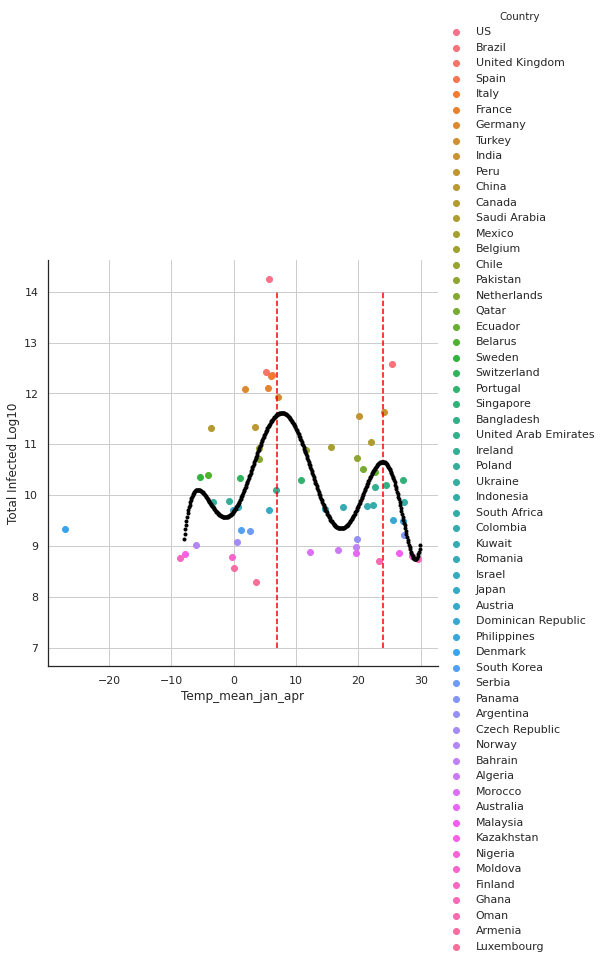

In [62]:
coefs_poly3 = np.polyfit(codiv_country_short["Temp_mean_jan_apr"], codiv_country_short["Total Infected Log10"], deg=8) 
sns.FacetGrid(codiv_country_short, hue="Country", size=6.5) \
   .map(plt.scatter, "Temp_mean_jan_apr", "Total Infected Log10") \
   .add_legend()
for indexq in range(-80,300,1):
    plt.plot(indexq/10,np.polyval(coefs_poly3, indexq/10), '.', color='black')
plt.vlines(7,7,14,colors="red",linestyles='dashed')
plt.vlines(24,7,14,colors="red",linestyles='dashed')
plt.grid(True)

It look like having 2 temperature peaks by 7c and 24c

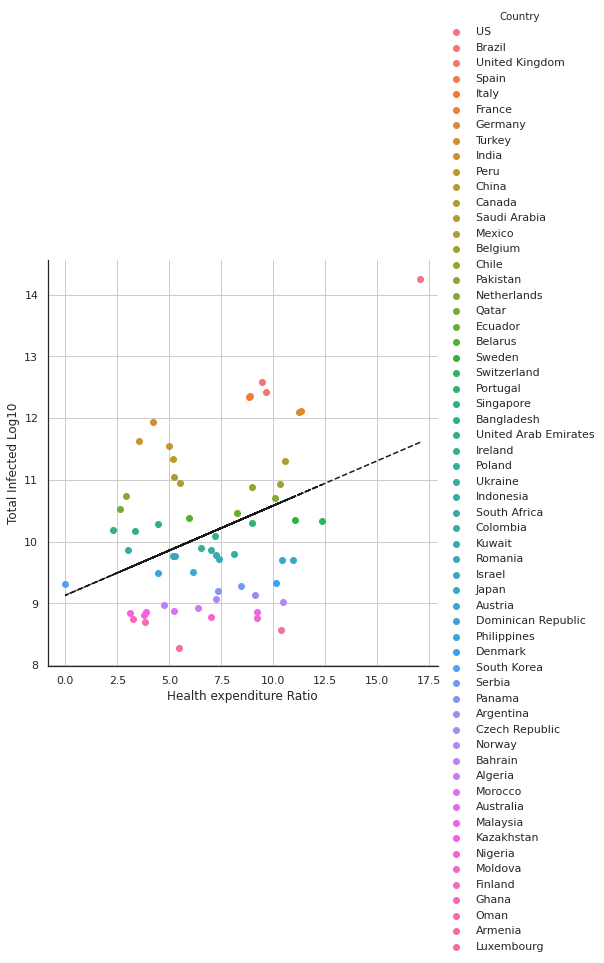

In [63]:
m,b = np.polyfit(codiv_country_short["Health expenditure Ratio"], codiv_country_short["Total Infected Log10"], 1) 

sns.FacetGrid(codiv_country_short, hue="Country", size=6.5) \
   .map(plt.scatter, "Health expenditure Ratio", "Total Infected Log10") \
   .add_legend()
plt.plot(codiv_country_short["Health expenditure Ratio"], m*codiv_country_short["Health expenditure Ratio"]+b, '--k') 
plt.grid(True)

More you invest in health more infected and death you have? or less you invest in health, less poeple are going to hospital and so less poeple are officialy registrated as infected?

China gave covid  test and medicine for free to everyone in the country, rich and poor. What about USA/europa?  if you have symptome please stay at home... that means they are not registrated as infected, if you are seriously sick, come over for a test (germany , belgium, switzerland and you have to pay for.)

---
---
Section 2: Analyzing if there are any external factors that affect the epidemic value
---

In this part of the analysis, I will fit, tune and evaluate a Decision Tree model, Forest model, and dummyclassifier to analyze the effect of external factors on the epidemic value.

In [64]:
# Working on a copy
codiv_country_analyze = codiv_country.copy()

# Creating categorical variables
codiv_country_analyze['Quarantine_cat'] = codiv_country_analyze['Quarantine'].notnull().astype(int)
codiv_country_analyze['Restrictions_cat'] = codiv_country_analyze['Restrictions'].notnull().astype(int)
codiv_country_analyze['Schools_cat'] = codiv_country_analyze['Schools'].notnull().astype(int)

# 
codiv_country_analyze=codiv_country_analyze.drop([
    'Quarantine','Schools','Restrictions', # now categorical
    'Country', # not helpful
    
    # Only keep "Total Infected Log10"
    'Total Deaths','Total Infected','Total Active','Total Recovered', 
    "Total Deaths Log10","Total Recovered Log10","Total Active Log10","Deaths Ratio"
], axis=1)

codiv_country_analyze.sample(10)

,Urban Pop,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Total Infected Log10,Temp_mean_jan_apr,Quarantine_cat,Restrictions_cat,Schools_cat
80,55.0,4.6,11.89,8.36,16.95,44.5,22.5,50.245207,3.505128,10.165068,8.187018,7.292337,3.086833,0,0,0
19,80.0,1.2,20.42,17.65,23.65,31.3,11.9,50.009851,0.000000,9.376264,7.328796,6.800170,26.642500,0,0,0
70,68.0,2.3,24.25,19.96,29.06,29.2,6.1,49.905384,1.012372,9.621013,7.319491,9.208138,27.235000,0,0,0
46,28.0,1.4,19.15,14.92,24.16,19.7,10.7,50.316020,0.000000,7.399921,4.802543,6.937314,18.501333,0,0,1
34,85.0,4.3,20.62,18.30,23.49,44.5,43.4,50.916202,0.000000,9.948424,8.041390,7.955425,8.631000,0,0,0
93,83.0,2.8,23.66,21.11,26.84,40.5,22.3,50.635275,2.131844,10.646880,9.631694,12.427695,5.226000,0,1,1
11,52.0,3.5,18.48,12.88,26.05,42.1,38.9,51.010536,0.000000,8.723618,8.931667,7.757479,0.000000,0,0,0
72,47.0,1.0,44.52,27.04,67.56,23.5,24.3,49.741657,0.089836,8.013269,4.446408,9.489637,27.191667,0,0,0
42,69.0,3.4,17.00,12.78,22.78,45.5,23.7,51.376670,3.242081,10.447751,8.840259,12.334312,6.002167,1,0,0
33,57.0,0.9,21.09,17.95,25.11,21.1,3.9,49.325830,0.000000,7.654804,3.262370,8.743532,29.603167,0,0,0


In [65]:
codiv_country_analyze[codiv_country_analyze.isnull().any(axis=1)]

,Urban Pop,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Total Infected Log10,Temp_mean_jan_apr,Quarantine_cat,Restrictions_cat,Schools_cat


In [66]:
codiv_country_analyze = codiv_country_analyze[codiv_country_analyze.notnull().all(axis=1)]

Later, I will evaluate the decision tree and random forest estimators. I will store the results in a DataFrame.

In [67]:
columns = ['method','Cross-validation']
index=range(8)
df_resultat = pd.DataFrame(index=index, columns=columns)

Create equidistant and balanced categories for the all 4 models
---

i think there is 2 different approche from the categories : 
- equidistant category
- category with same number of elements (_balanced)
we have a log10 number tables, classical outliers are here value full elements like US,  if i want to know why element are making that a country go high, i dont think that i can mix ihm with lower avlue country, because he will push others with wrong informations and other elements f the category will weak his importance

but i will try both for every models

.define bin_balanced same number in each category

In [68]:
codiv_country_analyze['category_balanced'], bin_edges_balanced=pd.qcut(codiv_country_analyze['Total Infected Log10'], q=6,labels=False, retbins=True)
print(bin_edges_balanced)

[ 2.83321334  6.87160916  7.97953655  8.95079996  9.78654423 10.76010553
 14.2549609 ]


In [69]:
#explanation of these values
pd.qcut(codiv_country_analyze['Total Infected Log10'], q=6)

0                   (6.872, 7.98]
1                   (7.98, 8.951]
2                  (8.951, 9.787]
3                   (7.98, 8.951]
4                   (7.98, 8.951]
                 ...             
91                 (9.787, 10.76]
92                 (9.787, 10.76]
93                (10.76, 14.255]
94    (2.8320000000000003, 6.872]
95    (2.8320000000000003, 6.872]
Name: Total Infected Log10, Length: 96, dtype: category
Categories (6, interval[float64]): [(2.8320000000000003, 6.872] < (6.872, 7.98] < (7.98, 8.951] < (8.951, 9.787] < (9.787, 10.76] < (10.76, 14.255]]

In [70]:
#balanced bins deliver category for 0-5, euqidistant from 1-6, so i will add 1 to the category numbers
codiv_country_analyze['category_balanced'] = codiv_country_analyze['category_balanced'] +1

In [71]:
ylevel0_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][0]
ylevel1_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][1]
ylevel2_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][2]
ylevel3_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][3]
ylevel4_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][4]
ylevel5_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][5]
ylevel6_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][6]
Level1_balanced='%.3f<Infected<%.3f'%(ylevel0_balanced,ylevel1_balanced,)
Level2_balanced='%.3f<Infected<%.3f'%(ylevel1_balanced,ylevel2_balanced,)
Level3_balanced='%.3f<Infected<%.3f'%(ylevel2_balanced,ylevel3_balanced,)
Level4_balanced='%.3f<Infected<%.3f'%(ylevel3_balanced,ylevel4_balanced,)
Level5_balanced='%.3f<Infected<%.3f'%(ylevel4_balanced,ylevel5_balanced,)
Level6_balanced='%.3f<Infected<%.3f'%(ylevel5_balanced,ylevel6_balanced,)
print("Level1_balanced= ",Level1_balanced)
print("Level2_balanced= ",Level2_balanced)
print("Level3_balanced= ",Level3_balanced)
print("Level4_balanced= ",Level4_balanced)
print("Level5_balanced= ",Level5_balanced)
print("Level6_balanced= ",Level6_balanced)

Level1_balanced=  2.833<Infected<6.872
Level2_balanced=  6.872<Infected<7.980
Level3_balanced=  7.980<Infected<8.951
Level4_balanced=  8.951<Infected<9.787
Level5_balanced=  9.787<Infected<10.760
Level6_balanced=  10.760<Infected<14.255


In [72]:
list(codiv_country_analyze['category_balanced'].value_counts())

[16, 16, 16, 16, 16, 16]

define bin_equidistants category

In [73]:
ymax=codiv_country_analyze['Total Infected Log10'].values.max()
ymax=ymax+ymax*0.001
print("ymax = ",ymax)
ymin=(codiv_country_analyze['Total Infected Log10'].values.min())
ymin=ymin-ymin*0.001
print("ymin = ",ymin)
yinterval=(ymax-ymin)/6
# 
ylevel0_equidistant = ymin
ylevel1_equidistant = ymin+yinterval*1
ylevel2_equidistant = ymin+yinterval*2
ylevel3_equidistant = ymin+yinterval*3
ylevel4_equidistant = ymin+yinterval*4
ylevel5_equidistant = ymin+yinterval*5
ylevel6_equidistant = ymin+yinterval*6

#
Level1_equidistant='%.3f<Infected<%.3f'%(ylevel0_equidistant,ylevel1_equidistant,)
Level2_equidistant='%.3f<Infected<%.3f'%(ylevel1_equidistant,ylevel2_equidistant,)
Level3_equidistant='%.3f<Infected<%.3f'%(ylevel2_equidistant,ylevel3_equidistant,)
Level4_equidistant='%.3f<Infected<%.3f'%(ylevel3_equidistant,ylevel4_equidistant,)
Level5_equidistant='%.3f<Infected<%.3f'%(ylevel4_equidistant,ylevel5_equidistant,)
Level6_equidistant='%.3f<Infected<%.3f'%(ylevel5_equidistant,ylevel6_equidistant,)
codiv_country_analyze['category_equidistant']=np.digitize(codiv_country_analyze['Total Infected Log10'].values,
                          bins=[ylevel0_equidistant,ylevel1_equidistant,ylevel2_equidistant,ylevel3_equidistant,ylevel4_equidistant,ylevel5_equidistant,ylevel6_equidistant])
print("Level1_equidistant= ",Level1_equidistant)
print("Level2_equidistant= ",Level2_equidistant)
print("Level3_equidistant= ",Level3_equidistant)
print("Level4_equidistant= ",Level4_equidistant)
print("Level5_equidistant= ",Level5_equidistant)
print("Level6_equidistant= ",Level6_equidistant)

ymax =  14.269215864038426
ymin =  2.83038013071216
Level1_equidistant=  2.830<Infected<4.737
Level2_equidistant=  4.737<Infected<6.643
Level3_equidistant=  6.643<Infected<8.550
Level4_equidistant=  8.550<Infected<10.456
Level5_equidistant=  10.456<Infected<12.363
Level6_equidistant=  12.363<Infected<14.269


Population 2020 was used to normalize some data,  Density will  also not be relevant,  but we have Urban Pop

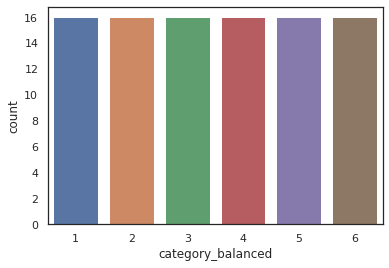

In [74]:
y_equidistant = codiv_country_analyze['category_equidistant']
y_balanced = codiv_country_analyze['category_balanced']
X = codiv_country_analyze.drop(['Total Infected Log10','category_balanced','category_equidistant'], axis=1) 
sns.countplot(y_balanced)

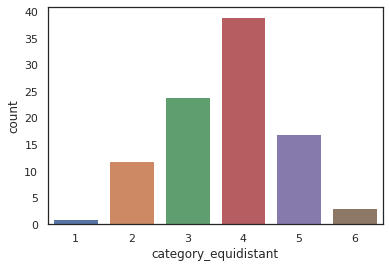

In [75]:
sns.countplot(y_equidistant)

Input matrix
---

In [76]:
X.sample(10)

,Urban Pop,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Temp_mean_jan_apr,Quarantine_cat,Restrictions_cat,Schools_cat
40,63.0,2.8,24.92,23.02,27.25,36.8,24.3,50.425509,1.528869,11.257547,7.184383,6.767667,0,1,1
80,55.0,4.6,11.89,8.36,16.95,44.5,22.5,50.245207,3.505128,10.165068,8.187018,3.086833,0,0,0
31,58.0,2.6,23.26,15.96,34.46,38.1,28.8,52.291238,0.000000,8.392279,7.601659,0.493167,0,0,0
7,89.0,6.8,18.37,13.83,22.39,32.3,26.4,49.552122,4.390116,10.007131,4.748105,19.600333,0,0,0
85,74.0,4.7,15.22,11.94,19.47,42.4,25.7,50.427125,1.726653,11.308071,12.346322,1.034167,0,1,1
66,52.0,0.3,21.14,19.65,22.75,18.4,5.8,49.336114,0.000000,7.564336,3.755539,28.550167,0,0,0
73,60.0,6.5,16.16,9.98,25.90,40.7,28.0,51.530707,1.127235,9.647024,6.541954,-0.699333,0,1,1
93,83.0,2.8,23.66,21.11,26.84,40.5,22.3,50.635275,2.131844,10.646880,9.631694,5.226000,0,1,1
23,74.0,6.5,19.68,13.10,28.54,42.1,34.3,50.808589,1.929313,10.038896,7.231339,0.598167,0,1,1
94,96.0,2.8,33.57,23.14,49.85,35.0,16.8,51.721543,0.000000,9.750188,9.296212,22.564167,0,0,0


splitting in training and test, these will be used for the confusion matrix

In [77]:
from sklearn.model_selection import train_test_split
X_tr_equid, X_te_equid, y_tr_equid, y_te_equid = train_test_split(X, y_equidistant, test_size=0.15, random_state=1)
print('Train set equidistant:', X_tr_equid.shape, y_tr_equid.shape)
print('Testn set equidistant:', X_te_equid.shape, y_te_equid.shape)
X_tr_balan, X_te_balan, y_tr_balan, y_te_balan = train_test_split(X, y_balanced, test_size=0.15, random_state=1)
print('Train set balanced:', X_tr_balan.shape, y_tr_balan.shape)
print('Testn set balanced:', X_te_balan.shape, y_te_balan.shape)

Train set equidistant: (81, 15) (81,)
Testn set equidistant: (15, 15) (15,)
Train set balanced: (81, 15) (81,)
Testn set balanced: (15, 15) (15,)


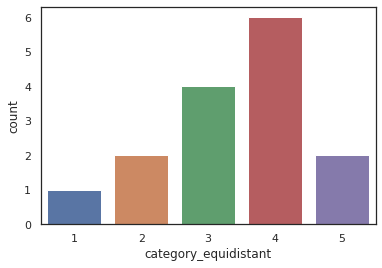

In [78]:
sns.countplot(y_te_equid)

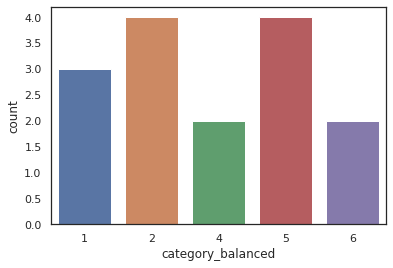

In [79]:
sns.countplot(y_te_balan)

---
Baseline classifier most frequent - equidistant bins -  Total Infected log10 feature
---

I will use the "most-frequent" baseline.

For the evaluation, I will not split into train/test sets as the number of data points is very low. Instead, I will report the cross-validated score.

To tune  the optimal depth of the tree, I will use cross validation with the default `cv=5` value from Scikit-learn: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html

In [80]:
from sklearn.model_selection import KFold
cv_strategy = KFold(n_splits=5, shuffle=False, random_state=None)

In [81]:
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X, y_equidistant)
dummy_clf.predict(X)
print("scores baseline mostfrequent classifier equidistant = ", dummy_clf.score(X, y_equidistant))

scores baseline mostfrequent classifier equidistant =  0.40625


In [82]:
df_resultat.at[df_resultat.index==0,"method"]="baseline_equidistant"
Baseline_training_scores = cross_validate(dummy_clf, X, y_equidistant, cv=cv_strategy)
df_resultat.at[df_resultat.index==0,"Cross-validation"]=np.mean(Baseline_training_scores['test_score'])
print("crossvalidation baseline mostfrequent classifier equidistant = ", np.mean(Baseline_training_scores['test_score']) )

crossvalidation baseline mostfrequent classifier equidistant =  0.4057894736842105


with split for the confusion matrix

In [83]:
from sklearn.metrics import confusion_matrix
dummy_clf= DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_tr_equid, y_tr_equid)
y_pred_equid=dummy_clf.predict(X_te_equid)
matrix = confusion_matrix(y_true=y_te_equid, y_pred=y_pred_equid)
print(matrix)

[[0 0 0 1 0]
 [0 0 0 2 0]
 [0 0 0 4 0]
 [0 0 0 6 0]
 [0 0 0 2 0]]


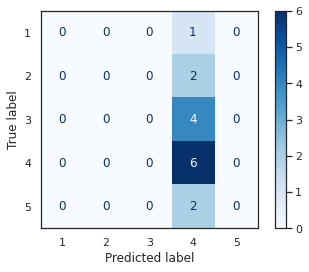

In [84]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dummy_clf, X_te_equid, y_te_equid, cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

the highest class in test datas are in class 4, 6/15 he recognized good 0.40

Baseline  most frequent - balanced bins - Total Infected log10 feature
---

In [85]:
df_resultat.at[df_resultat.index==1,"method"]="baseline balanced bins"
Baseline_training_scores = cross_validate(dummy_clf, X, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==1,"Cross-validation"]=np.mean(Baseline_training_scores['test_score'])
print("crossvalidation baseline mostfrequent classifier balanced = ", np.mean(Baseline_training_scores['test_score']) )

crossvalidation baseline mostfrequent classifier balanced =  0.07263157894736842


The confusion_matrix with split

In [86]:
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_tr_balan, y_tr_balan)
y_pred_balan=dummy_clf.predict(X_te_balan)

In [87]:
matrix = confusion_matrix(y_true=y_te_balan, y_pred=y_pred_balan)
print(matrix)

[[0 0 3 0 0 0]
 [0 0 4 0 0 0]
 [0 0 0 0 0 0]
 [0 0 2 0 0 0]
 [0 0 4 0 0 0]
 [0 0 2 0 0 0]]


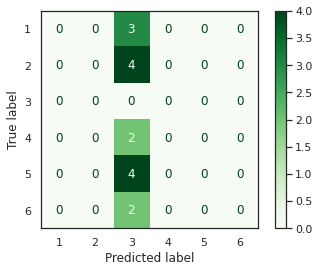

In [88]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dummy_clf, X_te_balan, y_te_balan, cmap=plt.cm.Greens,display_labels=[1,2,3,4,5,6])

---
Decision Tree - equidistant bins - Total Infected log10 feature
---

In [89]:
from sklearn.tree import DecisionTreeClassifier

Tuning the decision tree on the complete data X, y with cross-validation.

In [90]:
depths=range(1,15)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for depth in depths:
    DecisionTree = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=depth)
    DecisionTree.fit(X, y_equidistant)
    cv_val_scores = cross_val_score(DecisionTree, X, y_equidistant, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(DecisionTree.score(X, y_equidistant))
    Text="depth %d, cv_val_scores_mean %f  score %f"%(depth,cv_val_scores.mean(),DecisionTree.score(X, y_equidistant))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 1, cv_val_scores_mean 0.311053  score 0.489583
depth 2, cv_val_scores_mean 0.415263  score 0.562500
depth 3, cv_val_scores_mean 0.436842  score 0.604167
depth 4, cv_val_scores_mean 0.353158  score 0.666667
depth 5, cv_val_scores_mean 0.344737  score 0.697917
depth 6, cv_val_scores_mean 0.354737  score 0.739583
depth 7, cv_val_scores_mean 0.313158  score 0.770833
depth 8, cv_val_scores_mean 0.312632  score 0.854167
depth 9, cv_val_scores_mean 0.323684  score 0.906250
depth 10, cv_val_scores_mean 0.302632  score 0.979167
depth 11, cv_val_scores_mean 0.302632  score 1.000000
depth 12, cv_val_scores_mean 0.302632  score 1.000000
depth 13, cv_val_scores_mean 0.302632  score 1.000000
depth 14, cv_val_scores_mean 0.302632  score 1.000000


In [91]:
print("The maximum is by depth = ",np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)
OptDepth=np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1

The maximum is by depth =  3


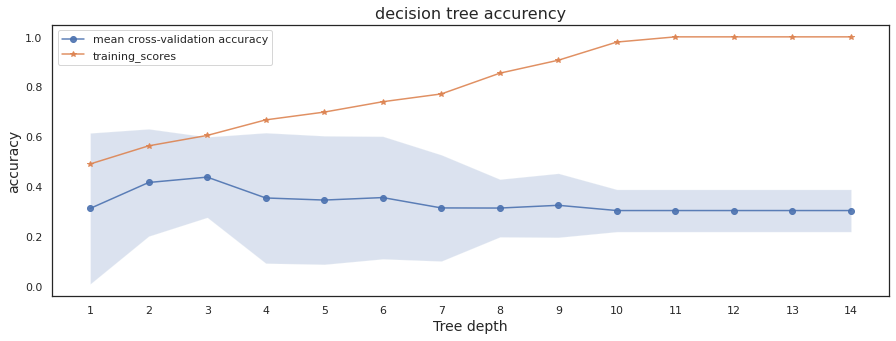

In [92]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(depths, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(depths, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(depths, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="decision tree accurency"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Tree depth', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(depths)
ax.legend()

computing the tree again with the optimal depth

In [93]:
DecisionTree = DecisionTreeClassifier(
    criterion='gini',  random_state=0, max_depth=OptDepth)
# Fit decision tree
DecisionTree.fit(X, y_equidistant)
Tree_scores = cross_validate(DecisionTree, X, y_equidistant, cv=cv_strategy)
df_resultat.at[df_resultat.index==2,"method"]="decision-tree equidistant"
df_resultat.at[df_resultat.index==2,"Cross-validation"]=np.mean(Tree_scores['test_score'])
                                                              
print("score DecistionTree equidistant =",DecisionTree.score(X, y_equidistant))
print("cross validation DecisionTree equidistant =",np.mean(Tree_scores['test_score']))

score DecistionTree equidistant = 0.6041666666666666
cross validation DecisionTree equidistant = 0.43684210526315786


confusion matrix with the optimal depth

In [94]:
from sklearn.metrics import confusion_matrix
DecisionTree_confusion = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=OptDepth)
DecisionTree_confusion.fit(X_tr_equid, y_tr_equid)
confusion_matrix(y_te_equid, DecisionTree_confusion.predict(X_te_equid))

array([[0, 0, 0, 1, 0],
       [0, 0, 1, 1, 0],
       [0, 1, 0, 3, 0],
       [0, 0, 2, 4, 0],
       [0, 0, 0, 1, 1]])

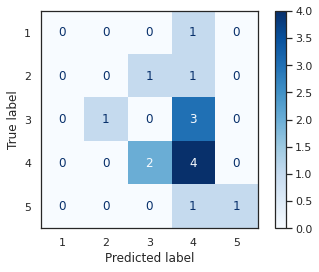

In [95]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(DecisionTree_confusion, X_te_equid, y_te_equid,cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

Display the tree

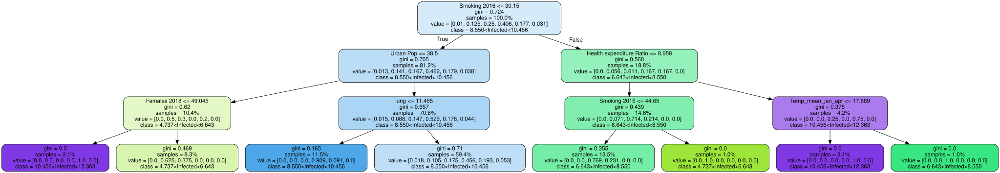

In [96]:
from sklearn.tree import export_graphviz
import os
os.environ["PATH"] += os.pathsep + 'D:/Program Files (x86)/Graphviz2.38/bin/'
# Export decision tree
dot_data = export_graphviz(
    DecisionTree, out_file=None,
    feature_names=X.columns, class_names=[Level1_equidistant,Level2_equidistant, Level3_equidistant,Level4_equidistant,Level5_equidistant,Level6_equidistant],
    filled=True, rounded=True, proportion=True   
)
import graphviz

# Display decision tree
graphviz.Source(dot_data)

---
Decision Tree - balanced bins - Total Infected log10 feature
---

In [97]:
depths=range(1,15)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for depth in depths:
    DecisionTree = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=depth)
    DecisionTree.fit(X, y_balanced)
    cv_val_scores = cross_val_score(DecisionTree, X, y_balanced, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(DecisionTree.score(X, y_balanced))
    Text="depth %d, cv_val_scores_mean %f  score %f"%(depth,cv_val_scores.mean(),DecisionTree.score(X, y_balanced))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 1, cv_val_scores_mean 0.145789  score 0.250000
depth 2, cv_val_scores_mean 0.229474  score 0.354167
depth 3, cv_val_scores_mean 0.239474  score 0.458333
depth 4, cv_val_scores_mean 0.186316  score 0.552083
depth 5, cv_val_scores_mean 0.206316  score 0.635417
depth 6, cv_val_scores_mean 0.269474  score 0.770833
depth 7, cv_val_scores_mean 0.301579  score 0.843750
depth 8, cv_val_scores_mean 0.269474  score 0.916667
depth 9, cv_val_scores_mean 0.270526  score 0.927083
depth 10, cv_val_scores_mean 0.311579  score 0.968750
depth 11, cv_val_scores_mean 0.290526  score 0.989583
depth 12, cv_val_scores_mean 0.291053  score 1.000000
depth 13, cv_val_scores_mean 0.301579  score 1.000000
depth 14, cv_val_scores_mean 0.291579  score 1.000000


In [98]:
print("The maximum is by depth_balanced = ",np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)
OptDepth=np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1

The maximum is by depth_balanced =  10


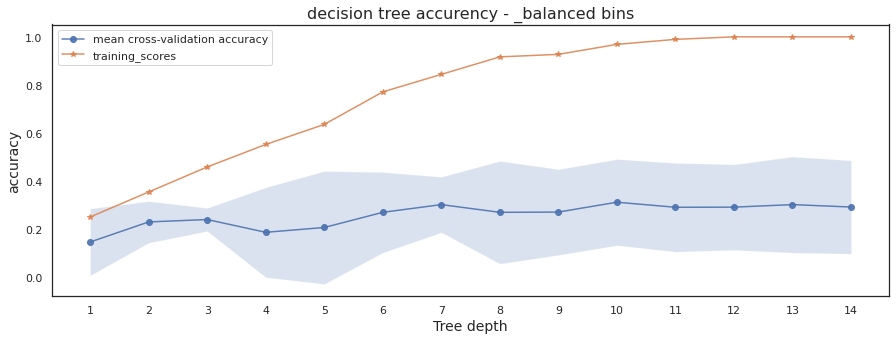

In [99]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(depths, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(depths, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(depths, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="decision tree accurency - _balanced bins"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Tree depth', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(depths)
ax.legend()

In [100]:
DecisionTree = DecisionTreeClassifier(
    criterion='gini',  random_state=0, max_depth=OptDepth)
# Fit decision tree
DecisionTree.fit(X, y_balanced)
# Get score
Tree_scores = cross_validate(DecisionTree, X, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==3,"method"]="decision-tree _balanced bins"
df_resultat.at[df_resultat.index==3,"Cross-validation"]=np.mean(Tree_scores['test_score'])
print("score DecisionTree _balanced bins =",DecisionTree.score(X, y_balanced))
print("cross validation DecisionTree balanced bins=",np.mean(Tree_scores['test_score']))

score DecisionTree _balanced bins = 0.96875
cross validation DecisionTree balanced bins= 0.31157894736842107


Depending on the seed, the results can vary, but the optimal models always have a large depth (usually between 7-10).

The decision tree performs better than the baseline.

In [101]:
from sklearn.metrics import confusion_matrix
DecisionTree_confusion = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=OptDepth)
DecisionTree_confusion.fit(X_tr_balan, y_tr_balan)
confusion_matrix(y_te_balan, DecisionTree_confusion.predict(X_te_balan))

array([[0, 0, 2, 0, 1, 0],
       [1, 2, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0],
       [0, 2, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 3],
       [1, 0, 0, 0, 0, 1]])

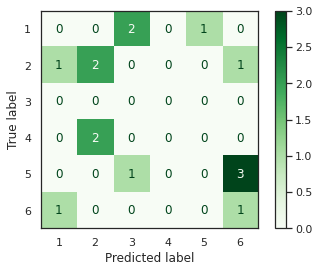

In [102]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(DecisionTree_confusion, X_te_balan, y_te_balan,cmap=plt.cm.Greens,display_labels=[1,2,3,4,5,6])

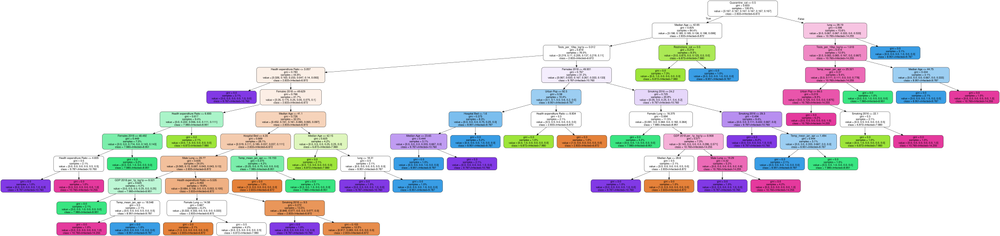

In [103]:
from sklearn.tree import export_graphviz
import os
os.environ["PATH"] += os.pathsep + 'D:/Program Files (x86)/Graphviz2.38/bin/'
# Export decision tree
dot_data = export_graphviz(
    DecisionTree, out_file=None,
    feature_names=X.columns, class_names=[Level1_balanced,Level2_balanced, Level3_balanced,Level4_balanced,Level5_balanced,Level6_balanced],
    filled=True, rounded=True, proportion=True   
)
import graphviz

# Display decision tree
graphviz.Source(dot_data)

---
Random forests - equidistant bins - Total Infected log10 feature
---

I will use the same methodology as above. I use 250 for the number of `n_estimators` as this seems to be a good default value in practice from my research on online forums.


In [104]:
from sklearn.ensemble import RandomForestClassifier
Estimators=range(100,2000,100)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for Estimator in Estimators:
    forest = RandomForestClassifier(n_estimators=Estimator,random_state=0)
    forest.fit(X, y_equidistant)
    cv_val_scores = cross_val_score(forest, X, y_equidistant, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(forest.fit(X, y_equidistant).score(X, y_equidistant))
    Text="depth %d, cv_val_scores_mean %f  score %f"%(Estimator,cv_val_scores.mean(),forest.score(X, y_equidistant))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 100, cv_val_scores_mean 0.436842  score 1.000000
depth 200, cv_val_scores_mean 0.436316  score 1.000000
depth 300, cv_val_scores_mean 0.446842  score 1.000000
depth 400, cv_val_scores_mean 0.427368  score 1.000000
depth 500, cv_val_scores_mean 0.426842  score 1.000000
depth 600, cv_val_scores_mean 0.447895  score 1.000000
depth 700, cv_val_scores_mean 0.447895  score 1.000000
depth 800, cv_val_scores_mean 0.447895  score 1.000000
depth 900, cv_val_scores_mean 0.447895  score 1.000000
depth 1000, cv_val_scores_mean 0.458421  score 1.000000
depth 1100, cv_val_scores_mean 0.437368  score 1.000000
depth 1200, cv_val_scores_mean 0.437368  score 1.000000
depth 1300, cv_val_scores_mean 0.447895  score 1.000000
depth 1400, cv_val_scores_mean 0.457895  score 1.000000
depth 1500, cv_val_scores_mean 0.468421  score 1.000000
depth 1600, cv_val_scores_mean 0.468421  score 1.000000
depth 1700, cv_val_scores_mean 0.457895  score 1.000000
depth 1800, cv_val_scores_mean 0.468421  score 1.000000
d

In [105]:
print("The maximum is by Estimator_balanced = ",(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100)
OptEstimator=(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100

The maximum is by Estimator_balanced =  1500


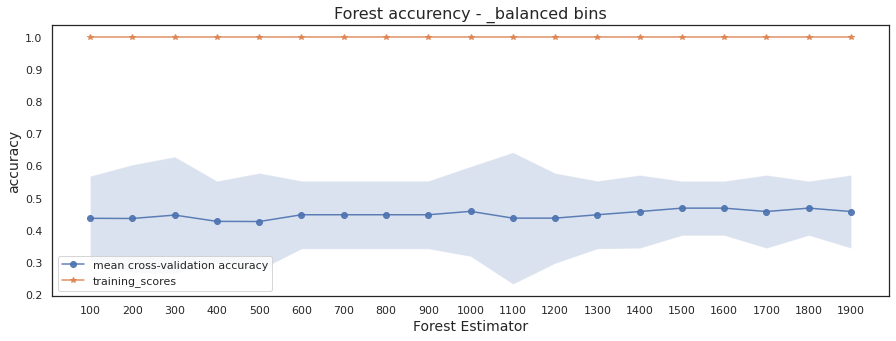

In [106]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(Estimators, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(Estimators, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(Estimators, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="Forest accurency - _balanced bins"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Forest Estimator', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(Estimators)
ax.legend()

compute for the optimal estimator

In [107]:
# Build a forest and compute the feature importances
forest = RandomForestClassifier(n_estimators=OptEstimator,random_state=0)
forest.fit(X, y_equidistant)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1500,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [108]:
# Mean test score of a 250x decision tree 
Forest_scores = cross_validate(forest, X, y_equidistant, cv=cv_strategy)
print('Forest by equidistant interval score {:.3f}'.format(forest.score(X, y_equidistant)))
df_resultat.at[df_resultat.index==4,"method"]="Forest equidistant"
df_resultat.at[df_resultat.index==4,"Cross-validation"]=np.mean(Forest_scores['test_score'])
print('Forest by equidistant interval cross validation {:.3f}'.format(np.mean(Forest_scores['test_score'])))

Forest by equidistant interval score 1.000
Forest by equidistant interval cross validation 0.468


confusion matrix  with split data

In [109]:
forest_confusion = RandomForestClassifier(n_estimators=OptEstimator,random_state=0)
forest_confusion.fit(X_tr_equid, y_tr_equid)
confusion_matrix(y_te_equid, forest_confusion.predict(X_te_equid))

array([[0, 0, 0, 1, 0],
       [0, 0, 1, 1, 0],
       [0, 1, 1, 2, 0],
       [0, 0, 1, 5, 0],
       [0, 0, 1, 1, 0]])

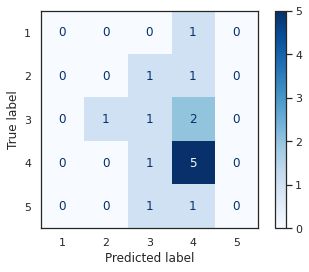

In [110]:
plot_confusion_matrix(forest_confusion, X_te_equid,y_te_equid,cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

features importances

In [111]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],axis=0)
indices = np.argsort(importances)[::-1]

Feature ranking by equidistand interval:
1. feature Smoking 2016 (0.090693)
2. feature Health expenditure Ratio (0.087558)
3. feature Urban Pop (0.086990)
4. feature GDP 2018 per_1p_log1p (0.083477)
5. feature Females 2018 (0.083148)
6. feature lung (0.082927)
7. feature Median Age (0.081901)
8. feature Temp_mean_jan_apr (0.076891)
9. feature Male Lung (0.076778)
10. feature Hospital Bed (0.072853)
11. feature Female Lung (0.069951)
12. feature Tests_per_10kp_log1p (0.051117)
13. feature Quarantine_cat (0.026358)
14. feature Restrictions_cat (0.016839)
15. feature Schools_cat (0.012519)


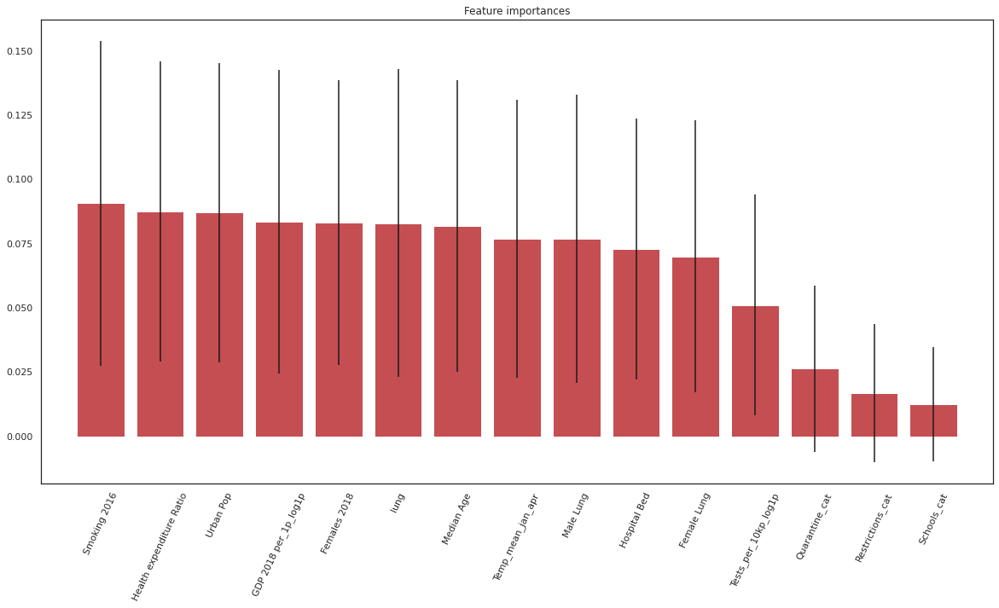

In [112]:
# Print the feature ranking
print("Feature ranking by equidistand interval:")

for f in range(X.shape[1]):
    print("%d. feature %s (%f)" % (f + 1, X.columns[indices[f]], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation = 65)
plt.xlim([-1, X.shape[1]])
plt.show()

Those results make sense as the "Urban Population" is directly affecting how much the epidemic is spreading. Also, if the population is older, then it will also affect the number of people that are detected.

I was maybe expecting the "Smoking" to be higher, but it's difficult to know its effect on the disease.

Regarding the quarantine measures, the quarantine/schools/restrictions are at the end of the results, but I think that this is because it highly depends on how this is applied. For instance, in China or Germany, people going to the supermarket have to wear masks which is not the case for instance in Switzerland or other countries ex. in Europe. Distance measures are also not the same.

---
Random forest - Balanced bins - Total Infected log10 feature
---

In [113]:
Estimators=range(100,2000,100)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for Estimator in Estimators:
    forest = RandomForestClassifier(n_estimators=Estimator,random_state=0)
    forest.fit(X, y_balanced)
    cv_val_scores = cross_val_score(forest, X, y_balanced, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(forest.fit(X, y_balanced).score(X, y_balanced))
    Text="depth %d, cv_val_scores_mean %f  score %f"%(Estimator,cv_val_scores.mean(),forest.score(X, y_balanced))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 100, cv_val_scores_mean 0.250000  score 1.000000
depth 200, cv_val_scores_mean 0.292105  score 1.000000
depth 300, cv_val_scores_mean 0.301579  score 1.000000
depth 400, cv_val_scores_mean 0.312105  score 1.000000
depth 500, cv_val_scores_mean 0.312105  score 1.000000
depth 600, cv_val_scores_mean 0.302105  score 1.000000
depth 700, cv_val_scores_mean 0.312105  score 1.000000
depth 800, cv_val_scores_mean 0.291053  score 1.000000
depth 900, cv_val_scores_mean 0.291053  score 1.000000
depth 1000, cv_val_scores_mean 0.291053  score 1.000000
depth 1100, cv_val_scores_mean 0.291053  score 1.000000
depth 1200, cv_val_scores_mean 0.281053  score 1.000000
depth 1300, cv_val_scores_mean 0.270526  score 1.000000
depth 1400, cv_val_scores_mean 0.281053  score 1.000000
depth 1500, cv_val_scores_mean 0.281053  score 1.000000
depth 1600, cv_val_scores_mean 0.281053  score 1.000000
depth 1700, cv_val_scores_mean 0.281053  score 1.000000
depth 1800, cv_val_scores_mean 0.281053  score 1.000000
d

In [114]:
print("The maximum is by Estimator_balanced = ",(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100)
OptEstimator=(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100

The maximum is by Estimator_balanced =  400


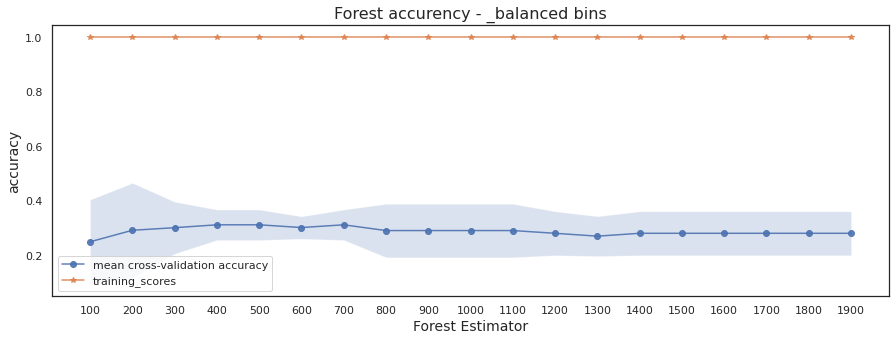

In [115]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(Estimators, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(Estimators, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(Estimators, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="Forest accurency - _balanced bins"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Forest Estimator', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(Estimators)
ax.legend()

In [116]:
from sklearn.model_selection import cross_validate
Forest_scores = cross_validate(forest, X, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==5,"method"]="Forest balanced bins"
df_resultat.at[df_resultat.index==5,"Cross-validation"]=np.mean(Forest_scores['test_score'])
print('Forest by balanced bins of element score {:.3f}'.format(forest.score(X, y_balanced)))
print('Forest by balanced bins of element - mean test {:.3f}'.format(np.mean(Forest_scores['test_score'])))

Forest by balanced bins of element score 1.000
Forest by balanced bins of element - mean test 0.281


confusion matrix

In [117]:
forest_confusion = RandomForestClassifier(n_estimators=OptEstimator,random_state=0)
forest_confusion.fit(X_tr_balan, y_tr_balan)
confusion_matrix(y_te_balan, forest_confusion.predict(X_te_balan))

array([[0, 1, 1, 0, 1, 0],
       [1, 2, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 1],
       [0, 1, 0, 0, 1, 2],
       [0, 0, 1, 0, 0, 1]])

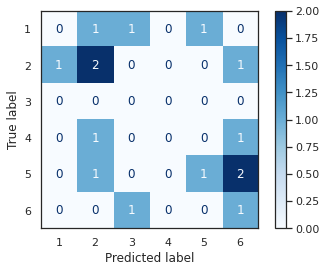

In [118]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(forest_confusion, X_te_balan, y_te_balan,cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

Compute feature importance

In [119]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

Feature ranking by balanced bins:
1. feature Urban Pop (0.087921)
2. feature Smoking 2016 (0.086729)
3. feature GDP 2018 per_1p_log1p (0.086522)
4. feature Health expenditure Ratio (0.084750)
5. feature Females 2018 (0.084178)
6. feature Median Age (0.083784)
7. feature Hospital Bed (0.077720)
8. feature Male Lung (0.074599)
9. feature lung (0.074206)
10. feature Temp_mean_jan_apr (0.073719)
11. feature Female Lung (0.066793)
12. feature Tests_per_10kp_log1p (0.054671)
13. feature Quarantine_cat (0.030948)
14. feature Schools_cat (0.018931)
15. feature Restrictions_cat (0.014529)


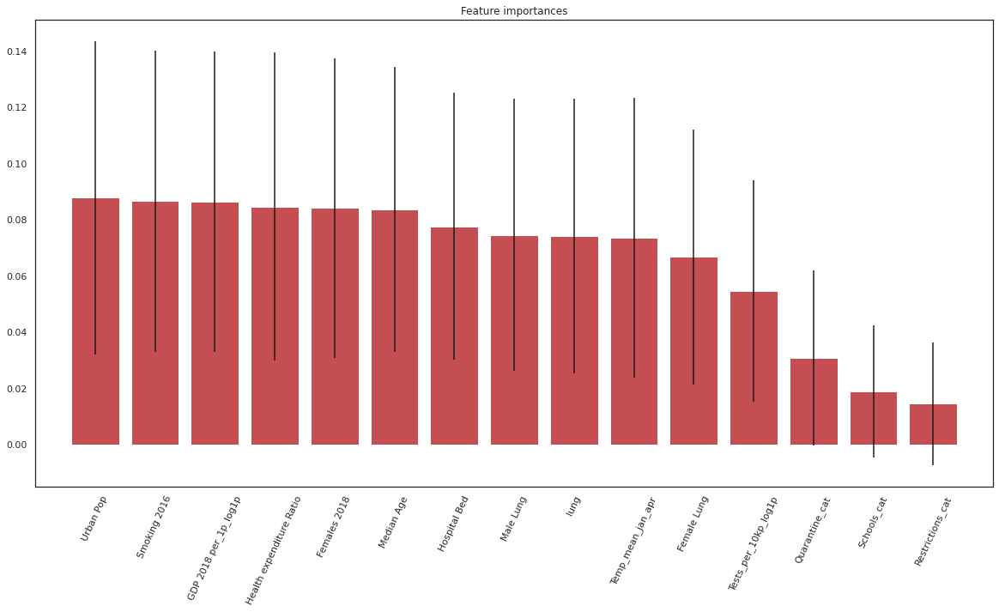

In [120]:
# Print the feature ranking
print("Feature ranking by balanced bins:")

for f in range(X.shape[1]):
    print("%d. feature %s (%f)" % (f + 1, X.columns[indices[f]], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation = 65)
plt.xlim([-1, X.shape[1]])
plt.show()

I think that this highlight an issue with the "balanced" approach: we are mixing together countries that have a very different number of infected people, in particular with the top bins ex. category 5 and 6.

---
Feature reduction to 2 and kneighbour classifier - equidistant bins - Total Infected log10 feature
---
feature reduction

In [121]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
# Apply PCA
pca.fit(X, y=None); # Unsupervised learning, no y variable
feature_2= pca.transform(X)
feature_2_df=pd.DataFrame(feature_2)
len_cluster, col=feature_2_df.shape

In [122]:
from sklearn.model_selection import train_test_split
X_fea_2_tr_equid, X_fea_2_te_equid, y_fea_2_tr_equid, y_fea_2_te_equid = train_test_split(feature_2, y_equidistant, test_size=0.15, random_state=1)
print('Train set equidistant:', X_fea_2_tr_equid.shape, y_fea_2_tr_equid.shape)
print('Testn set equidistant:', X_fea_2_te_equid.shape, y_fea_2_te_equid.shape)
X_fea_2_tr_balan, X_fea_2_te_balan, y_fea_2_tr_balan, y_fea_2_te_balan = train_test_split(feature_2, y_balanced, test_size=0.15, random_state=1)
print('Train set balanced:', X_fea_2_tr_balan.shape, y_fea_2_tr_balan.shape)
print('Testn set balanced:', X_fea_2_te_balan.shape, y_fea_2_te_balan.shape)

Train set equidistant: (81, 2) (81,)
Testn set equidistant: (15, 2) (15,)
Train set balanced: (81, 2) (81,)
Testn set balanced: (15, 2) (15,)


---
K neightbour classifier - equidistant bins - Total Infected log10 feature
---

In [123]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Create k-NN classifier
pipe = Pipeline([
    #('scaler', StandardScaler()), # With standardization
    ('scaler', None), # Better performance without standardization!
    ('knn', KNeighborsClassifier(
        n_jobs=-1 # As many parallel jobs as possible
    ))
])


i will use the weight distance   because i cant explain the result default=’uniform’

‘uniform’ : uniform weights. All points in each neighborhood are weighted equally.

‘distance’ : weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away

In [124]:
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
from sklearn import metrics
from sklearn.model_selection import cross_val_score
neighbors = list(range(1,35))
CV_scores = []


for n_neighborss in neighbors:
    weights='distance'
    feature1=pd.DataFrame(feature_2).loc[:][0]
    feature2=pd.DataFrame(feature_2).loc[:][1]
    h = .02  # step size in the mesh
    # we create an instance of Neighbours Classifier and fit the data.
    # Create a k-NN pipeline
    knn_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(n_neighbors=n_neighborss, weights=weights)) ])
    # Fit estimator
    knn_pipe.fit(feature_2, y_equidistant)
    scores = cross_val_score(knn_pipe,feature_2,y_equidistant,cv=cv_strategy )
    CV_scores.append(scores.mean())
Missclassification_Error = [1-x for x in CV_scores]
print("the optimal k is ",format(Missclassification_Error.index(min(Missclassification_Error))))
k_Optimal=Missclassification_Error.index(min(Missclassification_Error))

the optimal k is  5


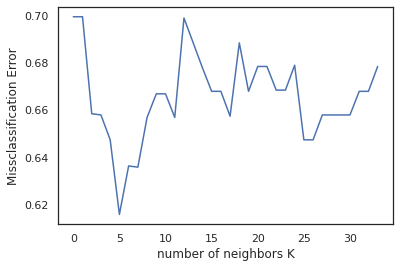

In [125]:
from matplotlib.legend_handler import HandlerLine2D
plt.plot(Missclassification_Error)
plt.xlabel("number of neighbors K")
plt.ylabel("Missclassification Error")
plt.show()

In [126]:
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
from sklearn.metrics import accuracy_score

# Create color maps
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF', '#EFFF00', '#B4FCFF', '#FFB4F5'])
cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF', '#FF00F7', '#00FFE6', '#FFA200'])

feature1=pd.DataFrame(feature_2).loc[:][0]
feature2=pd.DataFrame(feature_2).loc[:][1]

weights='distance'
h = .02  # step size in the mesh
# we create an instance of Neighbours Classifier and fit the data.
# Create a k-NN pipeline
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal))
    #, weights=weights))
])
# Fit estimator
knn_pipe.fit(feature_2, y_equidistant)
# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
feature1_min, feature1_max = feature1.min() - 1, feature1.max() + 1
feature2_min, feature2_max = feature2.min() - 1, feature2.max() + 1
xx, yy = np.meshgrid(np.arange(feature1_min, feature1_max, h), np.arange(feature2_min, feature2_max, h))
Z = knn_pipe.predict(np.c_[xx.ravel(), yy.ravel()])
Zo = Z.reshape(xx.shape)

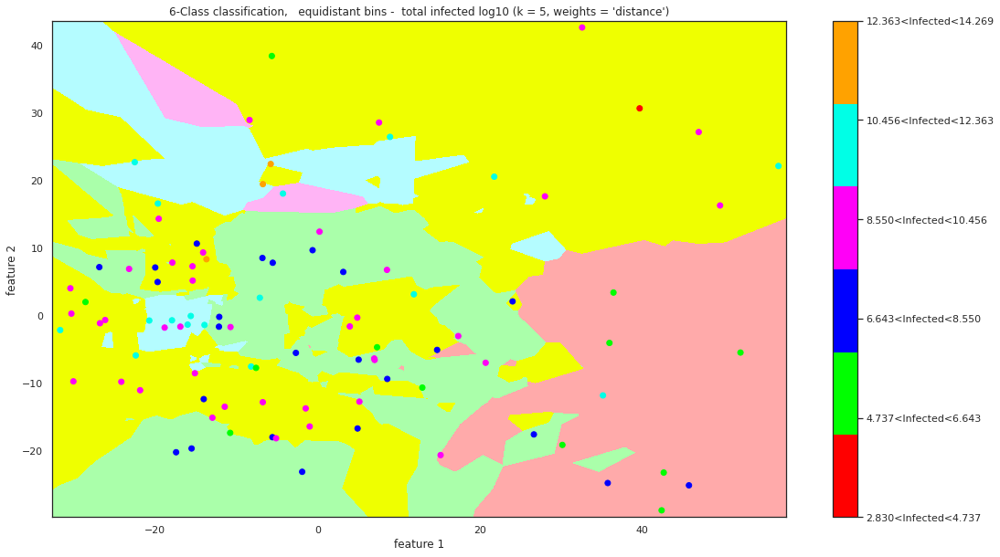

In [127]:
# Put the result into a color plot
plt.figure(figsize=(18, 10))
plt.pcolormesh(xx, yy, Zo, cmap=cmap_light)
#Label1=pd.DataFrame(list(class_index.items()))
Label1=pd.DataFrame([1,2,3,4,5])
# Plot also the training points
plt.scatter(feature1, feature2, c=y_equidistant, cmap=cmap_bold)
#color bar with label
cbar = plt.colorbar() 
cbar.ax.set_yticklabels([Level1_equidistant,Level2_equidistant,Level3_equidistant,Level4_equidistant,Level5_equidistant,Level6_equidistant])
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.title("6-Class classification,   equidistant bins -  total infected log10 (k = %i, weights = '%s')" % (k_Optimal, weights))
plt.show()

score and cross validation

In [128]:
from sklearn.model_selection import cross_validate
knn_scores = cross_validate(knn_pipe, feature_2, y_equidistant, cv=cv_strategy)
df_resultat.at[df_resultat.index==6,"method"]="knn equidistant bins"
df_resultat.at[df_resultat.index==6,"Cross-validation"]=np.mean(knn_scores['test_score'])
print('knn by equidistant bins of element score {:.3f}'.format(knn_pipe.score(feature_2, y_equidistant)))
print('knn by equidistant bins of element - mean test {:.3f}'.format(np.mean(knn_scores['test_score'])))

knn by equidistant bins of element score 0.562
knn by equidistant bins of element - mean test 0.332


For the confusion matrix i use the split data

In [129]:
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal, weights=weights))
])
# Fit estimator
knn_confusion=knn_pipe.fit(X_fea_2_tr_equid, y_fea_2_tr_equid)
knn_predict = knn_pipe.predict(X_fea_2_te_equid)
confusion_matrix(y_fea_2_te_equid, knn_predict)

array([[0, 0, 0, 1, 0],
       [0, 0, 2, 0, 0],
       [0, 1, 1, 2, 0],
       [0, 0, 1, 4, 1],
       [0, 0, 1, 1, 0]])

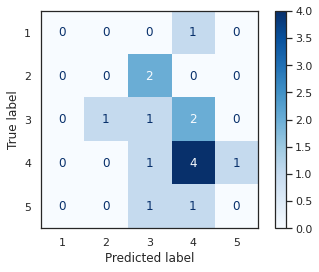

In [130]:
plot_confusion_matrix(knn_confusion, X_fea_2_te_equid, y_fea_2_te_equid,cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

In [131]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_fea_2_te_equid, y_pred=knn_predict))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.20      0.25      0.22         4
           4       0.50      0.67      0.57         6
           5       0.00      0.00      0.00         2

    accuracy                           0.33        15
   macro avg       0.14      0.18      0.16        15
weighted avg       0.25      0.33      0.29        15



---
K neightbour classifier - balanced bins - Total Infected log10 feature
---
optimize the n_neighbors, over 35 i am getting cpu problem
higher is the n_neighbors more is he isolating every point, it means high n_neighbors would only means there is no big area available with same label elements

the optimal k is  6


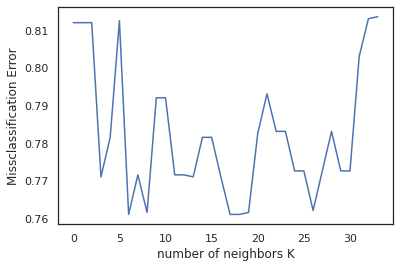

In [132]:
neighbors = list(range(1,35))
CV_scores = []

for n_neighborss in neighbors:
    weights='distance'
    feature1=pd.DataFrame(feature_2).loc[:][0]
    feature2=pd.DataFrame(feature_2).loc[:][1]
    h = .02  # step size in the mesh
    # we create an instance of Neighbours Classifier and fit the data.
    # Create a k-NN pipeline
    knn_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(n_neighbors=n_neighborss, weights=weights))
    ])
    # Fit estimator
    knn_pipe.fit(feature_2, y_balanced)
    #
    scores = cross_val_score(knn_pipe,feature_2,y_balanced,cv=cv_strategy )
    CV_scores.append(scores.mean())
    
Missclassification_Error = [1-x for x in CV_scores]
print("the optimal k is ",format(Missclassification_Error.index(min(Missclassification_Error))))
k_Optimal=Missclassification_Error.index(min(Missclassification_Error))
    
from matplotlib.legend_handler import HandlerLine2D
plt.plot( Missclassification_Error)
plt.xlabel("number of neighbors K")
plt.ylabel("Missclassification Error")
plt.show()

In [133]:
# Create color maps
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF', '#EFFF00', '#B4FCFF', '#FFB4F5'])
cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF', '#FF00F7', '#00FFE6', '#FFA200'])
#
feature1=pd.DataFrame(feature_2).loc[:][0]
feature2=pd.DataFrame(feature_2).loc[:][1]
#
weights='distance'
h = .02  # step size in the mesh
# Create a k-NN pipeline
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal, weights=weights))
])
# Fit estimator
knn_pipe.fit(feature_2, y_balanced)
# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
feature1_min, feature1_max = feature1.min() - 1, feature1.max() + 1
feature2_min, feature2_max = feature2.min() - 1, feature2.max() + 1
xx, yy = np.meshgrid(np.arange(feature1_min, feature1_max, h), np.arange(feature2_min, feature2_max, h))
Z = knn_pipe.predict(np.c_[xx.ravel(), yy.ravel()])
Zo = Z.reshape(xx.shape)

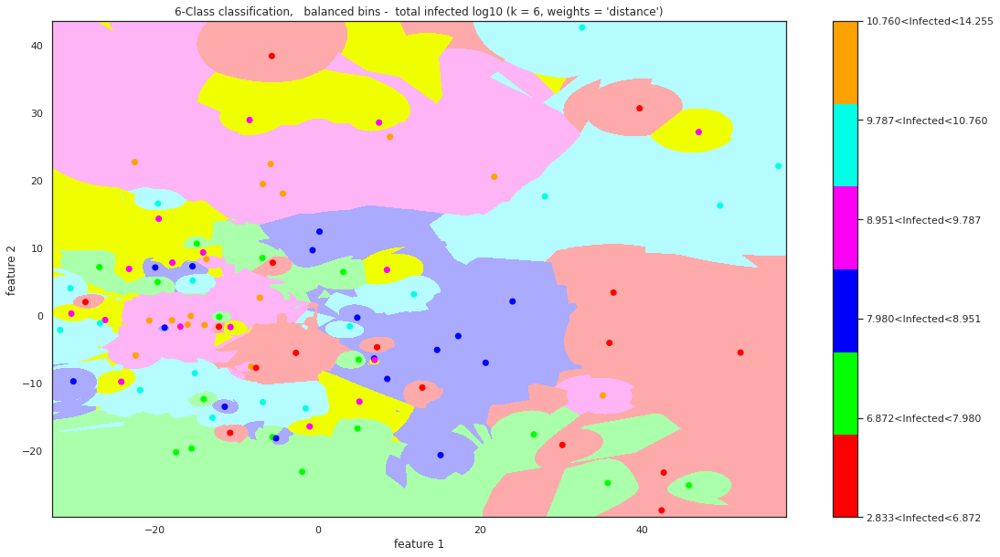

In [134]:
# Put the result into a color plot
plt.figure(figsize=(18, 10))
plt.pcolormesh(xx, yy, Zo, cmap=cmap_light)
#Label1=pd.DataFrame(list(class_index.items()))
Label1=pd.DataFrame([1,2,3,4,5])
# Plot also the training points
plt.scatter(feature1, feature2, c=y_balanced, cmap=cmap_bold)
cbar = plt.colorbar() 
cbar.ax.set_yticklabels([Level1_balanced,Level2_balanced,Level3_balanced,Level4_balanced,Level5_balanced,Level6_balanced])
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.title("6-Class classification,   balanced bins -  total infected log10 (k = %i, weights = '%s')" % (k_Optimal, weights))

plt.show()

In [135]:
from sklearn.model_selection import cross_validate
knn_scores = cross_validate(knn_pipe, feature_2, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==7,"method"]="knn balanced bins"
df_resultat.at[df_resultat.index==7,"Cross-validation"]=np.mean(knn_scores['test_score'])
print('knn by equidistant bins of element score {:.3f}'.format(knn_pipe.score(feature_2, y_balanced)))
print('knn by equidistant bins of element - mean test_score {:.3f}'.format(np.mean(knn_scores['test_score'])))

knn by equidistant bins of element score 1.000
knn by equidistant bins of element - mean test_score 0.187


In [136]:
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal, weights=weights))
])
# Fit estimator
knn_confusion=knn_pipe.fit(X_fea_2_tr_balan, y_fea_2_tr_balan)
knn_predict = knn_pipe.predict(X_fea_2_te_balan)

In [137]:
confusion_matrix(y_fea_2_te_balan, knn_predict)

array([[0, 1, 1, 0, 1, 0],
       [1, 2, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 1, 0],
       [0, 2, 1, 0, 0, 1],
       [0, 0, 0, 2, 0, 0]])

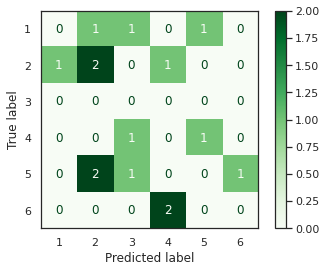

In [138]:
plot_confusion_matrix(knn_confusion, X_fea_2_te_balan, y_fea_2_te_balan,cmap=plt.cm.Greens,display_labels=[1,2,3,4,5,6])

---
summary - Total Infected log10 feature
---

In [139]:
df_resultat

,method,Cross-validation
0,baseline_equidistant,0.405789
1,baseline balanced bins,0.0726316
2,decision-tree equidistant,0.436842
3,decision-tree _balanced bins,0.311579
4,Forest equidistant,0.468421
5,Forest balanced bins,0.281053
6,knn equidistant bins,0.332105
7,knn balanced bins,0.187368


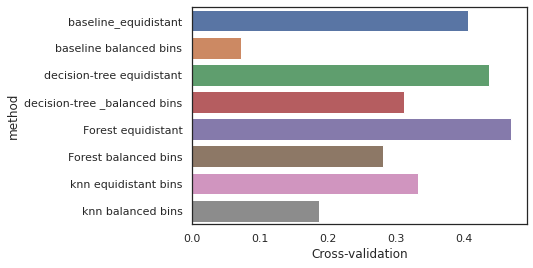

In [140]:
sns.barplot(x=df_resultat["Cross-validation"],y=df_resultat['method'])
plt.show()

Equidistant bins deliver better resultat
---
---
lets analyze  the deaths ratio feature 
---
codiv_csse["Deaths Ratio"]=codiv_csse["Deaths"]*1000/codiv_csse["Infected"]

In [141]:
# Working on a copy
codiv_country_analyze = codiv_country.copy()

# Creating categorical variables
codiv_country_analyze['Quarantine_cat'] = codiv_country_analyze['Quarantine'].notnull().astype(int)
codiv_country_analyze['Restrictions_cat'] = codiv_country_analyze['Restrictions'].notnull().astype(int)
codiv_country_analyze['Schools_cat'] = codiv_country_analyze['Schools'].notnull().astype(int)

# 
codiv_country_analyze=codiv_country_analyze.drop([
    'Quarantine','Schools','Restrictions', # now categorical
    'Country', # not helpful
    'Total Deaths','Total Infected','Total Active','Total Recovered', 
    "Total Deaths Log10","Total Recovered Log10","Total Active Log10","Total Infected Log10"
], axis=1)

codiv_country_analyze.sample(10)

,Urban Pop,Hospital Bed,lung,Female Lung,Male Lung,Median Age,Smoking 2016,Females 2018,Tests_per_10kp_log1p,GDP 2018 per_1p_log1p,Health expenditure Ratio,Deaths Ratio,Temp_mean_jan_apr,Quarantine_cat,Restrictions_cat,Schools_cat
74,66.0,3.4,13.350000,9.140000,19.180000,42.2,22.7,52.711962,0.000000,10.069178,8.969574,42.582603,10.727333,0,1,1
88,70.0,2.3,23.540000,10.970000,38.830000,31.6,32.7,50.437152,0.000000,8.124028,7.232457,44.976077,13.626833,0,0,0
21,78.0,5.2,23.300000,20.530000,26.670000,41.5,35.2,50.332850,0.000000,9.086113,11.711327,41.578947,24.168000,0,0,0
89,76.0,2.7,35.630000,21.200000,55.260000,30.9,27.2,50.677813,0.000000,9.121162,4.216303,27.669461,7.108833,0,1,1
23,74.0,6.5,19.680000,13.100000,28.540000,42.1,34.3,50.808589,1.929313,10.038896,7.231339,34.858388,0.598167,0,1,1
9,79.0,11.0,9.460000,2.830000,21.510000,40.0,26.7,53.456054,2.886611,8.750674,5.925786,5.520262,-4.086833,0,0,0
57,84.0,1.5,27.850000,23.430000,33.140000,28.3,14.0,51.089281,0.000000,9.155749,5.516541,107.608580,15.635500,0,0,0
63,21.0,0.3,24.304479,18.355104,32.340625,24.1,22.8,54.535343,0.000000,6.905444,5.553295,4.683841,10.997833,0,0,0
55,93.0,4.7,12.050000,6.660000,19.150000,41.8,25.5,49.873308,3.050880,10.403092,9.340999,10.273973,13.169333,0,0,0
34,85.0,4.3,20.620000,18.300000,23.490000,44.5,43.4,50.916202,0.000000,9.948424,8.041390,58.245614,8.631000,0,0,0


In [142]:
columns = ['method','Cross-validation']
index=range(8)
df_resultat = pd.DataFrame(index=index, columns=columns)

Balanced bins

In [143]:
codiv_country_analyze['Deaths Ratio'].describe()

count     96.000000
mean      39.789409
std       37.227953
min        0.000000
25%       13.692410
50%       29.641373
75%       49.962350
max      163.442474
Name: Deaths Ratio, dtype: float64

In [144]:
codiv_country_analyze['category_balanced'], bin_edges_balanced=pd.qcut(codiv_country_analyze['Deaths Ratio'], q=6,labels=False, retbins=True)
#balanced bins deliver category for 0-5, euqidistant from 1-6, so i will add 1 to the category numbers
codiv_country_analyze['category_balanced'] = codiv_country_analyze['category_balanced'] +1

In [145]:
ylevel0_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][0]
ylevel1_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][1]
ylevel2_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][2]
ylevel3_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][3]
ylevel4_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][4]
ylevel5_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][5]
ylevel6_balanced=pd.DataFrame(zip(bin_edges_balanced),columns=['Threshold'])['Threshold'][6]
Level1_balanced='%.3f<Deaths Ratio<%.3f'%(ylevel0_balanced,ylevel1_balanced,)
Level2_balanced='%.3f<Deaths Ratio<%.3f'%(ylevel1_balanced,ylevel2_balanced,)
Level3_balanced='%.3f<Deaths Ratio<%.3f'%(ylevel2_balanced,ylevel3_balanced,)
Level4_balanced='%.3f<Deaths Ratio<%.3f'%(ylevel3_balanced,ylevel4_balanced,)
Level5_balanced='%.3f<Deaths Ratio<%.3f'%(ylevel4_balanced,ylevel5_balanced,)
Level6_balanced='%.3f<Deaths Ratio<%.3f'%(ylevel5_balanced,ylevel6_balanced,)
print("Level1_balanced= ",Level1_balanced)
print("Level2_balanced= ",Level2_balanced)
print("Level3_balanced= ",Level3_balanced)
print("Level4_balanced= ",Level4_balanced)
print("Level5_balanced= ",Level5_balanced)
print("Level6_balanced= ",Level6_balanced)

Level1_balanced=  0.000<Deaths Ratio<8.472
Level2_balanced=  8.472<Deaths Ratio<18.451
Level3_balanced=  18.451<Deaths Ratio<29.641
Level4_balanced=  29.641<Deaths Ratio<43.934
Level5_balanced=  43.934<Deaths Ratio<64.622
Level6_balanced=  64.622<Deaths Ratio<163.442


equidistant bins

In [146]:
ymax=codiv_country_analyze['Deaths Ratio'].values.max()
print(ymax)
ymax=ymax+ymax*0.001
print("ymax = ",ymax)
ymin=(codiv_country_analyze['Deaths Ratio'].values.min())
ymin=ymin-ymin*0.001
print("ymin = ",ymin)
yinterval=(ymax-ymin)/6
print(ymin,ymax)
# 
ylevel0_equidistant = ymin
ylevel1_equidistant = ymin+yinterval*1
ylevel2_equidistant = ymin+yinterval*2
ylevel3_equidistant = ymin+yinterval*3
ylevel4_equidistant = ymin+yinterval*4
ylevel5_equidistant = ymin+yinterval*5
ylevel6_equidistant = ymin+yinterval*6

#
Level1_equidistant='%.3f<Deaths Ratio<%.3f'%(ylevel0_equidistant,ylevel1_equidistant,)
Level2_equidistant='%.3f<Deaths Ratio<%.3f'%(ylevel1_equidistant,ylevel2_equidistant,)
Level3_equidistant='%.3f<Deaths Ratio<%.3f'%(ylevel2_equidistant,ylevel3_equidistant,)
Level4_equidistant='%.3f<Deaths Ratio<%.3f'%(ylevel3_equidistant,ylevel4_equidistant,)
Level5_equidistant='%.3f<Deaths Ratio<%.3f'%(ylevel4_equidistant,ylevel5_equidistant,)
Level6_equidistant='%.3f<Deaths Ratio<%.3f'%(ylevel5_equidistant,ylevel6_equidistant,)
codiv_country_analyze['category_equidistant']=np.digitize(codiv_country_analyze['Deaths Ratio'].values,
                          bins=[ylevel0_equidistant,ylevel1_equidistant,ylevel2_equidistant,ylevel3_equidistant,ylevel4_equidistant,ylevel5_equidistant,ylevel6_equidistant])
print("Level1_equidistant= ",Level1_equidistant)
print("Level2_equidistant= ",Level2_equidistant)
print("Level3_equidistant= ",Level3_equidistant)
print("Level4_equidistant= ",Level4_equidistant)
print("Level5_equidistant= ",Level5_equidistant)
print("Level6_equidistant= ",Level6_equidistant)

163.4424736080596
ymax =  163.60591608166766
ymin =  0.0
0.0 163.60591608166766
Level1_equidistant=  0.000<Deaths Ratio<27.268
Level2_equidistant=  27.268<Deaths Ratio<54.535
Level3_equidistant=  54.535<Deaths Ratio<81.803
Level4_equidistant=  81.803<Deaths Ratio<109.071
Level5_equidistant=  109.071<Deaths Ratio<136.338
Level6_equidistant=  136.338<Deaths Ratio<163.606


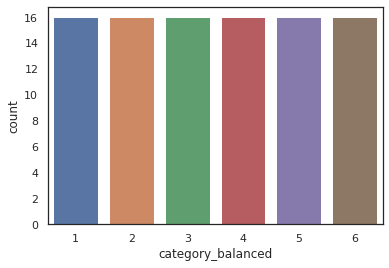

In [147]:
y_equidistant = codiv_country_analyze['category_equidistant']
y_balanced = codiv_country_analyze['category_balanced']
X = codiv_country_analyze.drop(['Deaths Ratio','category_balanced','category_equidistant'], axis=1) 
sns.countplot(y_balanced)

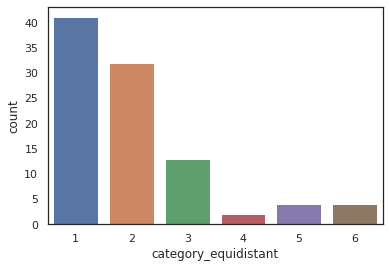

In [148]:
sns.countplot(y_equidistant)

In [149]:
from sklearn.model_selection import train_test_split
X_tr_equid, X_te_equid, y_tr_equid, y_te_equid = train_test_split(X, y_equidistant, test_size=0.15, random_state=1)
print('Train set equidistant:', X_tr_equid.shape, y_tr_equid.shape)
print('Testn set equidistant:', X_te_equid.shape, y_te_equid.shape)
X_tr_balan, X_te_balan, y_tr_balan, y_te_balan = train_test_split(X, y_balanced, test_size=0.15, random_state=1)
print('Train set balanced:', X_tr_balan.shape, y_tr_balan.shape)
print('Testn set balanced:', X_te_balan.shape, y_te_balan.shape)

Train set equidistant: (81, 15) (81,)
Testn set equidistant: (15, 15) (15,)
Train set balanced: (81, 15) (81,)
Testn set balanced: (15, 15) (15,)


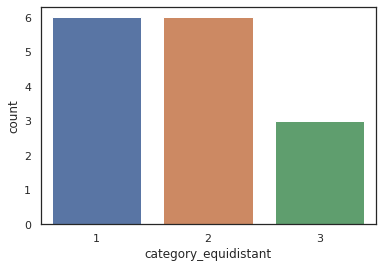

In [150]:
sns.countplot(y_te_equid)

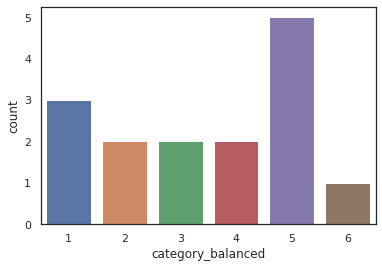

In [151]:
sns.countplot(y_te_balan)

---
Baseline classifier - most frequent - Deaths Ratio feature
---

In [152]:
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X, y_equidistant)
dummy_clf.predict(X)
print("scores baseline mostfrequent classifier equidistant = ", dummy_clf.score(X, y_equidistant))

scores baseline mostfrequent classifier equidistant =  0.4270833333333333


In [153]:
df_resultat.at[df_resultat.index==0,"method"]="baseline_equidistant"
Baseline_training_scores = cross_validate(dummy_clf, X, y_equidistant, cv=cv_strategy)
df_resultat.at[df_resultat.index==0,"Cross-validation"]=np.mean(Baseline_training_scores['test_score'])
print("crossvalidation baseline mostfrequent classifier equidistant = ", np.mean(Baseline_training_scores['test_score']) )

crossvalidation baseline mostfrequent classifier equidistant =  0.4268421052631579


In [154]:
from sklearn.metrics import confusion_matrix
dummy_clf= DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_tr_equid, y_tr_equid)
y_pred_equid=dummy_clf.predict(X_te_equid)
matrix = confusion_matrix(y_true=y_te_equid, y_pred=y_pred_equid)
print(matrix)

[[6 0 0]
 [6 0 0]
 [3 0 0]]


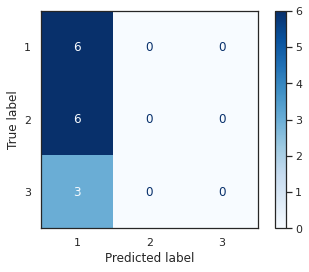

In [155]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dummy_clf, X_te_equid, y_te_equid, cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

Baseline  most frequent - balanced bins  - Deaths Ratio feature
---

In [156]:
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X, y_balanced)
dummy_clf.predict(X)
print("training_scores baseline mostfrequent classifier balanced = ", dummy_clf.score(X, y_balanced))

training_scores baseline mostfrequent classifier balanced =  0.16666666666666666


In [157]:
df_resultat.at[df_resultat.index==1,"method"]="baseline balanced bins"
Baseline_training_scores = cross_validate(dummy_clf, X, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==1,"Cross-validation"]=np.mean(Baseline_training_scores['test_score'])
print("crossvalidation baseline mostfrequent classifier balanced = ", np.mean(Baseline_training_scores['test_score']) )

crossvalidation baseline mostfrequent classifier balanced =  0.042105263157894736


In [158]:
dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_tr_balan, y_tr_balan)
y_pred_balan=dummy_clf.predict(X_te_balan)

In [159]:
matrix = confusion_matrix(y_true=y_te_balan, y_pred=y_pred_balan)
print(matrix)

[[0 0 0 0 0 3]
 [0 0 0 0 0 2]
 [0 0 0 0 0 2]
 [0 0 0 0 0 2]
 [0 0 0 0 0 5]
 [0 0 0 0 0 1]]


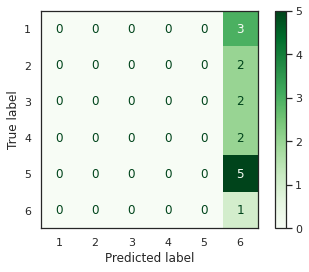

In [160]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dummy_clf, X_te_balan, y_te_balan, cmap=plt.cm.Greens,display_labels=[1,2,3,4,5,6])

---
Decision Tree - equidistant bins  - Deaths Ratio feature
---

In [161]:
depths=range(1,15)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for depth in depths:
    DecisionTree = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=depth)
    DecisionTree.fit(X, y_equidistant)
    cv_val_scores = cross_val_score(DecisionTree, X, y_equidistant, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(DecisionTree.score(X, y_equidistant))
    Text="depth %d, cv_val_scores_mean %f std %f score %f"%(depth,cv_val_scores.mean(),cv_val_scores.std(),DecisionTree.score(X, y_equidistant))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 1, cv_val_scores_mean 0.490000 std 0.045410 score 0.552083
depth 2, cv_val_scores_mean 0.447368 std 0.074432 score 0.625000
depth 3, cv_val_scores_mean 0.383684 std 0.132066 score 0.666667
depth 4, cv_val_scores_mean 0.404737 std 0.098527 score 0.708333
depth 5, cv_val_scores_mean 0.394737 std 0.062275 score 0.802083
depth 6, cv_val_scores_mean 0.342632 std 0.085523 score 0.895833
depth 7, cv_val_scores_mean 0.331579 std 0.109898 score 0.958333
depth 8, cv_val_scores_mean 0.321053 std 0.108375 score 0.968750
depth 9, cv_val_scores_mean 0.321053 std 0.108375 score 0.989583
depth 10, cv_val_scores_mean 0.321053 std 0.108375 score 1.000000
depth 11, cv_val_scores_mean 0.321053 std 0.108375 score 1.000000
depth 12, cv_val_scores_mean 0.321053 std 0.108375 score 1.000000
depth 13, cv_val_scores_mean 0.321053 std 0.108375 score 1.000000
depth 14, cv_val_scores_mean 0.321053 std 0.108375 score 1.000000


In [162]:
print("The maximum is by depth = ",np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)
OptDepth=np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1


The maximum is by depth =  1


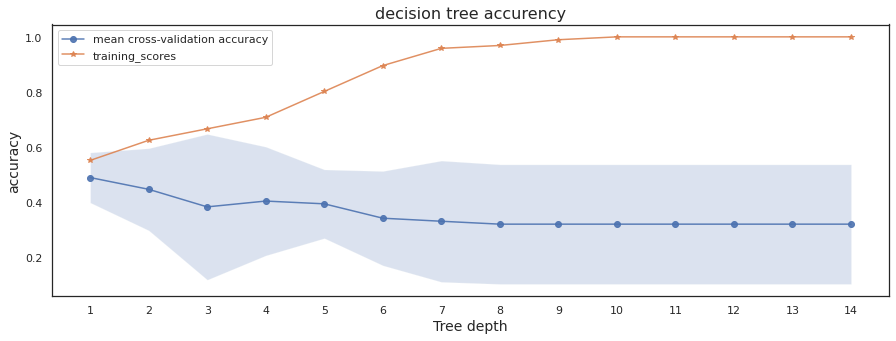

In [163]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(depths, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(depths, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(depths, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="decision tree accurency"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Tree depth', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(depths)
ax.legend()

In [164]:
DecisionTree = DecisionTreeClassifier(
    criterion='gini',  random_state=0, max_depth=OptDepth)
# Fit decision tree
DecisionTree.fit(X, y_equidistant)
Tree_scores = cross_validate(DecisionTree, X, y_equidistant, cv=cv_strategy)
df_resultat.at[df_resultat.index==2,"method"]="decision-tree equidistant"
df_resultat.at[df_resultat.index==2,"Cross-validation"]=np.mean(Tree_scores['test_score'])
                                                              
print("score DecistionTree equidistant =",DecisionTree.score(X, y_equidistant))
print("cross validation DecisionTree equidistant =",np.mean(Tree_scores['test_score']))

score DecistionTree equidistant = 0.5520833333333334
cross validation DecisionTree equidistant = 0.49000000000000005


confusion matrix with the optimal depth

In [165]:
from sklearn.metrics import confusion_matrix
DecisionTree_confusion = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=OptDepth)
DecisionTree_confusion.fit(X_tr_equid, y_tr_equid)
confusion_matrix(y_te_equid, DecisionTree_confusion.predict(X_te_equid))

array([[5, 1, 0],
       [1, 5, 0],
       [1, 2, 0]])

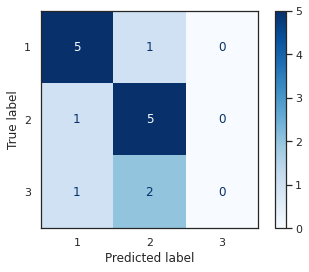

In [166]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(DecisionTree_confusion, X_te_equid, y_te_equid,cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

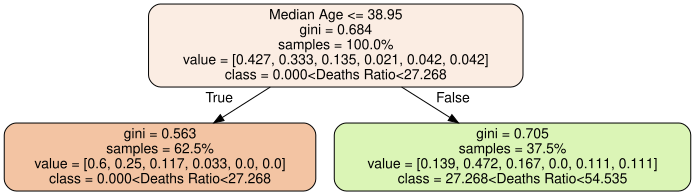

In [167]:
os.environ["PATH"] += os.pathsep + 'D:/Program Files (x86)/Graphviz2.38/bin/'
# Export decision tree
dot_data = export_graphviz(
    DecisionTree, out_file=None,
    feature_names=X.columns, class_names=[Level1_equidistant,Level2_equidistant, Level3_equidistant,Level4_equidistant,Level5_equidistant,Level6_equidistant],
    filled=True, rounded=True, proportion=True   
)
import graphviz

# Display decision tree
graphviz.Source(dot_data)

Decision Tree - balanced bins  - Deaths Ratio feature
---

In [168]:
depths=range(1,15)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for depth in depths:
    DecisionTree = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=depth)
    DecisionTree.fit(X, y_balanced)
    cv_val_scores = cross_val_score(DecisionTree, X, y_balanced, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(DecisionTree.score(X, y_balanced))
    Text="depth %d, cv_val_scores_mean %f  score %f"%(depth,cv_val_scores.mean(),DecisionTree.score(X, y_balanced))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 1, cv_val_scores_mean 0.197895  score 0.281250
depth 2, cv_val_scores_mean 0.177895  score 0.385417
depth 3, cv_val_scores_mean 0.186316  score 0.520833
depth 4, cv_val_scores_mean 0.186842  score 0.656250
depth 5, cv_val_scores_mean 0.217368  score 0.770833
depth 6, cv_val_scores_mean 0.177368  score 0.906250
depth 7, cv_val_scores_mean 0.166316  score 0.958333
depth 8, cv_val_scores_mean 0.124211  score 0.968750
depth 9, cv_val_scores_mean 0.134737  score 0.979167
depth 10, cv_val_scores_mean 0.134737  score 0.989583
depth 11, cv_val_scores_mean 0.145263  score 1.000000
depth 12, cv_val_scores_mean 0.145263  score 1.000000
depth 13, cv_val_scores_mean 0.145263  score 1.000000
depth 14, cv_val_scores_mean 0.145263  score 1.000000


In [169]:
print("The maximum is by depth_balanced = ",np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)
OptDepth=np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1

The maximum is by depth_balanced =  5


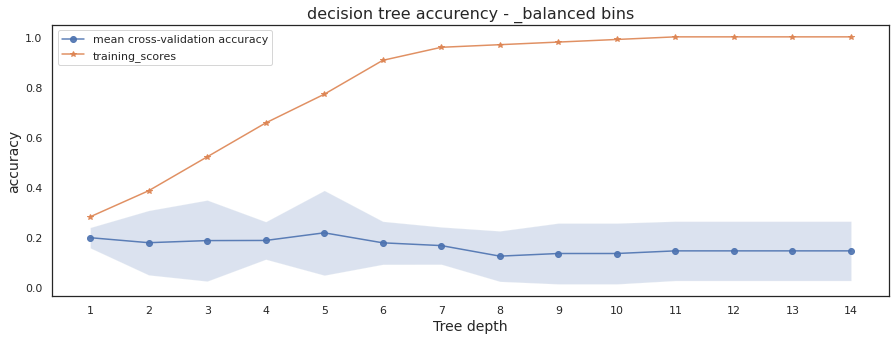

In [170]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(depths, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(depths, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(depths, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="decision tree accurency - _balanced bins"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Tree depth', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(depths)
ax.legend()

In [171]:
DecisionTree = DecisionTreeClassifier(
    criterion='gini',  random_state=0, max_depth=OptDepth)
# Fit decision tree
DecisionTree.fit(X, y_balanced)
# Get score
Tree_scores = cross_validate(DecisionTree, X, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==3,"method"]="decision-tree _balanced bins"
df_resultat.at[df_resultat.index==3,"Cross-validation"]=np.mean(Tree_scores['test_score'])
print("score DecisionTree _balanced bins =",DecisionTree.score(X, y_balanced))
print("cross validation DecisionTree balanced bins=",np.mean(Tree_scores['test_score']))

score DecisionTree _balanced bins = 0.7708333333333334
cross validation DecisionTree balanced bins= 0.21736842105263157


In [172]:
from sklearn.metrics import confusion_matrix
DecisionTree_confusion = DecisionTreeClassifier(criterion='gini',  random_state=0, max_depth=OptDepth)
DecisionTree_confusion.fit(X_tr_balan, y_tr_balan)
confusion_matrix(y_te_balan, DecisionTree_confusion.predict(X_te_balan))

array([[1, 1, 1, 0, 0, 0],
       [0, 1, 0, 1, 0, 0],
       [0, 0, 0, 2, 0, 0],
       [0, 1, 0, 0, 0, 1],
       [1, 1, 0, 2, 0, 1],
       [0, 0, 0, 0, 0, 1]])

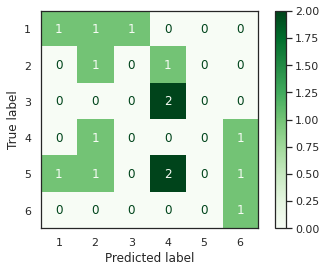

In [173]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(DecisionTree_confusion, X_te_balan, y_te_balan,cmap=plt.cm.Greens,display_labels=[1,2,3,4,5,6])

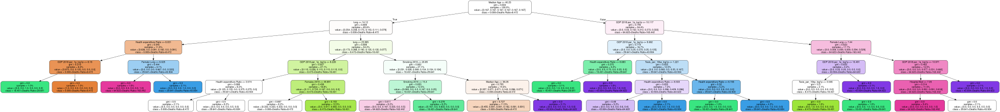

In [174]:
from sklearn.tree import export_graphviz
import os
os.environ["PATH"] += os.pathsep + 'D:/Program Files (x86)/Graphviz2.38/bin/'
# Export decision tree
dot_data = export_graphviz(
    DecisionTree, out_file=None,
    feature_names=X.columns, class_names=[Level1_balanced,Level2_balanced, Level3_balanced,Level4_balanced,Level5_balanced,Level6_balanced],
    filled=True, rounded=True, proportion=True   
)
import graphviz

# Display decision tree
graphviz.Source(dot_data)

---
Random forests - equidistant bins  - Deaths Ratio feature
---

I will use the same methodology as above. I use 250 for the number of `n_estimators` as this seems to be a good default value in practice from my research on online forums.


In [175]:
Estimators=range(100,2000,100)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for Estimator in Estimators:
    forest = RandomForestClassifier(n_estimators=Estimator,random_state=0)
    forest.fit(X, y_equidistant)
    cv_val_scores = cross_val_score(forest, X, y_equidistant, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(forest.fit(X, y_equidistant).score(X, y_equidistant))
    Text="depth %d, cv_val_scores_mean %f  score %f"%(Estimator,cv_val_scores.mean(),forest.score(X, y_equidistant))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 100, cv_val_scores_mean 0.426842  score 1.000000
depth 200, cv_val_scores_mean 0.458421  score 1.000000
depth 300, cv_val_scores_mean 0.468947  score 1.000000
depth 400, cv_val_scores_mean 0.458947  score 1.000000
depth 500, cv_val_scores_mean 0.458947  score 1.000000
depth 600, cv_val_scores_mean 0.490000  score 1.000000
depth 700, cv_val_scores_mean 0.480000  score 1.000000
depth 800, cv_val_scores_mean 0.490000  score 1.000000
depth 900, cv_val_scores_mean 0.500526  score 1.000000
depth 1000, cv_val_scores_mean 0.490526  score 1.000000
depth 1100, cv_val_scores_mean 0.480000  score 1.000000
depth 1200, cv_val_scores_mean 0.469474  score 1.000000
depth 1300, cv_val_scores_mean 0.458947  score 1.000000
depth 1400, cv_val_scores_mean 0.458947  score 1.000000
depth 1500, cv_val_scores_mean 0.458947  score 1.000000
depth 1600, cv_val_scores_mean 0.468947  score 1.000000
depth 1700, cv_val_scores_mean 0.468947  score 1.000000
depth 1800, cv_val_scores_mean 0.468947  score 1.000000
d

In [176]:
print("The maximum is by Estimator_balanced = ",(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100)
OptEstimator=(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100

The maximum is by Estimator_balanced =  900


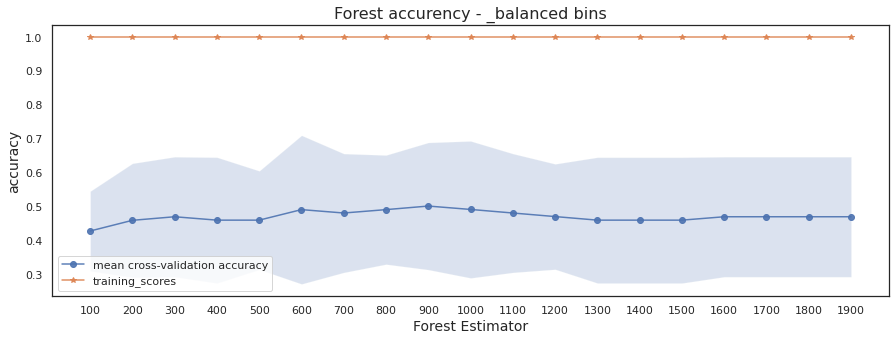

In [177]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(Estimators, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(Estimators, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(Estimators, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="Forest accurency - _balanced bins"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Forest Estimator', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(Estimators)
ax.legend()

Computing it again with optimal estimator

In [178]:
# Build a forest and compute the feature importances
forest = RandomForestClassifier(n_estimators=OptEstimator,random_state=0)
forest.fit(X, y_equidistant)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=900,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [179]:
# Mean test score of a 250x decision tree 
Forest_scores = cross_validate(forest, X, y_equidistant, cv=cv_strategy)
print('Forest by equidistant interval score {:.3f}'.format(forest.score(X, y_equidistant)))
df_resultat.at[df_resultat.index==4,"method"]="Forest equidistant"
df_resultat.at[df_resultat.index==4,"Cross-validation"]=np.mean(Forest_scores['test_score'])
print('Forest by equidistant interval cross validation {:.3f}'.format(np.mean(Forest_scores['test_score'])))

Forest by equidistant interval score 1.000
Forest by equidistant interval cross validation 0.501


confusion matrix  with split data

In [180]:
forest_confusion = RandomForestClassifier(n_estimators=OptEstimator,random_state=0)
forest_confusion.fit(X_tr_equid, y_tr_equid)
confusion_matrix(y_te_equid, forest_confusion.predict(X_te_equid))

array([[4, 2, 0, 0],
       [3, 2, 0, 1],
       [1, 2, 0, 0],
       [0, 0, 0, 0]])

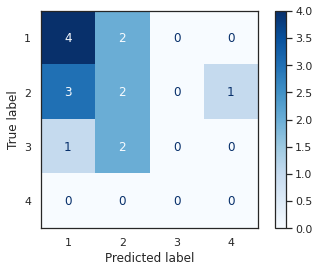

In [181]:
plot_confusion_matrix(forest_confusion, X_te_equid,y_te_equid,cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

In [182]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

Feature ranking by equidistand interval:
1. feature Median Age (0.105570)
2. feature Health expenditure Ratio (0.096914)
3. feature Smoking 2016 (0.093930)
4. feature Temp_mean_jan_apr (0.085704)
5. feature GDP 2018 per_1p_log1p (0.080537)
6. feature Urban Pop (0.078815)
7. feature Female Lung (0.076412)
8. feature Male Lung (0.076382)
9. feature Hospital Bed (0.074704)
10. feature Females 2018 (0.074624)
11. feature lung (0.068502)
12. feature Tests_per_10kp_log1p (0.044970)
13. feature Quarantine_cat (0.020276)
14. feature Schools_cat (0.013345)
15. feature Restrictions_cat (0.009314)


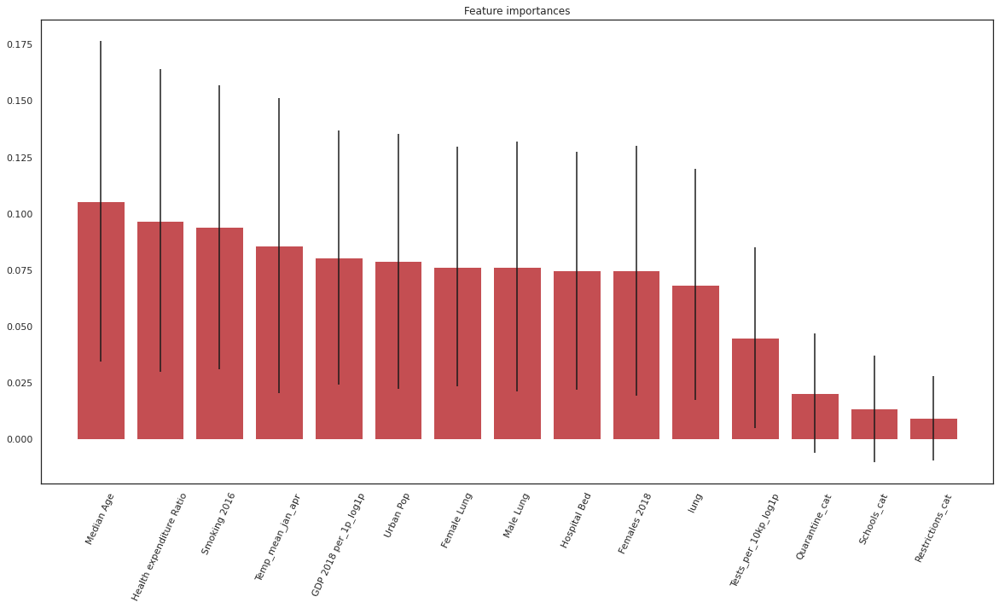

In [183]:
# Print the feature ranking
print("Feature ranking by equidistand interval:")

for f in range(X.shape[1]):
    print("%d. feature %s (%f)" % (f + 1, X.columns[indices[f]], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation = 65)
plt.xlim([-1, X.shape[1]])
plt.show()

---
Random forest - Balanced bins  - Deaths Ratio feature
---

In [184]:
Estimators=range(100,2000,100)
scoring='accuracy'
cv_val_scores_list = []
cv_val_scores_std = []
cv_val_scores_mean = []
accuracy_scores = []
for Estimator in Estimators:
    forest = RandomForestClassifier(n_estimators=Estimator,random_state=0)
    forest.fit(X, y_balanced)
    cv_val_scores = cross_val_score(forest, X, y_balanced, cv=cv_strategy, scoring=scoring)
    cv_val_scores_list.append(cv_val_scores)
    cv_val_scores_mean.append(cv_val_scores.mean())
    cv_val_scores_std.append(cv_val_scores.std())
    accuracy_scores.append(forest.fit(X, y_balanced).score(X, y_balanced))
    Text="depth %d, cv_val_scores_mean %f  score %f"%(Estimator,cv_val_scores.mean(),forest.score(X, y_balanced))
    print(Text)
cv_val_scores_mean = np.array(cv_val_scores_mean)
cv_val_scores_std = np.array(cv_val_scores_std)
accuracy_scores = np.array(accuracy_scores)

depth 100, cv_val_scores_mean 0.207895  score 1.000000
depth 200, cv_val_scores_mean 0.239474  score 1.000000
depth 300, cv_val_scores_mean 0.228947  score 1.000000
depth 400, cv_val_scores_mean 0.228947  score 1.000000
depth 500, cv_val_scores_mean 0.228947  score 1.000000
depth 600, cv_val_scores_mean 0.239474  score 1.000000
depth 700, cv_val_scores_mean 0.218421  score 1.000000
depth 800, cv_val_scores_mean 0.197368  score 1.000000
depth 900, cv_val_scores_mean 0.207895  score 1.000000
depth 1000, cv_val_scores_mean 0.197368  score 1.000000
depth 1100, cv_val_scores_mean 0.197368  score 1.000000
depth 1200, cv_val_scores_mean 0.197368  score 1.000000
depth 1300, cv_val_scores_mean 0.207895  score 1.000000
depth 1400, cv_val_scores_mean 0.207895  score 1.000000
depth 1500, cv_val_scores_mean 0.228421  score 1.000000
depth 1600, cv_val_scores_mean 0.207895  score 1.000000
depth 1700, cv_val_scores_mean 0.207895  score 1.000000
depth 1800, cv_val_scores_mean 0.218421  score 1.000000
d

In [185]:
print("The maximum is by Estimator_balanced = ",(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100)
OptEstimator=(np.where(cv_val_scores_mean==cv_val_scores_mean.max())[0][0]+1)*100

The maximum is by Estimator_balanced =  200


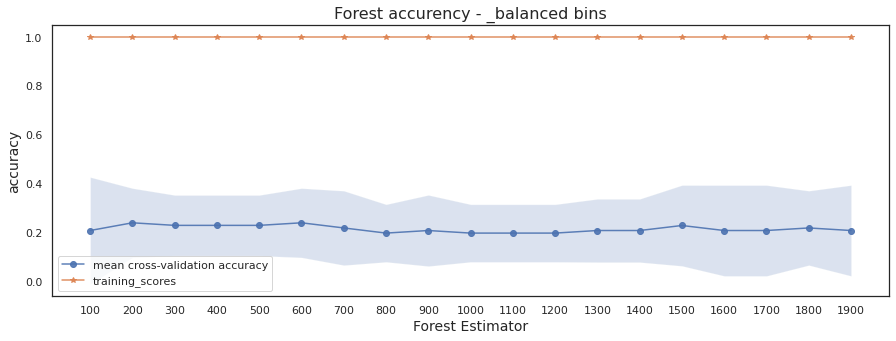

In [186]:
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax.plot(Estimators, cv_val_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
ax.fill_between(Estimators, cv_val_scores_mean-2*cv_val_scores_std, cv_val_scores_mean+2*cv_val_scores_std, alpha=0.2)
ylim = plt.ylim()
ax.plot(Estimators, accuracy_scores, '-*', label='training_scores', alpha=0.9)
title="Forest accurency - _balanced bins"
ax.set_title(title, fontsize=16)
ax.set_xlabel('Forest Estimator', fontsize=14)
ax.set_ylabel('accuracy', fontsize=14)
ax.set_xticks(Estimators)
ax.legend()

In [187]:
from sklearn.model_selection import cross_validate
Forest_scores = cross_validate(forest, X, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==5,"method"]="Forest balanced bins"
df_resultat.at[df_resultat.index==5,"Cross-validation"]=np.mean(Forest_scores['test_score'])
print('Forest by balanced bins of element score {:.3f}'.format(forest.score(X, y_balanced)))
print('Forest by balanced bins of element - mean test {:.3f}'.format(np.mean(Forest_scores['test_score'])))

Forest by balanced bins of element score 1.000
Forest by balanced bins of element - mean test 0.208


In [188]:
forest_confusion = RandomForestClassifier(n_estimators=OptEstimator,random_state=0)
forest_confusion.fit(X_tr_balan, y_tr_balan)
confusion_matrix(y_te_balan, forest_confusion.predict(X_te_balan))

array([[1, 0, 2, 0, 0, 0],
       [0, 1, 0, 0, 0, 1],
       [0, 0, 0, 1, 1, 0],
       [0, 0, 1, 0, 0, 1],
       [0, 1, 1, 0, 0, 3],
       [0, 0, 0, 0, 0, 1]])

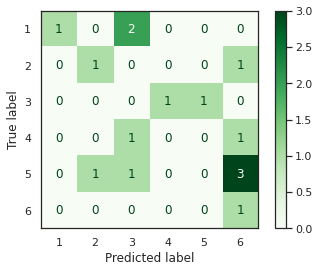

In [189]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(forest_confusion, X_te_balan, y_te_balan,cmap=plt.cm.Greens,display_labels=[1,2,3,4,5,6])

In [190]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

Feature ranking by balanced bins:
1. feature Median Age (0.103667)
2. feature Health expenditure Ratio (0.092087)
3. feature GDP 2018 per_1p_log1p (0.087569)
4. feature lung (0.084274)
5. feature Temp_mean_jan_apr (0.083217)
6. feature Females 2018 (0.081261)
7. feature Male Lung (0.081049)
8. feature Urban Pop (0.078836)
9. feature Female Lung (0.078669)
10. feature Smoking 2016 (0.074375)
11. feature Hospital Bed (0.072051)
12. feature Tests_per_10kp_log1p (0.052174)
13. feature Quarantine_cat (0.013652)
14. feature Schools_cat (0.011435)
15. feature Restrictions_cat (0.005684)


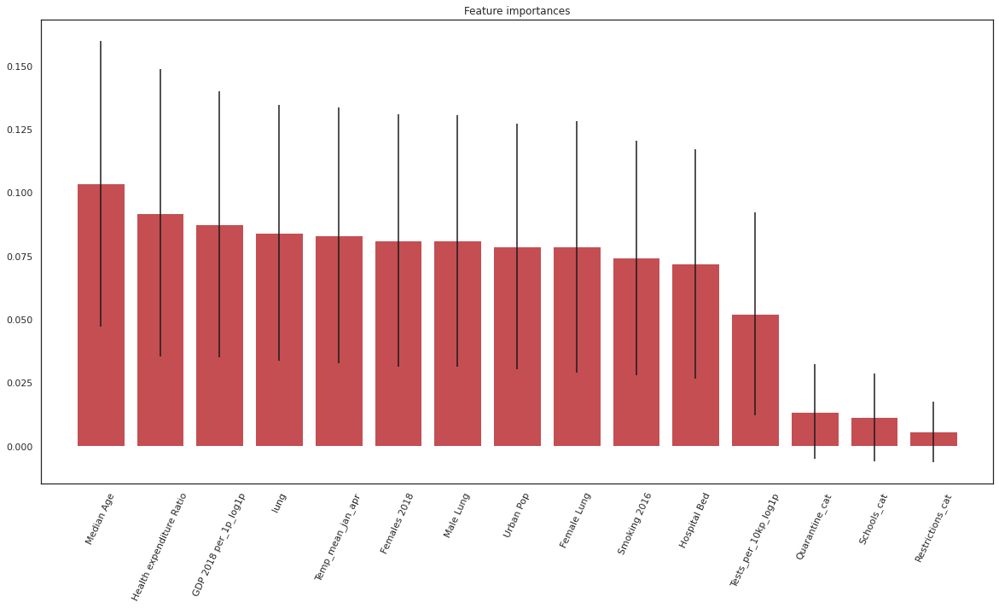

In [191]:
# Print the feature ranking
print("Feature ranking by balanced bins:")

for f in range(X.shape[1]):
    print("%d. feature %s (%f)" % (f + 1, X.columns[indices[f]], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(20,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation = 65)
plt.xlim([-1, X.shape[1]])
plt.show()

---
Feature reduction to 2 and kneighbour classifier -  - Deaths Ratio feature
---
feature reduction

In [192]:
pca = PCA(n_components=2)
# Apply PCA
pca.fit(X, y=None); # Unsupervised learning, no y variable
feature_2= pca.transform(X)
feature_2_df=pd.DataFrame(feature_2)
len_cluster, col=feature_2_df.shape

In [193]:
X_fea_2_tr_equid, X_fea_2_te_equid, y_fea_2_tr_equid, y_fea_2_te_equid = train_test_split(feature_2, y_equidistant, test_size=0.15, random_state=1)
print('Train set equidistant:', X_fea_2_tr_equid.shape, y_fea_2_tr_equid.shape)
print('Testn set equidistant:', X_fea_2_te_equid.shape, y_fea_2_te_equid.shape)
X_fea_2_tr_balan, X_fea_2_te_balan, y_fea_2_tr_balan, y_fea_2_te_balan = train_test_split(feature_2, y_balanced, test_size=0.15, random_state=1)
print('Train set balanced:', X_fea_2_tr_balan.shape, y_fea_2_tr_balan.shape)
print('Testn set balanced:', X_fea_2_te_balan.shape, y_fea_2_te_balan.shape)

Train set equidistant: (81, 2) (81,)
Testn set equidistant: (15, 2) (15,)
Train set balanced: (81, 2) (81,)
Testn set balanced: (15, 2) (15,)


---
K neightbour classifier - equidistant bins  - Deaths Ratio feature
---

the optimal k is  7


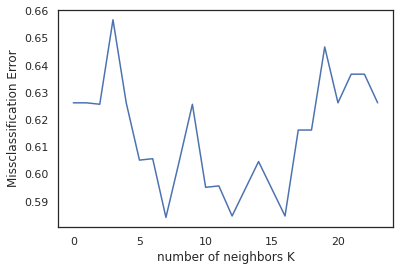

In [194]:
neighbors = list(range(1,25))
CV_scores = []

for n_neighborss in neighbors:
    weights='distance'
    feature1=pd.DataFrame(feature_2).loc[:][0]
    feature2=pd.DataFrame(feature_2).loc[:][1]
    h = .02  # step size in the mesh
    # we create an instance of Neighbours Classifier and fit the data.
    # Create a k-NN pipeline
    knn_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(n_neighbors=n_neighborss, weights=weights))
    ])
    # Fit estimator
    knn_pipe.fit(feature_2, y_equidistant)
    #
    Z = knn_pipe.predict(feature_2)
    scores = cross_val_score(knn_pipe,feature_2,y_equidistant,cv=cv_strategy )
    CV_scores.append(scores.mean())
    
Missclassification_Error = [1-x for x in CV_scores]
print("the optimal k is ",format(Missclassification_Error.index(min(Missclassification_Error))))
k_Optimal=Missclassification_Error.index(min(Missclassification_Error))
    
from matplotlib.legend_handler import HandlerLine2D
plt.plot( Missclassification_Error)
plt.xlabel("number of neighbors K")
plt.ylabel("Missclassification Error")
plt.show()

In [195]:
# Create color maps
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF', '#EFFF00', '#B4FCFF', '#FFB4F5'])
cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF', '#FF00F7', '#00FFE6', '#FFA200'])

feature1=pd.DataFrame(feature_2).loc[:][0]
feature2=pd.DataFrame(feature_2).loc[:][1]

weights='distance'
h = .02  # step size in the mesh
# we create an instance of Neighbours Classifier and fit the data.
# Create a k-NN pipeline
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal, weights=weights))
])
# Fit estimator
knn_pipe.fit(feature_2, y_equidistant)
# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
feature1_min, feature1_max = feature1.min() - 1, feature1.max() + 1
feature2_min, feature2_max = feature2.min() - 1, feature2.max() + 1
xx, yy = np.meshgrid(np.arange(feature1_min, feature1_max, h), np.arange(feature2_min, feature2_max, h))
Z = knn_pipe.predict(np.c_[xx.ravel(), yy.ravel()])
Zo = Z.reshape(xx.shape)

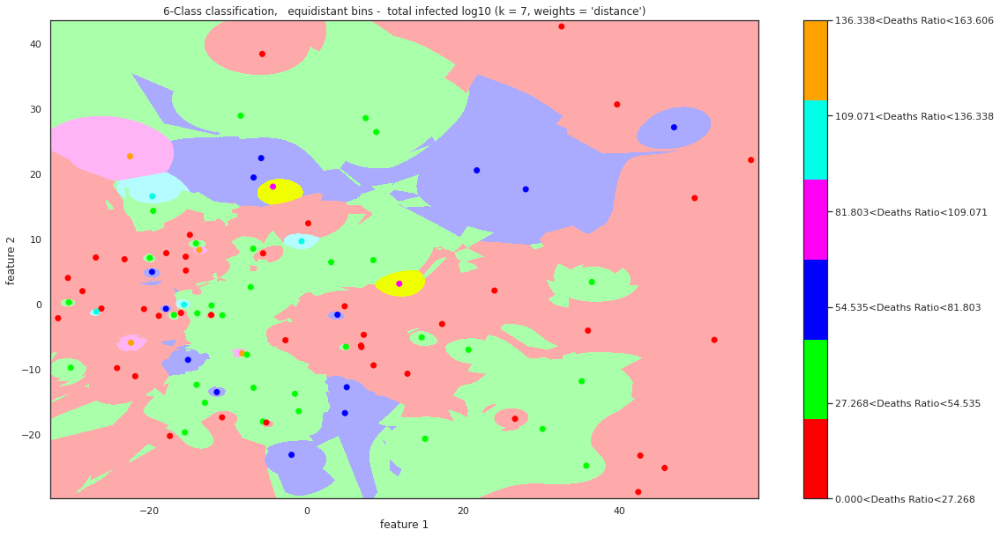

In [196]:
# Put the result into a color plot
plt.figure(figsize=(18, 10))
plt.pcolormesh(xx, yy, Zo, cmap=cmap_light)
#Label1=pd.DataFrame(list(class_index.items()))
Label1=pd.DataFrame([1,2,3,4,5])
# Plot also the training points
plt.scatter(feature1, feature2, c=y_equidistant, cmap=cmap_bold)
cbar = plt.colorbar() 
cbar.ax.set_yticklabels([Level1_equidistant,Level2_equidistant,Level3_equidistant,Level4_equidistant,Level5_equidistant,Level6_equidistant])
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.title("6-Class classification,   equidistant bins -  total infected log10 (k = %i, weights = '%s')" % (k_Optimal, weights))

plt.show()

In [197]:
knn_scores = cross_validate(knn_pipe, feature_2, y_equidistant, cv=cv_strategy)
df_resultat.at[df_resultat.index==6,"method"]="knn equidistant bins"
df_resultat.at[df_resultat.index==6,"Cross-validation"]=np.mean(knn_scores['test_score'])
print('knn by equidistant bins of element score {:.3f}'.format(knn_pipe.score(feature_2, y_equidistant)))
print('knn by equidistant bins of element - mean test {:.3f}'.format(np.mean(knn_scores['test_score'])))


knn by equidistant bins of element score 1.000
knn by equidistant bins of element - mean test 0.394


In [198]:
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal, weights=weights))
])
# Fit estimator
knn_confusion=knn_pipe.fit(X_fea_2_tr_equid, y_fea_2_tr_equid)
knn_predict = knn_pipe.predict(X_fea_2_te_equid)
confusion_matrix(y_fea_2_te_equid, knn_predict)

array([[2, 3, 1],
       [3, 3, 0],
       [1, 2, 0]])

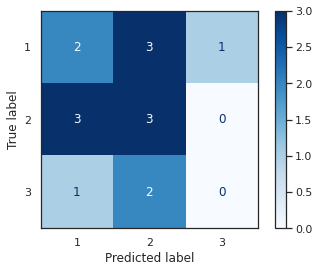

In [199]:
plot_confusion_matrix(knn_confusion, X_fea_2_te_equid, y_fea_2_te_equid,cmap=plt.cm.Blues,display_labels=[1,2,3,4,5,6])

---
K neightbour classifier - balanced bins  - Deaths Ratio feature
---

the optimal k is  15


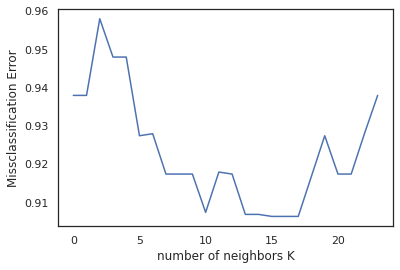

In [200]:
neighbors = list(range(1,25))
CV_scores = []

for n_neighborss in neighbors:
    weights='distance'
    feature1=pd.DataFrame(feature_2).loc[:][0]
    feature2=pd.DataFrame(feature_2).loc[:][1]
    h = .02  # step size in the mesh
    # we create an instance of Neighbours Classifier and fit the data.
    # Create a k-NN pipeline
    knn_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(n_neighbors=n_neighborss, weights=weights))
    ])
    # Fit estimator
    knn_pipe.fit(feature_2, y_balanced)
    #
    Z = knn_pipe.predict(feature_2)
    scores = cross_val_score(knn_pipe,feature_2,y_balanced,cv=cv_strategy )
    CV_scores.append(scores.mean())
    
Missclassification_Error = [1-x for x in CV_scores]
print("the optimal k is ",format(Missclassification_Error.index(min(Missclassification_Error))))
k_Optimal=Missclassification_Error.index(min(Missclassification_Error))
    
from matplotlib.legend_handler import HandlerLine2D
plt.plot( Missclassification_Error)
plt.xlabel("number of neighbors K")
plt.ylabel("Missclassification Error")
plt.show()

In [201]:
# Create color maps
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF', '#EFFF00', '#B4FCFF', '#FFB4F5'])
cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF', '#FF00F7', '#00FFE6', '#FFA200'])

feature1=pd.DataFrame(feature_2).loc[:][0]
feature2=pd.DataFrame(feature_2).loc[:][1]

weights='distance'
h = .02  # step size in the mesh
# we create an instance of Neighbours Classifier and fit the data.
# Create a k-NN pipeline
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal, weights=weights))
])
# Fit estimator
knn_pipe.fit(feature_2, y_balanced)
# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
feature1_min, feature1_max = feature1.min() - 1, feature1.max() + 1
feature2_min, feature2_max = feature2.min() - 1, feature2.max() + 1
xx, yy = np.meshgrid(np.arange(feature1_min, feature1_max, h), np.arange(feature2_min, feature2_max, h))
Z = knn_pipe.predict(np.c_[xx.ravel(), yy.ravel()])
Zo = Z.reshape(xx.shape)

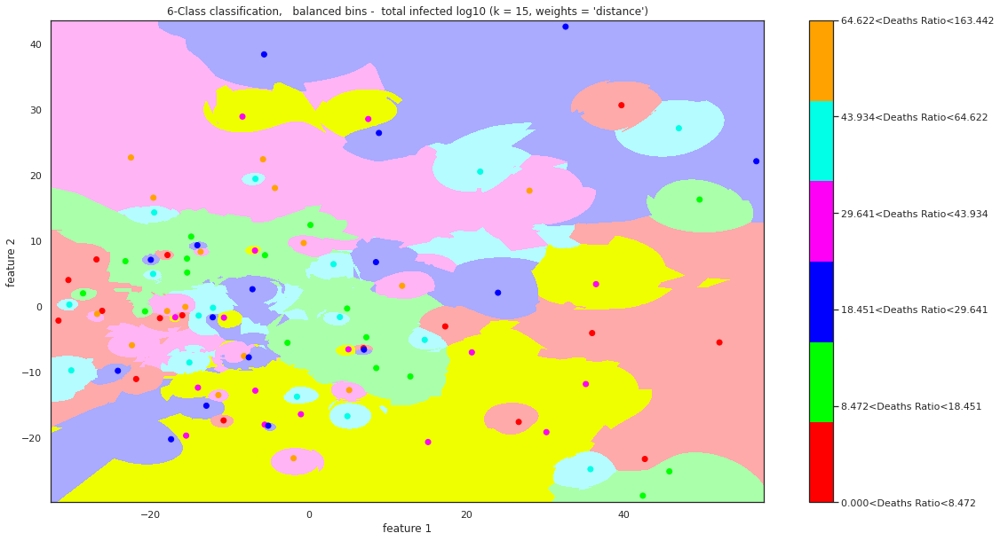

In [202]:
# Put the result into a color plot
plt.figure(figsize=(18, 10))
plt.pcolormesh(xx, yy, Zo, cmap=cmap_light)
#Label1=pd.DataFrame(list(class_index.items()))
Label1=pd.DataFrame([1,2,3,4,5])
# Plot also the training points
plt.scatter(feature1, feature2, c=y_balanced, cmap=cmap_bold)
cbar = plt.colorbar() 
cbar.ax.set_yticklabels([Level1_balanced,Level2_balanced,Level3_balanced,Level4_balanced,Level5_balanced,Level6_balanced])
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.title("6-Class classification,   balanced bins -  total infected log10 (k = %i, weights = '%s')" % (k_Optimal, weights))

plt.show()

In [203]:

knn_scores = cross_validate(knn_pipe, feature_2, y_balanced, cv=cv_strategy)
df_resultat.at[df_resultat.index==7,"method"]="knn balanced bins"
df_resultat.at[df_resultat.index==7,"Cross-validation"]=np.mean(knn_scores['test_score'])
print('knn by equidistant bins of element score {:.3f}'.format(knn_pipe.score(feature_2, y_balanced)))
print('knn by equidistant bins of element - mean test {:.3f}'.format(np.mean(knn_scores['test_score'])))


knn by equidistant bins of element score 1.000
knn by equidistant bins of element - mean test 0.093


In [204]:
knn_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=k_Optimal, weights=weights))
])
# Fit estimator
knn_confusion=knn_pipe.fit(X_fea_2_tr_balan, y_fea_2_tr_balan)
knn_predict = knn_pipe.predict(X_fea_2_te_balan)

In [205]:
confusion_matrix(y_fea_2_te_balan, knn_predict)

array([[0, 0, 2, 0, 0, 1],
       [1, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 1],
       [0, 0, 1, 1, 0, 0],
       [1, 2, 0, 0, 0, 2],
       [0, 0, 0, 1, 0, 0]])

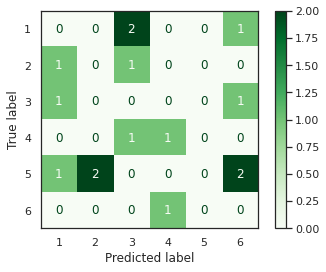

In [206]:
plot_confusion_matrix(knn_confusion, X_fea_2_te_balan, y_fea_2_te_balan,cmap=plt.cm.Greens,display_labels=[1,2,3,4,5,6])

Summary  - Deaths Ratio feature
---

In [207]:
df_resultat

,method,Cross-validation
0,baseline_equidistant,0.426842
1,baseline balanced bins,0.0421053
2,decision-tree equidistant,0.49
3,decision-tree _balanced bins,0.217368
4,Forest equidistant,0.500526
5,Forest balanced bins,0.207895
6,knn equidistant bins,0.394211
7,knn balanced bins,0.0931579


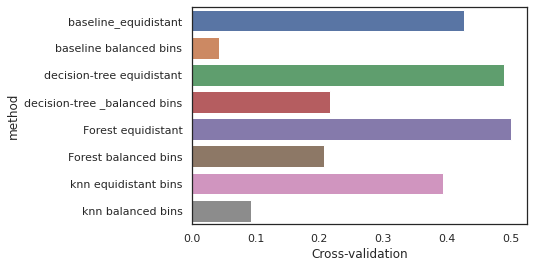

In [208]:
sns.barplot(x=df_resultat["Cross-validation"],y=df_resultat['method'])
plt.show()

a few surprized that the tree is high by deapth 1, the forest deliver the awaiting factor importance

---
---
PART 3 : daily value trend and prediction
---

we have these tabel
codiv_country_qurantine
codiv_country_Restrictions
codiv_country_without_Restrictions_qurantine
codiv_time_recovered
codiv_time_deaths
codiv_time_confirmed

need to consolidate the country name
group row having same country name

In [209]:
codiv_time_confirmed

,Province/State,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20
0,NaN,Afghanistan,0,0,0,0,0,0,0,0,...,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145
1,NaN,Albania,0,0,0,0,0,0,0,0,...,872,876,880,898,916,933,946,948,949,964
2,NaN,Algeria,0,0,0,0,0,0,0,0,...,5891,6067,6253,6442,6629,6821,7019,7201,7377,7542
3,NaN,Andorra,0,0,0,0,0,0,0,0,...,755,758,760,761,761,761,761,761,761,762
4,NaN,Angola,0,0,0,0,0,0,0,0,...,45,45,45,48,48,48,48,50,52,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,Sao Tome and Principe,0,0,0,0,0,0,0,0,...,208,208,220,235,235,235,235,246,251,251
262,NaN,Yemen,0,0,0,0,0,0,0,0,...,56,65,70,85,106,122,128,130,167,184
263,NaN,Comoros,0,0,0,0,0,0,0,0,...,11,11,11,11,11,11,11,11,11,34
264,NaN,Tajikistan,0,0,0,0,0,0,0,0,...,661,729,801,907,1118,1322,1524,1729,1936,2140


In [210]:
codiv_time_confirmed_grouped=codiv_time_confirmed.groupby('Country/Region').sum().reset_index()
dfsum=codiv_time_confirmed_grouped.agg(['sum'])
dfsum['Country/Region']="total_confirmed"
codiv_time_confirmed_grouped_sum=codiv_time_confirmed_grouped.append(dfsum)
#
codiv_time_recovered_grouped=codiv_time_recovered.groupby('Country/Region').sum().reset_index()
dfsum=codiv_time_recovered_grouped.agg(['sum'])
dfsum['Country/Region']="total_recovered"
codiv_time_recovered_grouped_sum=codiv_time_recovered_grouped.append(dfsum)
#
codiv_time_deaths_grouped=codiv_time_deaths.groupby('Country/Region').sum().reset_index()
dfsum=codiv_time_deaths_grouped.agg(['sum'])
dfsum['Country/Region']="total_deaths"
codiv_time_deaths_grouped_sum=codiv_time_deaths_grouped.append(dfsum)
codiv_time_deaths_grouped_sum

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20
0,Afghanistan,0,0,0,0,0,0,0,0,0,...,122,127,132,136,153,168,169,173,178,187
1,Albania,0,0,0,0,0,0,0,0,0,...,31,31,31,31,31,31,31,31,31,31
2,Algeria,0,0,0,0,0,0,0,0,0,...,507,515,522,529,536,542,548,555,561,568
3,Andorra,0,0,0,0,0,0,0,0,0,...,48,48,49,49,49,51,51,51,51,51
4,Angola,0,0,0,0,0,0,0,0,0,...,2,2,2,2,2,2,2,3,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184,Western Sahara,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
185,Yemen,0,0,0,0,0,0,0,0,0,...,9,10,12,12,15,18,20,20,28,30
186,Zambia,0,0,0,0,0,0,0,0,0,...,7,7,7,7,7,7,7,7,7,7
187,Zimbabwe,0,0,0,0,0,0,0,0,0,...,4,4,4,4,4,4,4,4,4,4


buiding new table for the 3 cathegory
codiv_country_qurantine
codiv_country_Restrictions
codiv_country_without_Restrictions_qurantine

In [211]:
#Recovered
Start=1
for countryInd in codiv_country_qurantine['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_qurantine_recovered=codiv_time_recovered_grouped_sum[codiv_time_recovered_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_qurantine_recovered=codiv_country_qurantine_recovered.append(codiv_time_recovered_grouped_sum[codiv_time_recovered_grouped_sum['Country/Region']==countryInd])
#
Start=1
for countryInd in codiv_country_Restrictions['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_Restrictions_recovered=codiv_time_recovered_grouped_sum[codiv_time_recovered_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_Restrictions_recovered=codiv_country_Restrictions_recovered.append(codiv_time_recovered_grouped_sum[codiv_time_recovered_grouped_sum['Country/Region']==countryInd])
#
Start=1
for countryInd in codiv_country_without_Restrictions_qurantine['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_without_Restrictions_qurantine_recovered=codiv_time_recovered_grouped_sum[codiv_time_recovered_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_without_Restrictions_qurantine_recovered=codiv_country_without_Restrictions_qurantine_recovered.append(codiv_time_recovered_grouped_sum[codiv_time_recovered_grouped_sum['Country/Region']==countryInd]) 
#deaths   
Start=1
for countryInd in codiv_country_qurantine['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_qurantine_deaths=codiv_time_deaths_grouped_sum[codiv_time_deaths_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_qurantine_deaths=codiv_country_qurantine_deaths.append(codiv_time_deaths_grouped_sum[codiv_time_deaths_grouped_sum['Country/Region']==countryInd])
#
Start=1
for countryInd in codiv_country_Restrictions['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_Restrictions_deaths=codiv_time_deaths_grouped_sum[codiv_time_deaths_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_Restrictions_deaths=codiv_country_Restrictions_deaths.append(codiv_time_deaths_grouped_sum[codiv_time_deaths_grouped_sum['Country/Region']==countryInd])
#
Start=1
for countryInd in codiv_country_without_Restrictions_qurantine['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_without_Restrictions_qurantine_deaths=codiv_time_deaths_grouped_sum[codiv_time_deaths_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_without_Restrictions_qurantine_deaths=codiv_country_without_Restrictions_qurantine_deaths.append(codiv_time_deaths_grouped_sum[codiv_time_deaths_grouped_sum['Country/Region']==countryInd]) 
#confirmed

Start=1
for countryInd in codiv_country_qurantine['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_qurantine_confirmed=codiv_time_confirmed_grouped_sum[codiv_time_confirmed_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_qurantine_confirmed=codiv_country_qurantine_confirmed.append(codiv_time_confirmed_grouped_sum[codiv_time_confirmed_grouped_sum['Country/Region']==countryInd])

Start=1
for countryInd in codiv_country_Restrictions['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_Restrictions_confirmed=codiv_time_confirmed_grouped_sum[codiv_time_confirmed_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_Restrictions_confirmed=codiv_country_Restrictions_confirmed.append(codiv_time_confirmed_grouped_sum[codiv_time_confirmed_grouped_sum['Country/Region']==countryInd])

#codiv_country_Restrictions_confirmed=codiv_country_Restrictions_confirmed.set_index('Country/Region')
#
Start=1
for countryInd in codiv_country_without_Restrictions_qurantine['Country']:
    if not codiv_country_short[codiv_country_short['Country']==countryInd].empty:
        if Start==1:
            codiv_country_without_Restrictions_qurantine_confirmed=codiv_time_confirmed_grouped_sum[codiv_time_confirmed_grouped_sum['Country/Region']==countryInd]
            Start=0
        else:
            codiv_country_without_Restrictions_qurantine_confirmed=codiv_country_without_Restrictions_qurantine_confirmed.append(codiv_time_confirmed_grouped_sum[codiv_time_confirmed_grouped_sum['Country/Region']==countryInd]) 



tabelle available: stats
    codiv_country_without_Restrictions_qurantine_confirmed
    codiv_country_without_Restrictions_qurantine_deaths
    codiv_country_without_Restrictions_qurantine_recovered
    
    codiv_country_qurantine_confirmed
    codiv_country_qurantine_deaths
    codiv_country_qurantine_recovered
    
    codiv_country_Restrictions_confirmed
    codiv_country_Restrictions_deaths
    codiv_country_Restrictions_recovered
    
    
    Build active-infected table

In [212]:
codiv_country_without_Restrictions_qurantine_active= codiv_country_without_Restrictions_qurantine_confirmed.set_index('Country/Region')-codiv_country_without_Restrictions_qurantine_deaths.set_index('Country/Region')-codiv_country_without_Restrictions_qurantine_recovered.set_index('Country/Region')
codiv_country_qurantine_active= codiv_country_qurantine_confirmed.set_index('Country/Region')-codiv_country_qurantine_deaths.set_index('Country/Region')-codiv_country_qurantine_recovered.set_index('Country/Region')
codiv_country_Restrictions_active= codiv_country_Restrictions_confirmed.set_index('Country/Region')- codiv_country_Restrictions_deaths.set_index('Country/Region')-codiv_country_Restrictions_recovered.set_index('Country/Region')

confirmed Log10
---

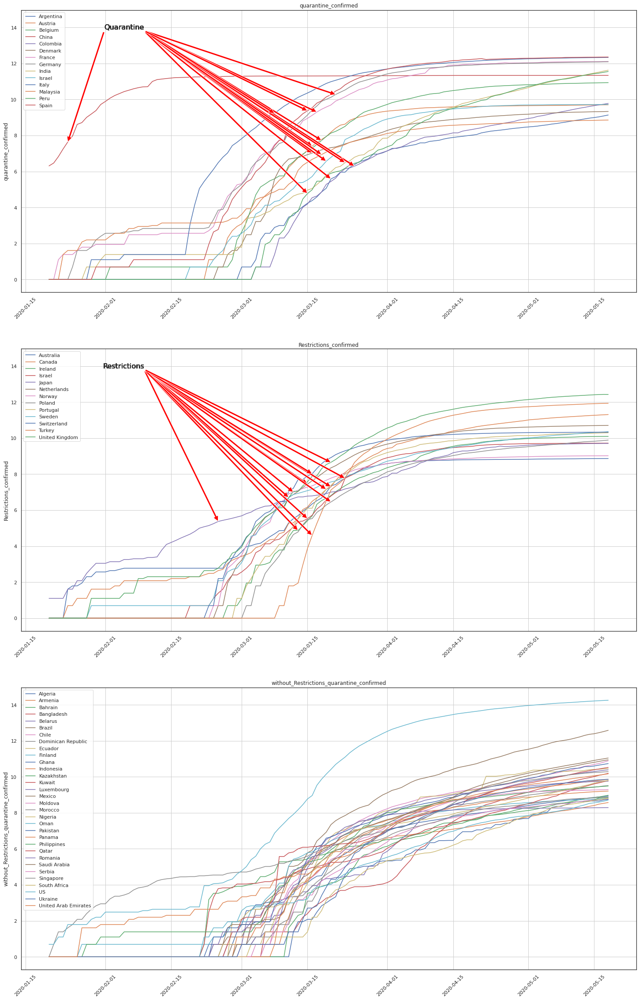

In [213]:
import datetime
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
row, col= codiv_country_qurantine_confirmed.shape
fig, (ax0,ax1,ax2) = plt.subplots(3, sharey=True,figsize=(25,40))
ts = pd.Series(
    np.random.randn(col-1),
    index=pd.date_range('20/1/2020', periods=col-1))
df_qua_conf = pd.DataFrame((np.log1p(codiv_country_qurantine_confirmed.set_index('Country/Region').T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_qurantine_confirmed.set_index('Country/Region').index))
df_res_conf = pd.DataFrame((np.log1p(codiv_country_Restrictions_confirmed.set_index('Country/Region').T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_Restrictions_confirmed.set_index('Country/Region').index))
df_whi_conf = pd.DataFrame((np.log1p(codiv_country_without_Restrictions_qurantine_confirmed.set_index('Country/Region').T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_without_Restrictions_qurantine_confirmed.set_index('Country/Region').index))

ax0.plot(df_qua_conf.index,df_qua_conf)
ax1.plot(df_res_conf.index, df_res_conf)
ax2.plot(df_whi_conf.index, df_whi_conf)
ax0.set_title("quarantine_confirmed")
ax1.set_title("Restrictions_confirmed")
ax2.set_title("without_Restrictions_quarantine_confirmed")
ax0.legend(codiv_country_qurantine_confirmed['Country/Region'].tolist(),loc='upper left')
ax1.legend(codiv_country_Restrictions_confirmed['Country/Region'].tolist(),loc='upper left')
ax2.legend(codiv_country_without_Restrictions_qurantine_confirmed['Country/Region'].tolist(),loc='upper left')
ax0.set_ylabel("quarantine_confirmed")
ax1.set_ylabel("Restrictions_confirmed")
ax2.set_ylabel("without_Restrictions_quarantine_confirmed")

ax0.grid(True)
ax0.xaxis.set_minor_locator(AutoMinorLocator())
ax1.grid(True)
ax1.xaxis.set_minor_locator(AutoMinorLocator())
ax2.grid(True)
ax2.xaxis.set_minor_locator(AutoMinorLocator())
ax0.tick_params(axis="x", rotation=45)
ax1.tick_params(axis="x", rotation=45)
ax2.tick_params(axis="x", rotation=45)
####
for countryindex in codiv_country_qurantine_confirmed['Country/Region']:
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        if codiv_country[codiv_country['Country']==countryindex]['Quarantine'].values[0]!="2000-01-01" and countryindex!="New Zealand":
            QuarantineTime=codiv_country[codiv_country['Country']==countryindex]['Quarantine'].values[0]
            QuarantineTimeD = datetime.datetime.strptime(str(QuarantineTime), "%m/%d/%Y")
            Centervalue=df_qua_conf[df_qua_conf.index==QuarantineTimeD][countryindex].values[0]
            ax0.annotate('Quarantine', (QuarantineTimeD, Centervalue),
                xytext=(0.2, 0.95), textcoords='axes fraction',
                arrowprops=dict(facecolor='red', shrink=0.001),
                fontsize=16,
                horizontalalignment='right', verticalalignment='top')
####
for countryindex in codiv_country_Restrictions_confirmed['Country/Region']:
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        if codiv_country[codiv_country['Country']==countryindex]['Restrictions'].values[0]!="2000-01-01":
            RestrictionsTime=codiv_country[codiv_country['Country']==countryindex]['Restrictions'].values[0]
            RestrictionsTimeD = datetime.datetime.strptime(str(RestrictionsTime), "%m/%d/%Y")
            Centervalue=df_res_conf[df_res_conf.index==RestrictionsTimeD][countryindex].values[0]
            ax1.annotate('Restrictions', (RestrictionsTimeD, Centervalue),
                xytext=(0.2, 0.95), textcoords='axes fraction',
                arrowprops=dict(facecolor='red', shrink=0.001),
                fontsize=16,
                horizontalalignment='right', verticalalignment='top')

The countries without restrictions and quarantine definitely have an increasing epidemic.

The countries with restrictions show a slowdown in development.

The countries with the quarantine have been successful in achieving a better result.

Quarantine and restrictions are political decisions. How they are used differs from country to country, also how violations of the law are punished or monitor is dependent on country

deaths Log10
---

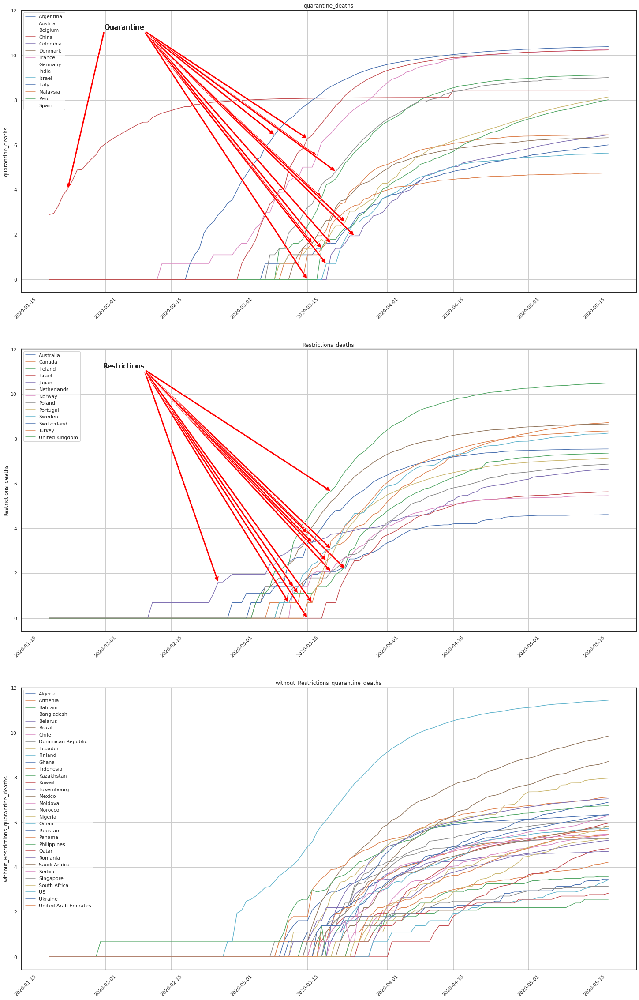

In [214]:
import datetime
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
row, col= codiv_country_qurantine_deaths.shape
fig, (ax0,ax1,ax2) = plt.subplots(3, sharey=True,figsize=(25,40))
ts = pd.Series(
    np.random.randn(col-1),
    index=pd.date_range('20/1/2020', periods=col-1))
df_qua_conf = pd.DataFrame((np.log1p(codiv_country_qurantine_deaths.set_index('Country/Region').T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_qurantine_deaths.set_index('Country/Region').index))
df_res_conf = pd.DataFrame((np.log1p(codiv_country_Restrictions_deaths.set_index('Country/Region').T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_Restrictions_deaths.set_index('Country/Region').index))
df_whi_conf = pd.DataFrame((np.log1p(codiv_country_without_Restrictions_qurantine_deaths.set_index('Country/Region').T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_without_Restrictions_qurantine_deaths.set_index('Country/Region').index))

ax0.plot(df_qua_conf.index,df_qua_conf)
ax1.plot(df_res_conf.index, df_res_conf)
ax2.plot(df_whi_conf.index, df_whi_conf)
ax0.set_title("quarantine_deaths")
ax1.set_title("Restrictions_deaths")
ax2.set_title("without_Restrictions_quarantine_deaths")
ax0.legend(codiv_country_qurantine_deaths['Country/Region'].tolist(),loc='upper left')
ax1.legend(codiv_country_Restrictions_deaths['Country/Region'].tolist(),loc='upper left')
ax2.legend(codiv_country_without_Restrictions_qurantine_deaths['Country/Region'].tolist(),loc='upper left')
ax0.set_ylabel("quarantine_deaths")
ax1.set_ylabel("Restrictions_deaths")
ax2.set_ylabel("without_Restrictions_quarantine_deaths")

ax0.grid(True)
ax0.xaxis.set_minor_locator(AutoMinorLocator())
ax1.grid(True)
ax1.xaxis.set_minor_locator(AutoMinorLocator())
ax2.grid(True)
ax2.xaxis.set_minor_locator(AutoMinorLocator())
ax0.tick_params(axis="x", rotation=45)
ax1.tick_params(axis="x", rotation=45)
ax2.tick_params(axis="x", rotation=45)
####
for countryindex in codiv_country_qurantine_deaths['Country/Region']:
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        if codiv_country[codiv_country['Country']==countryindex]['Quarantine'].values[0]!="2000-01-01" and countryindex!="New Zealand":
            QuarantineTime=codiv_country[codiv_country['Country']==countryindex]['Quarantine'].values[0]
            QuarantineTimeD = datetime.datetime.strptime(str(QuarantineTime), "%m/%d/%Y")
            Centervalue=df_qua_conf[df_qua_conf.index==QuarantineTimeD][countryindex].values[0]
            ax0.annotate('Quarantine', (QuarantineTimeD, Centervalue),
                xytext=(0.2, 0.95), textcoords='axes fraction',
                arrowprops=dict(facecolor='red', shrink=0.001),
                fontsize=16,
                horizontalalignment='right', verticalalignment='top')
####
for countryindex in codiv_country_Restrictions_deaths['Country/Region']:
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        if codiv_country[codiv_country['Country']==countryindex]['Restrictions'].values[0]!="2000-01-01":
            RestrictionsTime=codiv_country[codiv_country['Country']==countryindex]['Restrictions'].values[0]
            RestrictionsTimeD = datetime.datetime.strptime(str(RestrictionsTime), "%m/%d/%Y")
            Centervalue=df_res_conf[df_res_conf.index==RestrictionsTimeD][countryindex].values[0]
            ax1.annotate('Restrictions', (RestrictionsTimeD, Centervalue),
                xytext=(0.2, 0.95), textcoords='axes fraction',
                arrowprops=dict(facecolor='red', shrink=0.001),
                fontsize=16,
                horizontalalignment='right', verticalalignment='top')

Till now are 4-5 main virus variant

in china was 2 version (A) , one agressiv in wuhan, an other one less in the rest of the country (B).

In rest of asia was also an other mutation

in france, spain, italy is also an different the number of deaths is different then in germany/and other eastern countries.
In france was discovered the first virus  in december

that all means it is not possible on the graphic to learn something due of these mutations.

active Log10
---

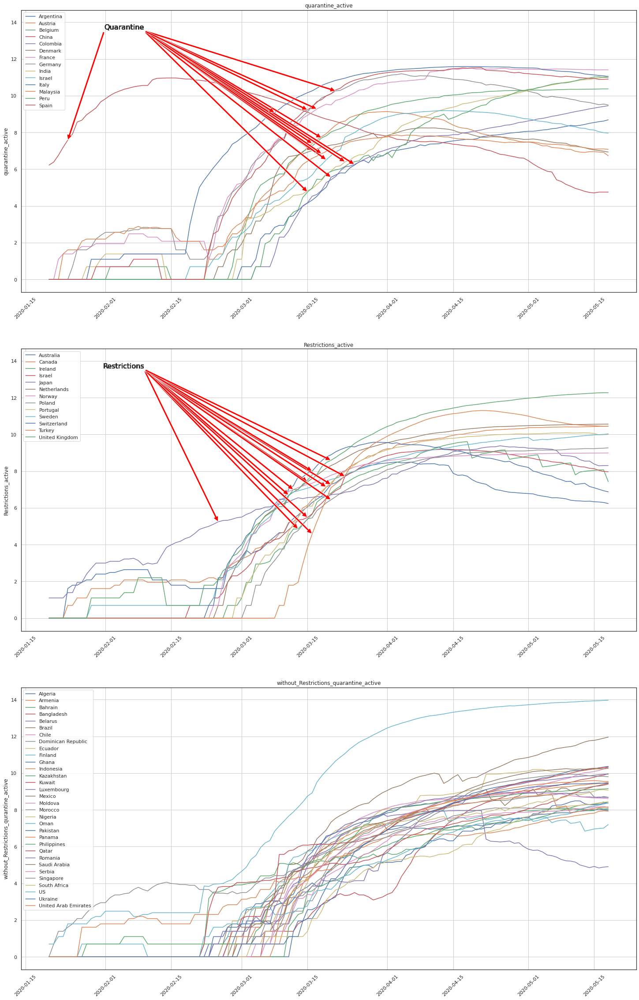

In [215]:
import datetime
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
row, col= codiv_country_qurantine_active.shape
fig, (ax0,ax1,ax2) = plt.subplots(3, sharey=True,figsize=(25,40))
ts = pd.Series(
    np.random.randn(col),
    index=pd.date_range('20/1/2020', periods=col))
df_qua_conf = pd.DataFrame((np.log1p(codiv_country_qurantine_active.T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_qurantine_active.index))
df_res_conf = pd.DataFrame((np.log1p(codiv_country_Restrictions_active.T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_Restrictions_active.index))
df_whi_conf = pd.DataFrame((np.log1p(codiv_country_without_Restrictions_qurantine_active.T).to_numpy()),
    index=ts.index,
    columns=list(codiv_country_without_Restrictions_qurantine_active.index))

ax0.plot(df_qua_conf.index,df_qua_conf)
ax1.plot(df_res_conf.index, df_res_conf)
ax2.plot(df_whi_conf.index, df_whi_conf)
ax0.set_title("quarantine_active")
ax1.set_title("Restrictions_active")
ax2.set_title("without_Restrictions_quarantine_active")
ax0.legend(codiv_country_qurantine_deaths['Country/Region'].tolist(),loc='upper left')
ax1.legend(codiv_country_Restrictions_deaths['Country/Region'].tolist(),loc='upper left')
ax2.legend(codiv_country_without_Restrictions_qurantine_deaths['Country/Region'].tolist(),loc='upper left')
ax0.set_ylabel("quarantine_active")
ax1.set_ylabel("Restrictions_active")
ax2.set_ylabel("without_Restrictions_qurantine_active")

ax0.grid(True)
ax0.xaxis.set_minor_locator(AutoMinorLocator())
ax1.grid(True)
ax1.xaxis.set_minor_locator(AutoMinorLocator())
ax2.grid(True)
ax2.xaxis.set_minor_locator(AutoMinorLocator())
ax0.tick_params(axis="x", rotation=45)
ax1.tick_params(axis="x", rotation=45)
ax2.tick_params(axis="x", rotation=45)
####
for countryindex in codiv_country_qurantine_deaths['Country/Region']:
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        if codiv_country[codiv_country['Country']==countryindex]['Quarantine'].values[0]!="2000-01-01" and countryindex!="New Zealand":
            QuarantineTime=codiv_country[codiv_country['Country']==countryindex]['Quarantine'].values[0]
            QuarantineTimeD = datetime.datetime.strptime(str(QuarantineTime), "%m/%d/%Y")
            Centervalue=df_qua_conf[df_qua_conf.index==QuarantineTimeD][countryindex].values[0]
            ax0.annotate('Quarantine', (QuarantineTimeD, Centervalue),
                xytext=(0.2, 0.95), textcoords='axes fraction',
                arrowprops=dict(facecolor='red', shrink=0.001),
                fontsize=16,
                horizontalalignment='right', verticalalignment='top')
####
for countryindex in codiv_country_Restrictions_deaths['Country/Region']:
    if not codiv_country[codiv_country['Country']==countryindex].empty :
        if codiv_country[codiv_country['Country']==countryindex]['Restrictions'].values[0]!="2000-01-01":
            RestrictionsTime=codiv_country[codiv_country['Country']==countryindex]['Restrictions'].values[0]
            RestrictionsTimeD = datetime.datetime.strptime(str(RestrictionsTime), "%m/%d/%Y")
            Centervalue=df_res_conf[df_res_conf.index==RestrictionsTimeD][countryindex].values[0]
            ax1.annotate('Restrictions', (RestrictionsTimeD, Centervalue),
                xytext=(0.2, 0.95), textcoords='axes fraction',
                arrowprops=dict(facecolor='red', shrink=0.001),
                fontsize=16,
                horizontalalignment='right', verticalalignment='top')

---
Part 4 : Fitting the data to a model and predictions
---

explanations:
---
I dont target the total number of infected, but only the active number of infected. 
The goal is to predict when we will arrive under a low level of infected.
Only active infected represent a danger, not the recovered persone.
```
```
first i will fit the China active  courve to a model
The epidemic curve is a standard epidemical curve.
After i will transpose theis epidemic model to the other countries.
For the transposition it will be 3 fitting parameter : 1. start point 2. The high point 3. The large 
The Model can not absorbe the suddently adjustment of measuring method of a country, but global it fitt very well

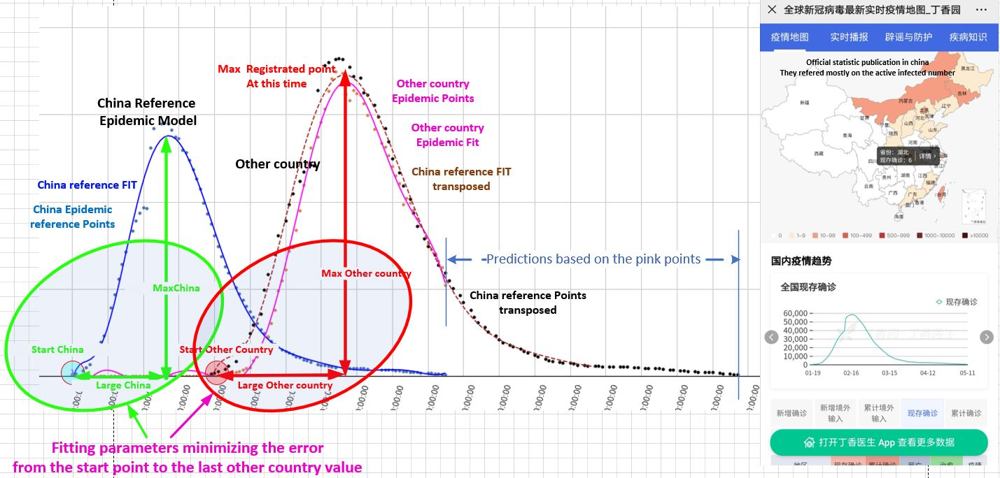

In [216]:
from IPython.display import Image
Image(filename=os.path.join('.//', 'shift.JPG'))

The issue highlighted in this article [Forecasting s-curves is hard](https://constancecrozier.com/2020/04/16/forecasting-s-curves-is-hard/) is that forecasting the numbers isn't really accurate at the beginning of the cruve until it starts to decrease. For this reason, the models below only provide good insights from China as a model after the epidemic "peak".

Also, the "S curve" model (or Normal curve) only works to model for a single epidemic event which might not be the case due to change in policy ex. end of quarantine or for some countries where the data was changed. The data is not clean in the sense that some countries such as Germany stopped recording during weekends. As another example, the policy can suddenly change as in Wuhan where it was decided to systematically test the population (15th May).

I decided to use a polymial curve to highlight those sudden changes even if the model will only work within the range of data and shouldn't be use to forecast future due to boundary effects as explained here: https://twitter.com/laurabronner/status/1257743918919151616 - the curves in the plots below are limited to the start/end of data points I have.

In [217]:
# evalue the stadt date of the stats
StartDate=codiv_country_Restrictions_active.T.index[0]
print(" Epidemy StartDate = ",StartDate)
column_names = ["date"]
dfdate = pd.DataFrame(columns = column_names)
for Dateindex in range(20):
    df_date1 = pd.DataFrame ([[str(pd.Timestamp(StartDate,unit="D")+ pd.Timedelta(days=Dateindex))]], columns = ["date"])
    dfdate=dfdate.append(df_date1, ignore_index = True)


 Epidemy StartDate =  1/22/20


In [218]:
# Root mean squared error (RMSE)
def rmse(y, y_pred):
    return np.sqrt(np.mean(np.square(y - y_pred)))

In [219]:
import scipy.stats as stats
import datetime
def Polifq(Country,Version="restrictions",shift=0,trigger=40):
    # Version= works for restrictions, quarantin and without_Restrictions_qurantine.
    if Version=="restrictions":
        df_codiv=codiv_country_Restrictions_active.T[Country]
    else:
        if Version=="quarantine":
            df_codiv=codiv_country_qurantine_active.T[Country]
        else:
            df_codiv=codiv_country_without_Restrictions_qurantine_active.T[Country]
    #######################################
    ######################## parameter setup
    StartCountryIndex=0
    ShiftIndex=0
    x_tr1_China_model=0
    y_tr1_China_model=0
    highfactor=1.0
    LargeFactor=1.0
    ##############################################################################
    ####################################### fitting the Country ##################
    ######################## filter outlier for the Country
    filter0 = np.abs(df_codiv - df_codiv.mean()) > (3 * df_codiv.std())
    outliers = df_codiv.loc[filter0]
    df_codiv = df_codiv.drop(outliers.index, axis=0)
    ###########
    # max actual value of the country
    maxCountry=max(df_codiv)
    #######################################
    ########### Build the dataframe for the country
    df_country = pd.DataFrame(columns = [Country,"Value","time"], dtype='int')
    for Index in range(0,len(df_codiv)):
        df_codiv1 = pd.DataFrame ([[int(df_codiv[Index]*highfactor),int((Index)*LargeFactor)+ShiftIndex,str(pd.Timestamp(df_codiv.index[Index])+ pd.Timedelta(days=ShiftIndex))]], columns = [Country,"Value","time"])
        df_country=df_country.append(df_codiv1, ignore_index = True)
    #######################################
    #################### polyfit 10gr for the country value
    x_tr1_Country=df_country["Value"]
    y_tr1_Country=df_country[Country]
    #
    # * Polyfit with degree 10
    coefs_Country_poly10 = np.polyfit(x_tr1_Country, y_tr1_Country, deg=10) # Fit to train data
    ##############################################################################
    ##############################################################################
    coefs_predict_poly10=0
    #######################################
    ############### Now shifting the china model to fitt to the country
    if shift==1:
        Start=1
        ####### for the country
        maxChina=max(codiv_country_qurantine_active.T["China"])
        for Index in range(0,len(df_codiv)):
            #look for the start position of the country epidemy, it should be higher then the trigger value, it will be setup only by start of procedure ( STart=1)
            if df_codiv[Index]>trigger*(maxCountry*1.0/maxChina) and Start==1 and shift==1:
                
                if maxCountry>maxChina:
                    trigger=trigger*(maxCountry*1.5/maxChina)
                StartCountryIndex=Index
                Start=0
            # register the index of the coutry max position
            if df_codiv[Index]==maxCountry:
                maxCountryIndex=Index
        # deliver the actual distance between start and maximum for the country
        LargeCountry=maxCountryIndex-StartCountryIndex
        #################################
        #######################################
        ####### for china
        df_codiv_China_ref=codiv_country_qurantine_active.T["China"]
        #######################################
        ###### outiler
        filter0 = np.abs(df_codiv_China_ref - df_codiv_China_ref.mean()) > (3 * df_codiv_China_ref.std())
        outliers = df_codiv_China_ref.loc[filter0]
        df_codiv = df_codiv_China_ref.drop(outliers.index, axis=0)
        #######################################
        ###### check for the start point by 40 infected
        maxChina=max(df_codiv_China_ref)
        Start=1
        for Index in range(0,len(df_codiv_China_ref)):
            if df_codiv_China_ref[Index]>60 and Start==1 and shift==1:
                StartChinaIndex=Index
                Start=0
            if df_codiv_China_ref[Index]==maxChina:
                maxChinaIndex=Index
        #######################################
        ###### start value for the fitting
        highfactor=maxCountry*1.0/maxChina
        LargeChina=maxChinaIndex-StartChinaIndex
        LargeFactor=LargeCountry*1.0/LargeChina
        ShiftIndex=StartCountryIndex-StartChinaIndex
        ##########OPTIMISATION 
        step=0.02
        ############# the target
        # Predictions with the current a,b values
        ################# generate the function country is china
        df_country = pd.DataFrame(columns = ["China","Value","time"], dtype='int')
        for Index in range(0,len(df_codiv)):
            df_codiv1 = pd.DataFrame ([[int(df_codiv[Index]*highfactor),int((Index)*LargeFactor)+ShiftIndex,str(pd.Timestamp(df_codiv.index[Index])+ pd.Timedelta(days=ShiftIndex))]], columns = ["China","Value","time"])
            df_country=df_country.append(df_codiv1, ignore_index = True)
        x_tr1_China_model=df_country["Value"]
        y_tr1_China_model=df_country["China"]      
        error0 = rmse(y_tr1_China_model,y_tr1_Country)
        error1=0
        for runNr in range(1,60,1):
            if error1<error0:
                LargeFactor=LargeFactor+step
                error0=error1
                ################# generate the function
                df_country = pd.DataFrame(columns = ["China","Value","time"], dtype='int')
                for Index in range(0,len(df_codiv)):
                    df_codiv1 = pd.DataFrame ([[int(df_codiv[Index]*highfactor),int((Index)*LargeFactor)+ShiftIndex,str(pd.Timestamp(df_codiv.index[Index])+ pd.Timedelta(days=ShiftIndex))]], columns = ["China","Value","time"])
                    df_country=df_country.append(df_codiv1, ignore_index = True)
                x_tr1_China_model=df_country["Value"]
                y_tr1_China_model=df_country["China"] 
                error1 = rmse(y_tr1_China_model,y_tr1_Country)
            if error1<error0:
                LargeFactor=LargeFactor+step
                error0=error1
                ################# generate the function
                df_country = pd.DataFrame(columns = ["China","Value","time"], dtype='int')
                for Index in range(0,len(df_codiv)):
                    df_codiv1 = pd.DataFrame ([[int(df_codiv[Index]*highfactor),int((Index)*LargeFactor)+ShiftIndex,str(pd.Timestamp(df_codiv.index[Index])+ pd.Timedelta(days=ShiftIndex))]], columns = ["China","Value","time"])
                    df_country=df_country.append(df_codiv1, ignore_index = True)
                x_tr1_China_model=df_country["Value"]
                y_tr1_China_model=df_country["China"] 
                error1 = rmse(y_tr1_China_model,y_tr1_Country)
            ##############
            if error1<error0:
                highfactor=highfactor+step
                error0=error1
                ################# generate the function
                df_country = pd.DataFrame(columns = ["China","Value","time"], dtype='int')
                for Index in range(0,len(df_codiv)):
                    df_codiv1 = pd.DataFrame ([[int(df_codiv[Index]*highfactor),int((Index)*LargeFactor)+ShiftIndex,str(pd.Timestamp(df_codiv.index[Index])+ pd.Timedelta(days=ShiftIndex))]], columns = ["China","Value","time"])
                    df_country=df_country.append(df_codiv1, ignore_index = True)
                x_tr1_China_model=df_country["Value"]
                y_tr1_China_model=df_country["China"] 
                error1 = rmse(y_tr1_China_model,y_tr1_Country)
            #################
            if error1<error0:
                highfactor=highfactor+step
                error0=error1
                ################# generate the function
                df_country = pd.DataFrame(columns = ["China","Value","time"], dtype='int')
                for Index in range(0,len(df_codiv)):
                    df_codiv1 = pd.DataFrame ([[int(df_codiv[Index]*highfactor),int((Index)*LargeFactor)+ShiftIndex,str(pd.Timestamp(df_codiv.index[Index])+ pd.Timedelta(days=ShiftIndex))]], columns = ["China","Value","time"])
                    df_country=df_country.append(df_codiv1, ignore_index = True)
                x_tr1_China_model=df_country["Value"]
                y_tr1_China_model=df_country["China"] 
                error1 = rmse(y_tr1_China_model,y_tr1_Country)
        #after having this fitting, we can fit the modified china data  on a 10grade polynome
        #
        # * Polyfit with degree 10
        coefs_predict_poly10 = np.polyfit(x_tr1_China_model, y_tr1_China_model, deg=10) # Fit to train data
    return coefs_Country_poly10,x_tr1_Country,y_tr1_Country,coefs_predict_poly10,x_tr1_China_model,y_tr1_China_model,StartCountryIndex

In [220]:
# how much data are available for a country
number,lendata=codiv_country_Restrictions_active.shape
x_values = np.linspace(0, lendata+40, num=lendata+30)

In [221]:
#compute the ymax china
coefs_China,x_tr_China,y_tr_China,coefs_China_prev,x_tr_China_prev,y_tr_China_prev,StartCountryIndex=Polifq("China",shift=0,Version="quarantine",trigger=70)
lendataChina=max(x_tr_China)-7
y_China = np.polyval(coefs_China, x_values)
ymaxchina=int(max(y_tr_China)*1.5)

In [222]:
StartDate=codiv_country_Restrictions_active.T.index[0]
column_names = ["date"]
dfdate = pd.DataFrame(columns = column_names)
for Dateindex in range(0,lendata*20,10):
    df_date1 = pd.DataFrame ([[str(pd.Timestamp(StartDate,unit="D")+ pd.Timedelta(days=Dateindex))]], columns = ["date"])
    dfdate=dfdate.append(df_date1, ignore_index = True)

Quarantine
---

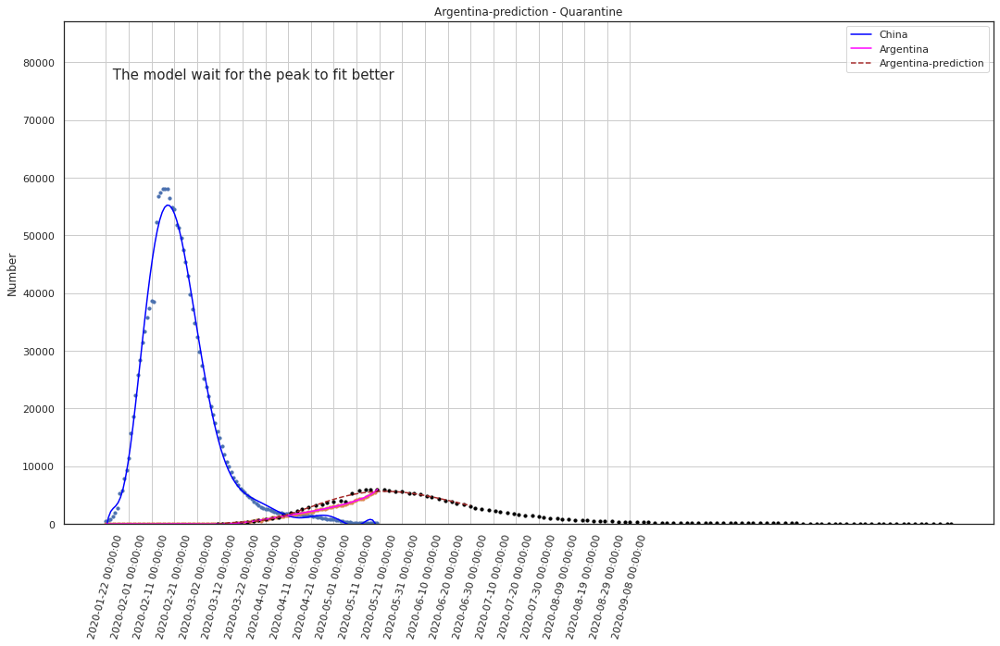

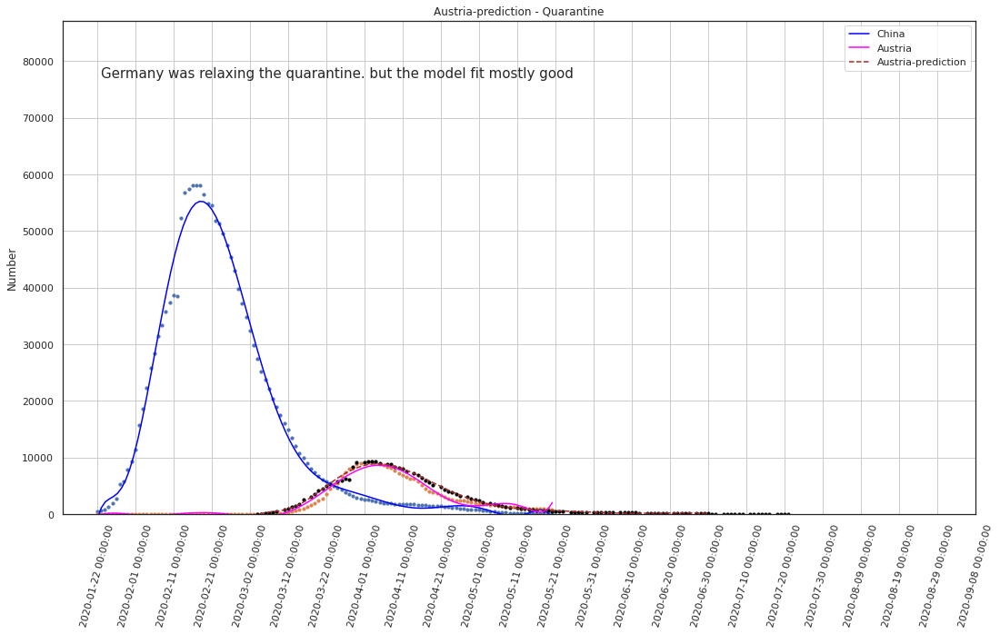

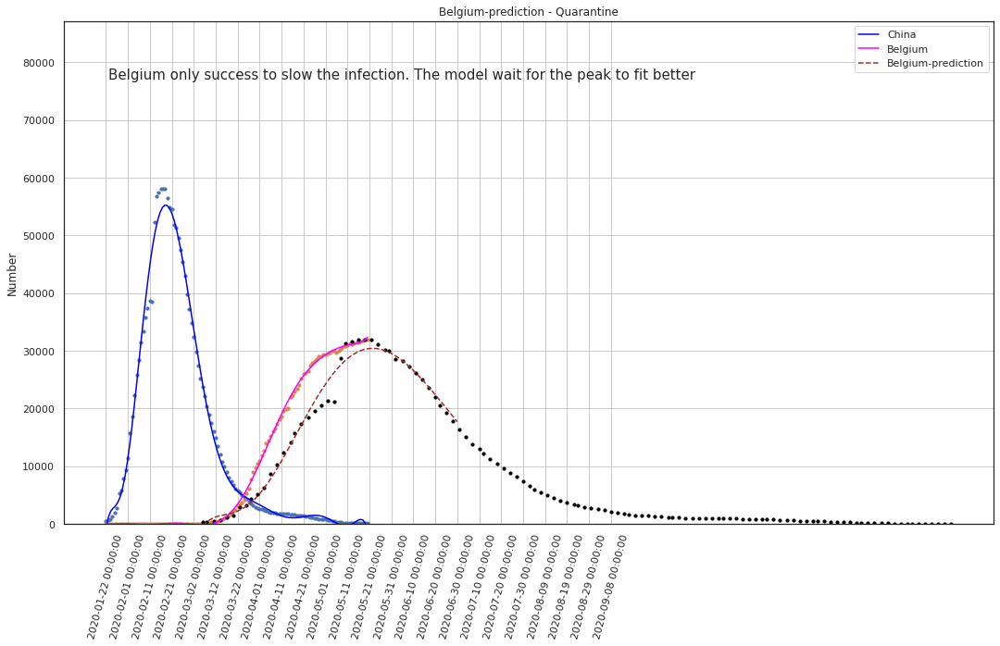

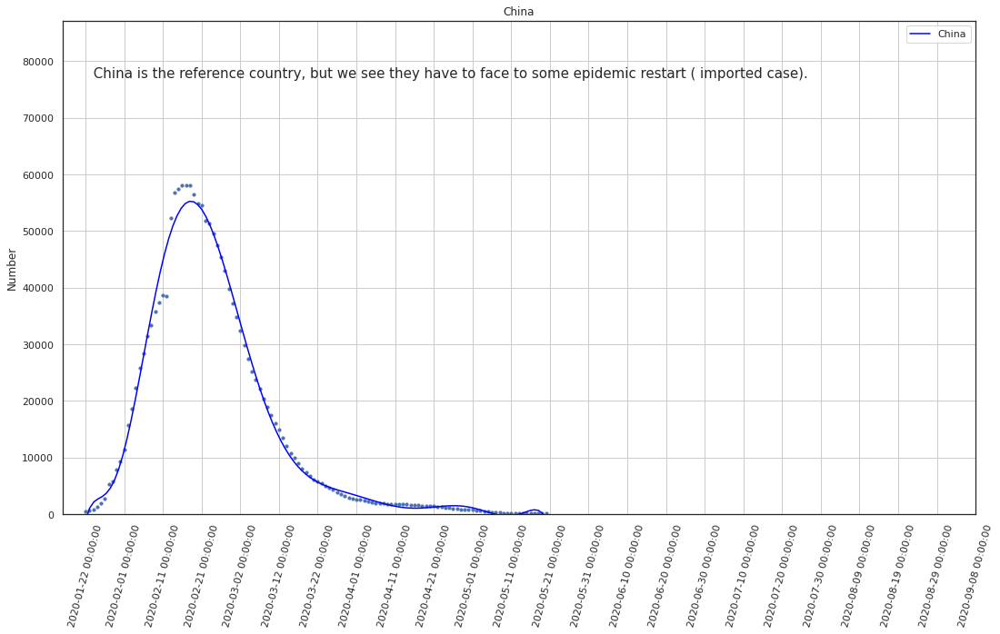

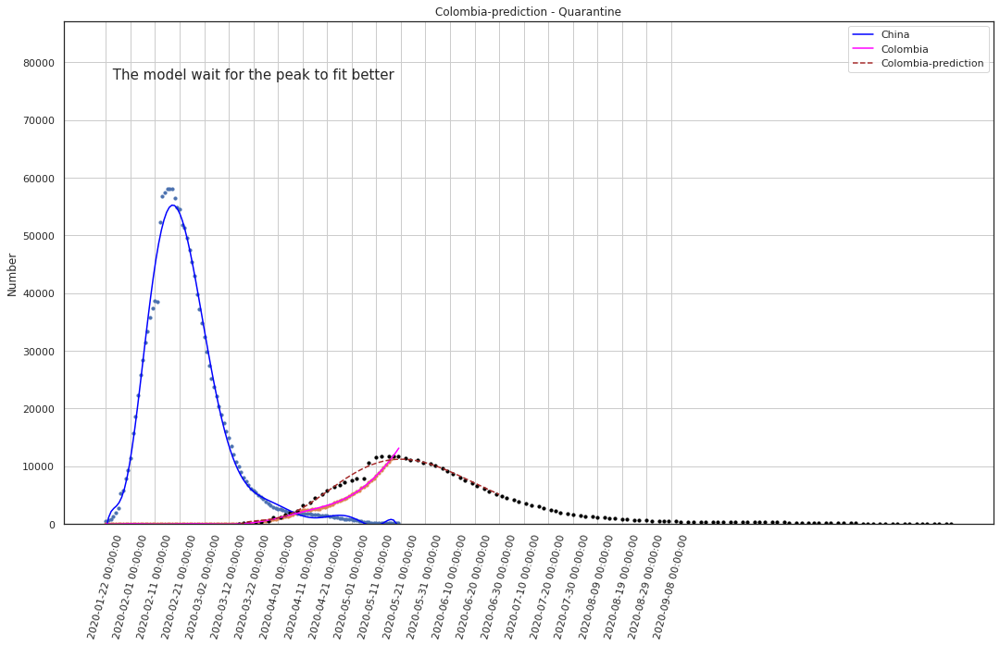

...

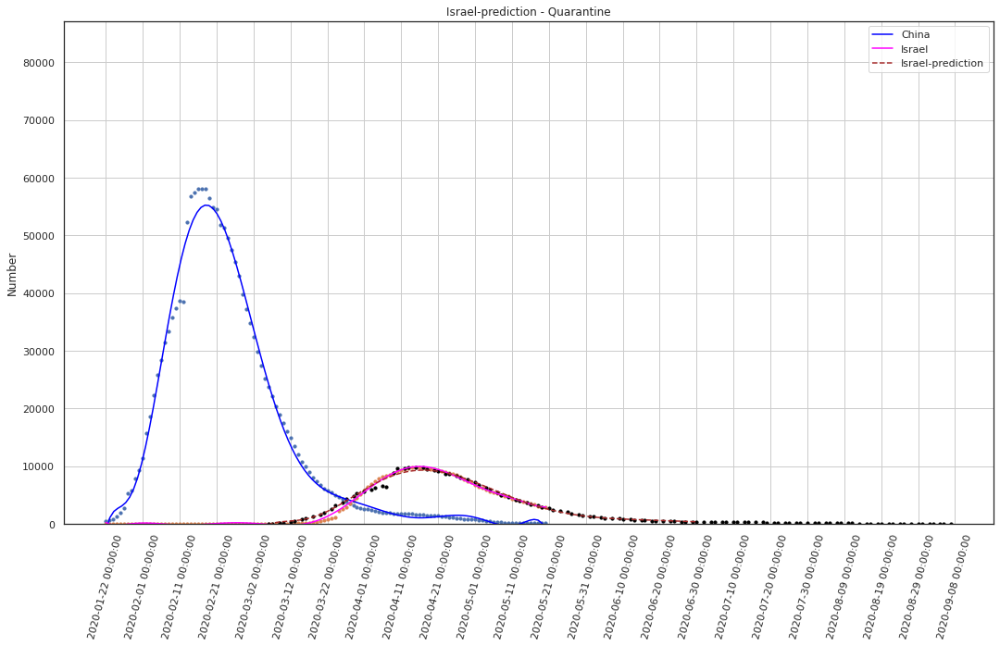

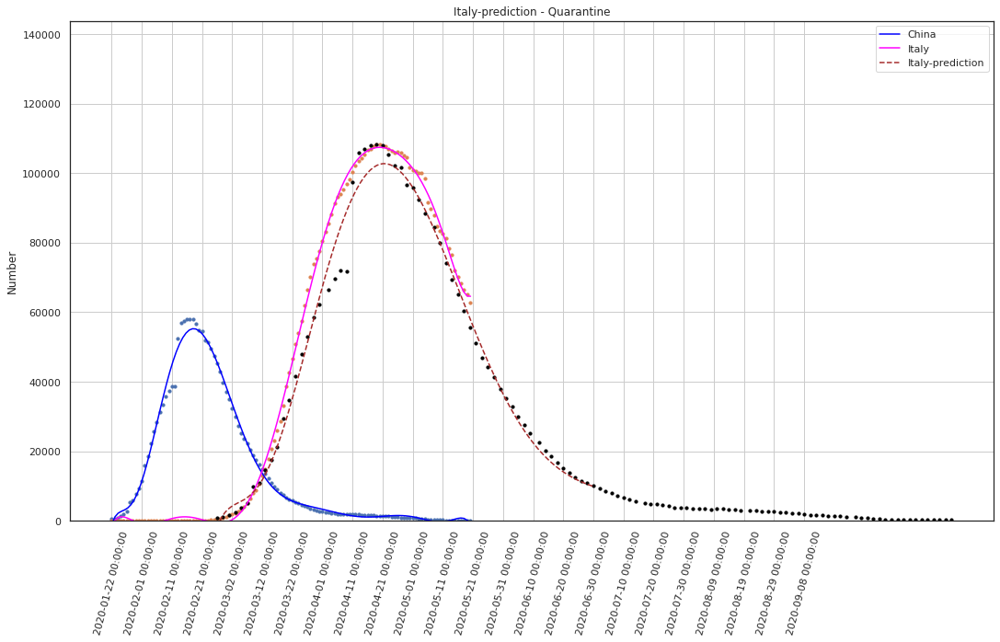

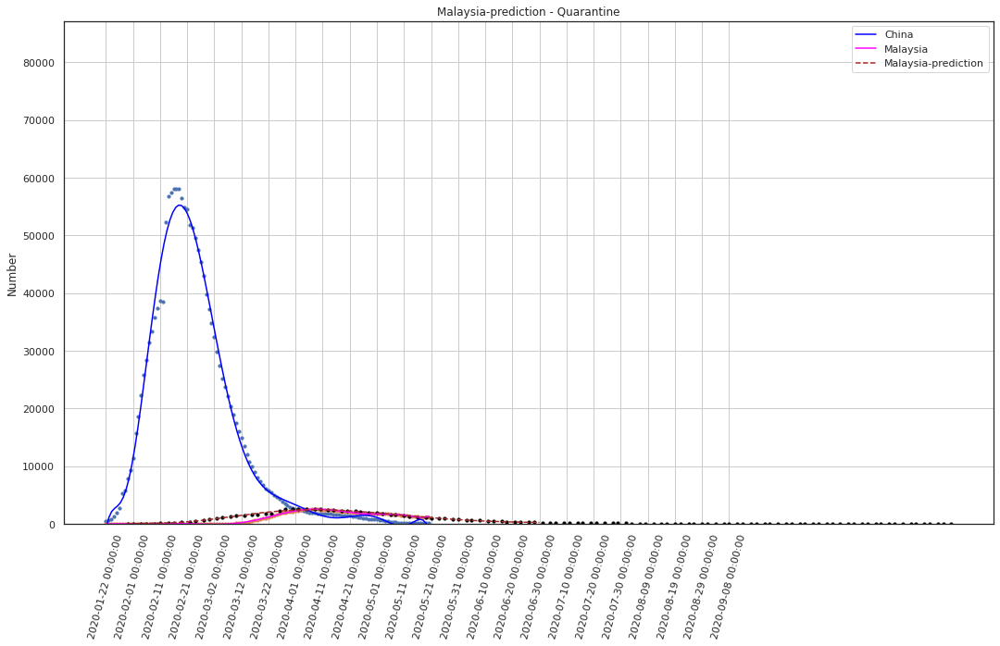

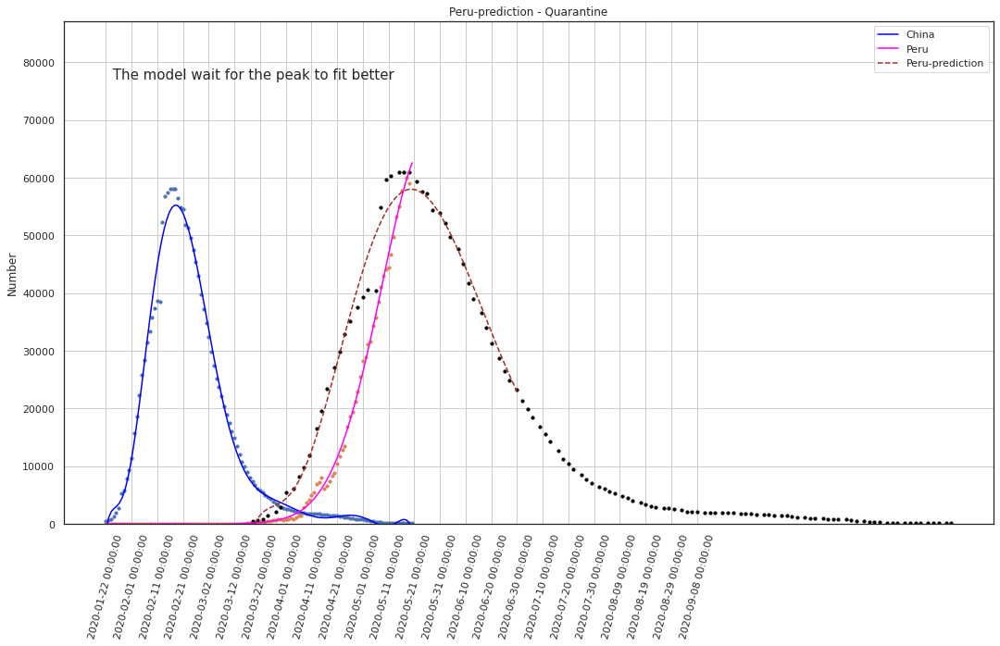

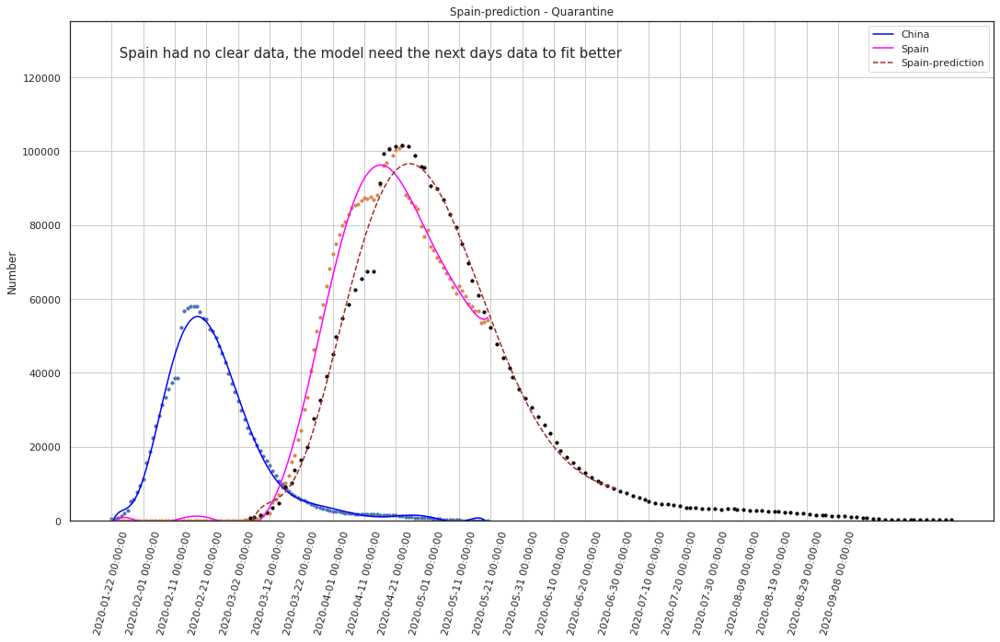

In [223]:
for countryindex in codiv_country_qurantine_active.T:
#codiv_country_quarantine_active.T:
    if countryindex=="China":
        coefs_Country,x_tr_Country,y_tr_Country,coefs_Country_prev,x_tr_Country_prev,y_tr_Country_prev,StartCountryIndex=Polifq(countryindex,shift=0,Version="quarantine",trigger=70)
        y_Country = np.polyval(coefs_Country, x_values)
        ymax=0
    else:
        coefs_Country,x_tr_Country,y_tr_Country,coefs_Country_prev,x_tr_Country_prev,y_tr_Country_prev,StartCountryIndex=Polifq(countryindex,shift=1,Version="quarantine",trigger=170)
        y_Country = np.polyval(coefs_Country, x_values)
        y_Country_prev = np.polyval(coefs_Country_prev, x_values)
        #adjust the ymax of the graphic
        ymax=int(max(y_Country_prev[StartCountryIndex:lendataChina])*1.40)
    if ymaxchina>ymax:
        ymax=ymaxchina
    #
    fig = plt.figure(figsize= (18, 10))
    #china reference country
    plt.scatter(x_tr_China, y_tr_China, s=10)
    plt.plot(x_values[0:lendataChina], y_China[0:lendataChina], label='China',c="blue")
    #plot the second country
    if countryindex!="China":
        plt.scatter(x_tr_Country, y_tr_Country, s=10)
        plt.plot(x_values[0:lendataChina], y_Country[0:lendataChina], label=countryindex,c="magenta")
        plt.scatter(x_tr_Country_prev,y_tr_Country_prev, s=10,c="black")
        PredictionName='%s-prediction'%(countryindex,)
        plt.plot(x_values, y_Country_prev, label=PredictionName,c="brown",ls='dashed')
    plt.ylim(-5,ymax)
    plt.ylabel("Number")
    plt.grid(True)
    tickvalues = range(0,len(dfdate),10)
    plt.xticks(ticks = tickvalues ,labels = dfdate["date"], rotation = 75)
    if countryindex!="China":
        Title='%s-prediction - Quarantine'%(countryindex,)
        plt.title(Title)
    else:
        plt.title("China")
    Texte=""
    if countryindex=="Belgium":
        Texte="Belgium only success to slow the infection. The model wait for the peak to fit better"
    if countryindex=="France":
        Texte="France was relaxing the quarantine? the model need the next days data to fit better. the datas are not clear"      
    if countryindex=="Germany" or countryindex=="Austria":
        Texte="Germany was relaxing the quarantine. but the model fit mostly good"      
    if countryindex=="India" or countryindex=="Argentina" or countryindex=="Peru" or countryindex=="Colombia":
        Texte=" The model wait for the peak to fit better"       
    if countryindex=="Spain":
        Texte=" Spain had no clear data, the model need the next days data to fit better"  
    if countryindex=="China":
        Texte=" China is the reference country, but we see they have to face to some epidemic restart ( imported case)."  
    plt.text(1, ymax-10000, Texte, fontsize=15)
    plt.legend()
    plt.show()

Restrictions
---

In [224]:
number,lendata=codiv_country_Restrictions_active.shape
x_values = np.linspace(0, lendata+40, num=lendata+30)
coefs_China,x_tr_China,y_tr_China,coefs_China_prev,x_tr_China_prev,y_tr_China_prev,StartCountryIndex=Polifq("China",shift=0,Version="quarantine",trigger=70)
lendataChina=max(x_tr_China)-7
y_China = np.polyval(coefs_China, x_values)
ymaxchina=int(max(y_tr_China)*1.5)

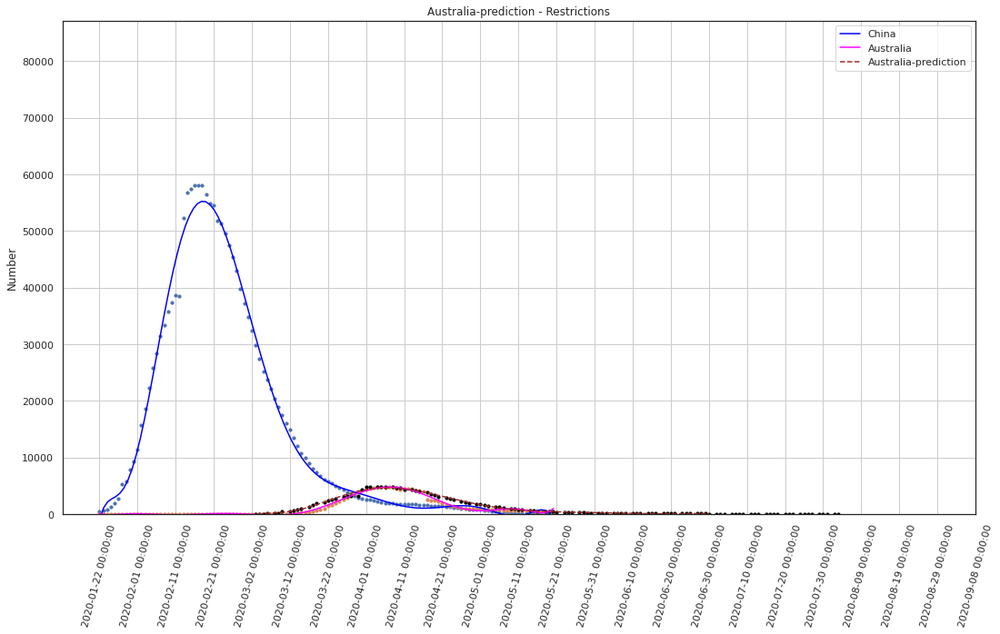

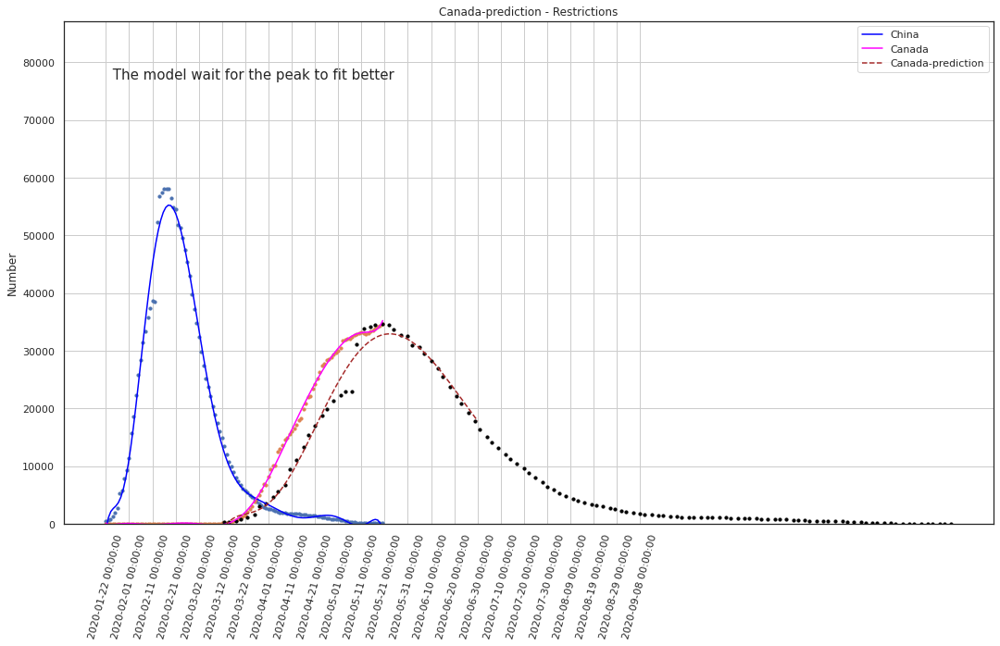

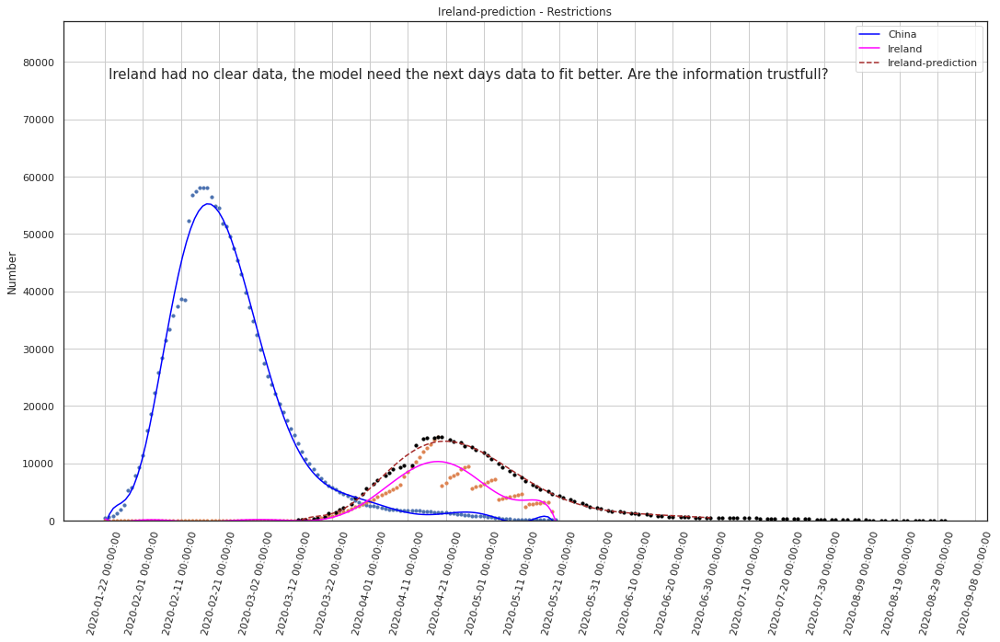

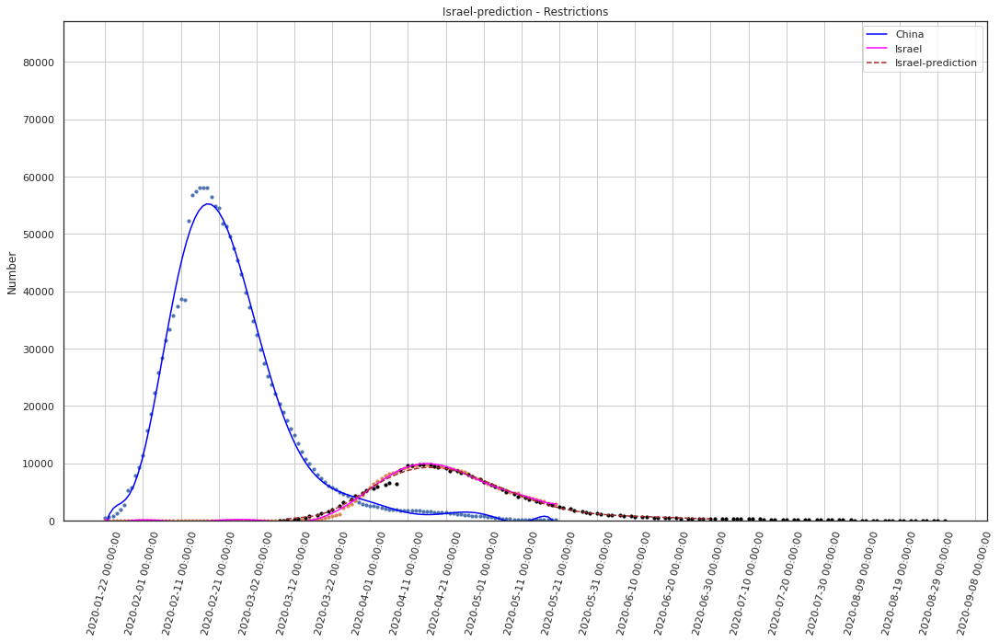

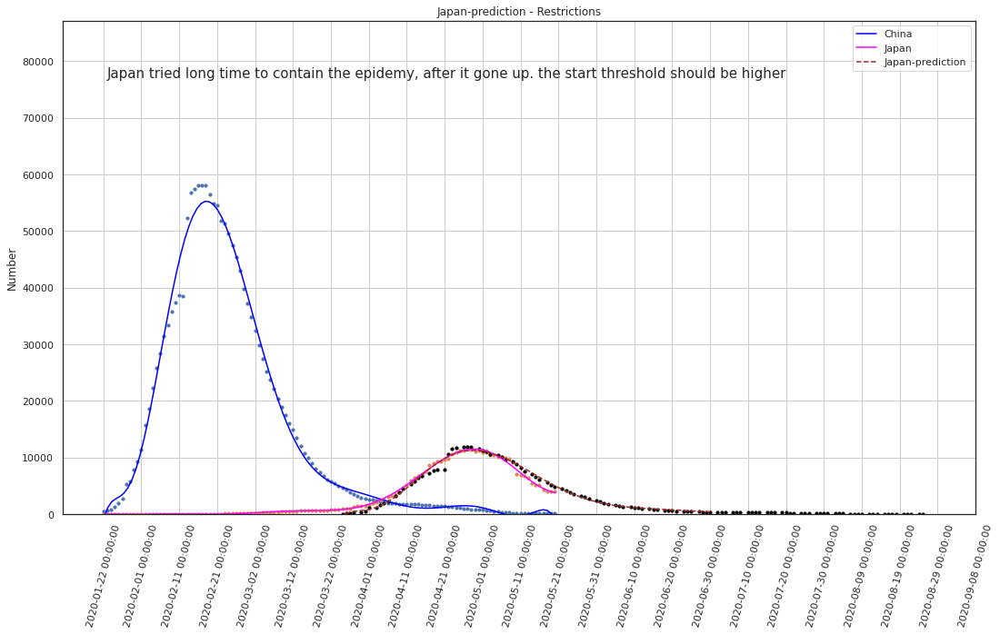

...

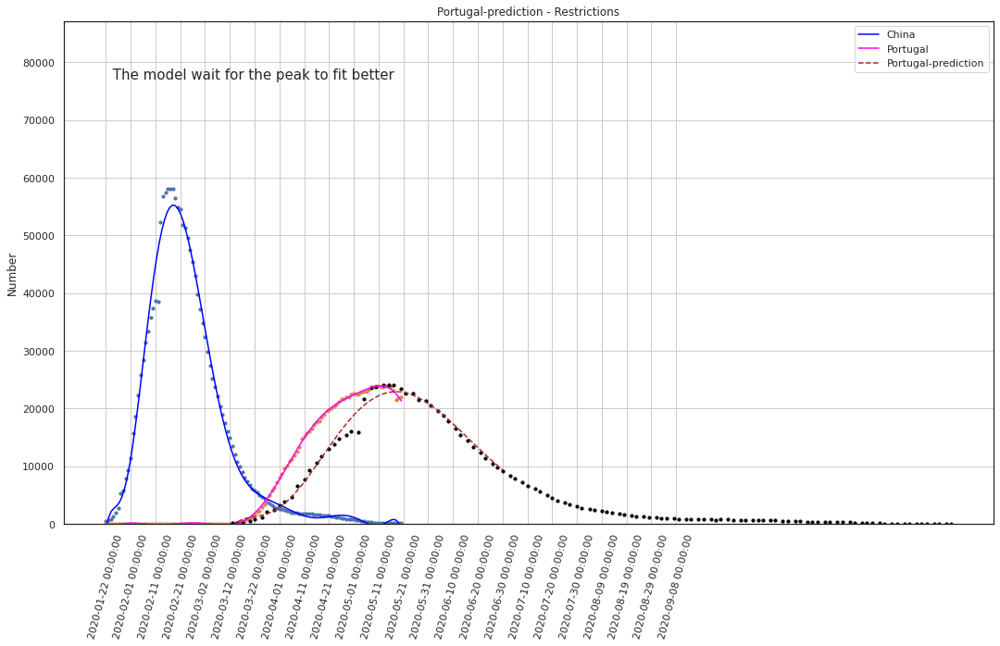

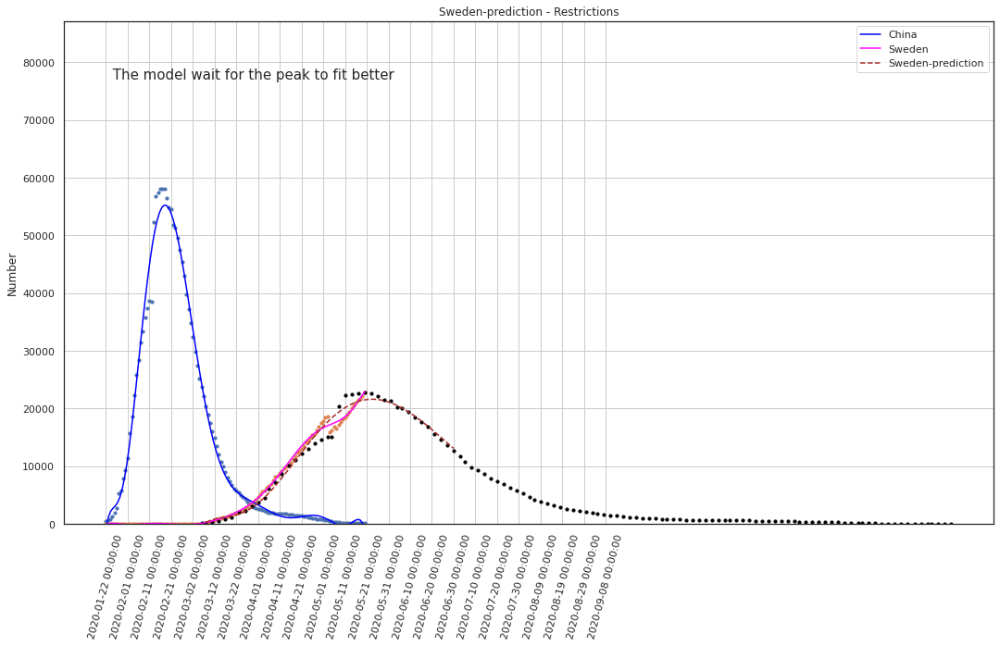

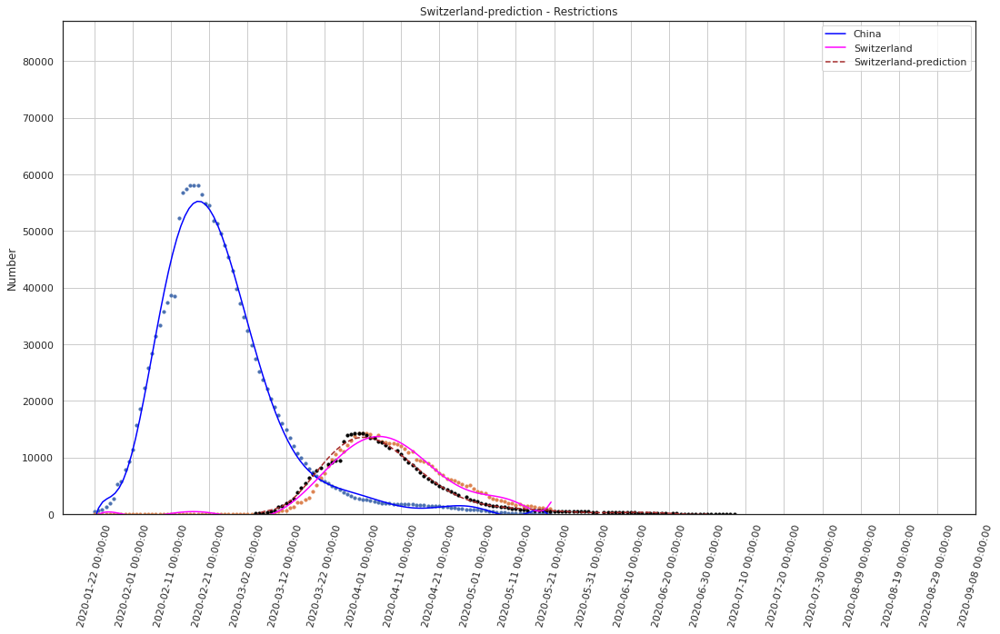

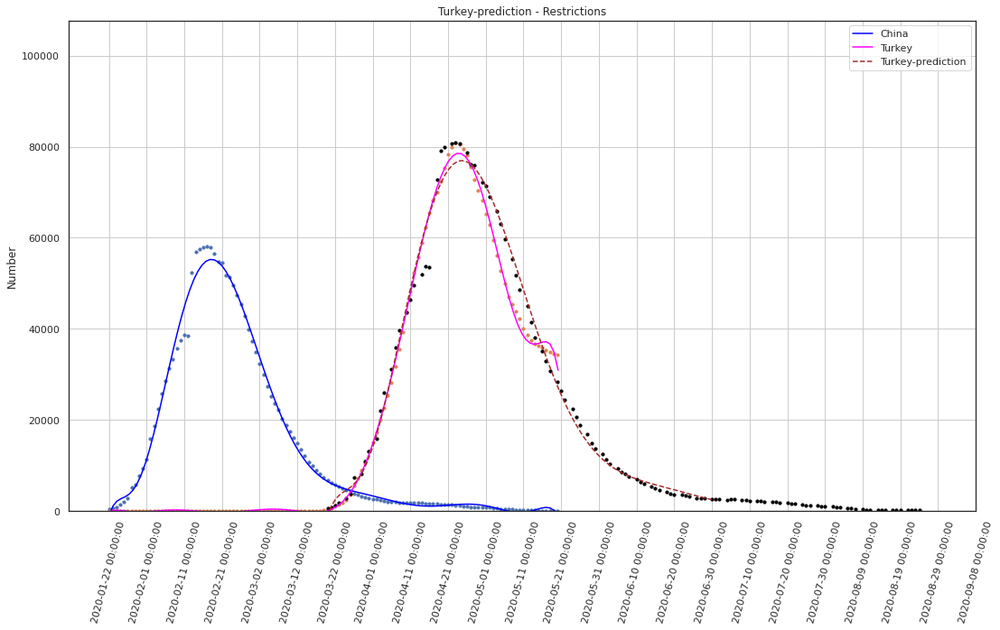

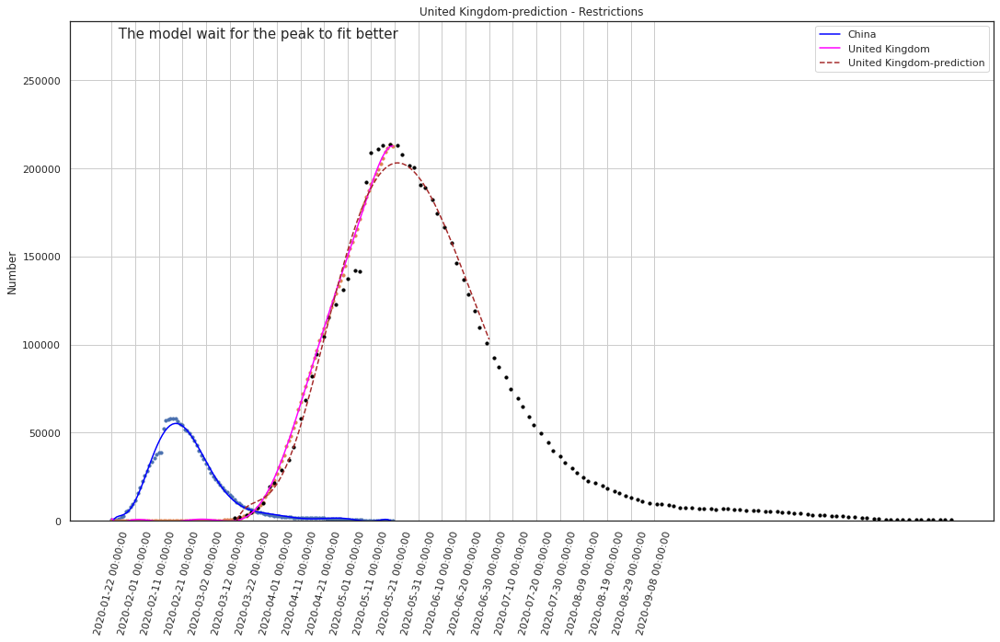

In [225]:
for countryindex in codiv_country_Restrictions_active.T:
#codiv_country_quarantine_active.T:
    # China is only in quarantine group
    if countryindex=="Japan":
        trigger=4500
    else:
        trigger=250
    coefs_Country,x_tr_Country,y_tr_Country,coefs_Country_prev,x_tr_Country_prev,y_tr_Country_prev,StartCountryIndex=Polifq(countryindex,shift=1,Version="restrictions",trigger=trigger)
    y_Country = np.polyval(coefs_Country, x_values)
    y_Country_prev = np.polyval(coefs_Country_prev, x_values)
    ymax=int(max(y_Country_prev[StartCountryIndex:lendataChina])*1.40)
    #adjust the ymax limit
    if ymaxchina>ymax:
        ymax=ymaxchina
    #
    fig = plt.figure(figsize= (18, 10))
    plt.scatter(x_tr_China, y_tr_China, s=10)
    plt.plot(x_values[0:lendataChina], y_China[0:lendataChina], label='China',c="blue")
    if countryindex!="China":
        plt.scatter(x_tr_Country, y_tr_Country, s=10)
        plt.plot(x_values[0:lendataChina], y_Country[0:lendataChina], label=countryindex,c="magenta")
        plt.scatter(x_tr_Country_prev,y_tr_Country_prev, s=10,c="black")
        PredictionName='%s-prediction'%(countryindex,)
        plt.plot(x_values, y_Country_prev, label=PredictionName,c="brown",ls='dashed')
    plt.ylim(-5,ymax)
    plt.ylabel("Number")
    plt.grid(True)
    tickvalues = range(0,len(dfdate),10)
    plt.xticks(ticks = tickvalues ,labels = dfdate["date"], rotation = 75)
    if countryindex!="China":
        Title='%s-prediction - Restrictions'%(countryindex,)
        plt.title(Title)
    else:
        plt.title("China")
    ##
    Texte=""
    if countryindex=="Ireland":
        Texte="Ireland had no clear data, the model need the next days data to fit better. Are the information trustfull?"
    if countryindex=="Japan":
        Texte="Japan tried long time to contain the epidemy, after it gone up. the start threshold should be higher" 
    if countryindex=="Canada" or countryindex=="Netherlands" or countryindex=="Peru" or countryindex=="Colombia"or countryindex=="Portugal"or countryindex=="Sweden"or countryindex=="United Kingdom":
        Texte=" The model wait for the peak to fit better"     
    if countryindex=="Norway" or countryindex=="Poland":
        Texte=" The model wait for the peak to fit better,they take long time to reach it" 
    plt.text(1, ymax-10000, Texte, fontsize=15)
    ##
    plt.legend()
    plt.show()

No Quarantine  and  No Restrictions
---

In [226]:
number,lendata=codiv_country_Restrictions_active.shape
x_values = np.linspace(0, lendata+40, num=lendata+30)
coefs_China,x_tr_China,y_tr_China,coefs_China_prev,x_tr_China_prev,y_tr_China_prev,StartCountryIndex=Polifq("China",shift=0,Version="quarantine",trigger=70)
lendataChina=max(x_tr_China)-7
y_China = np.polyval(coefs_China, x_values)
ymaxchina=int(max(y_tr_China)*1.5)

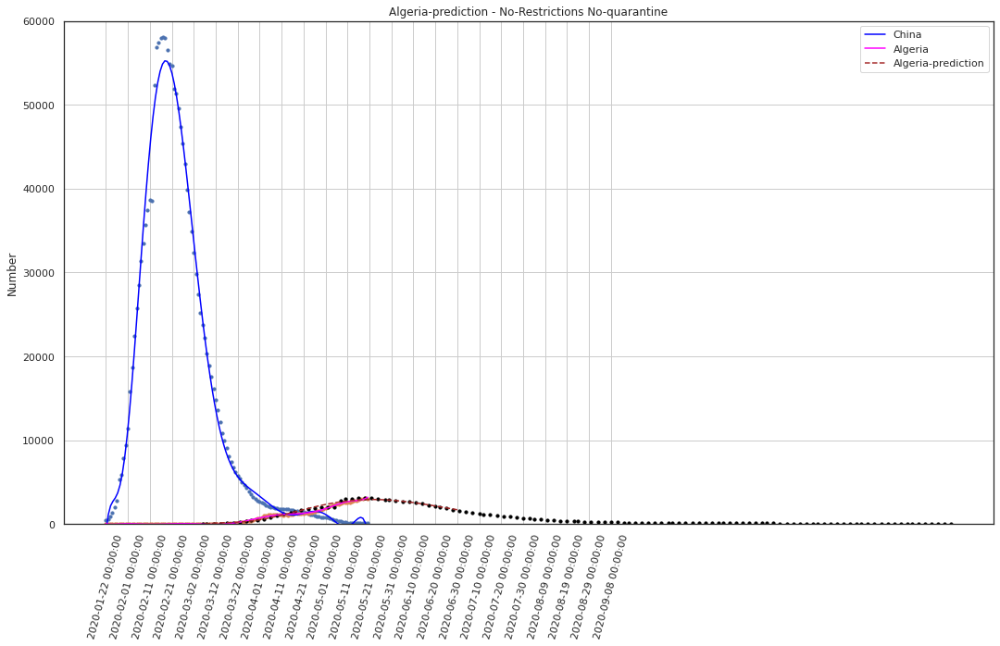

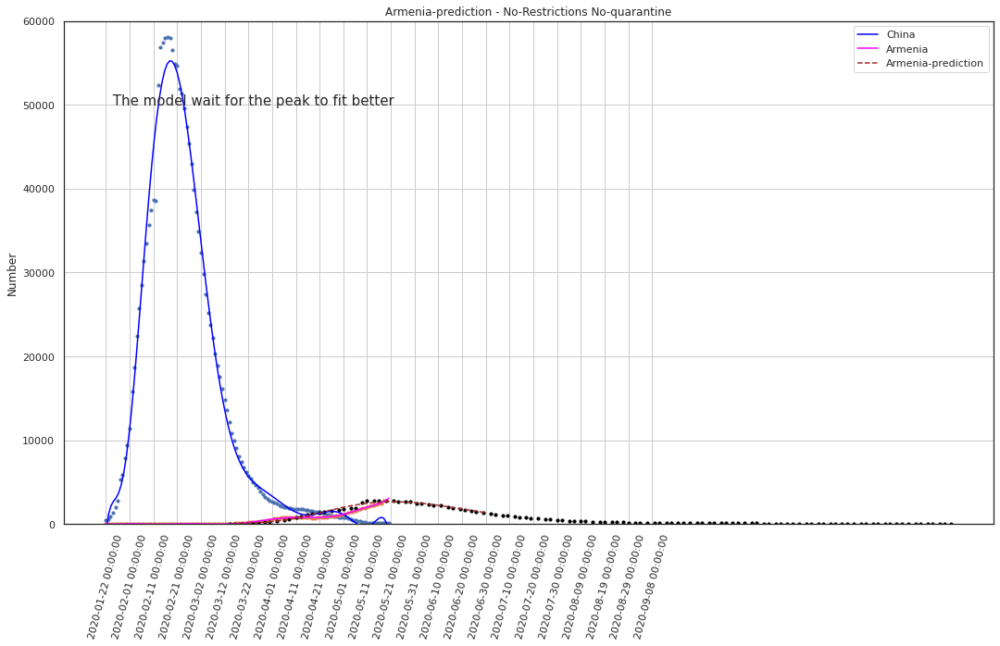

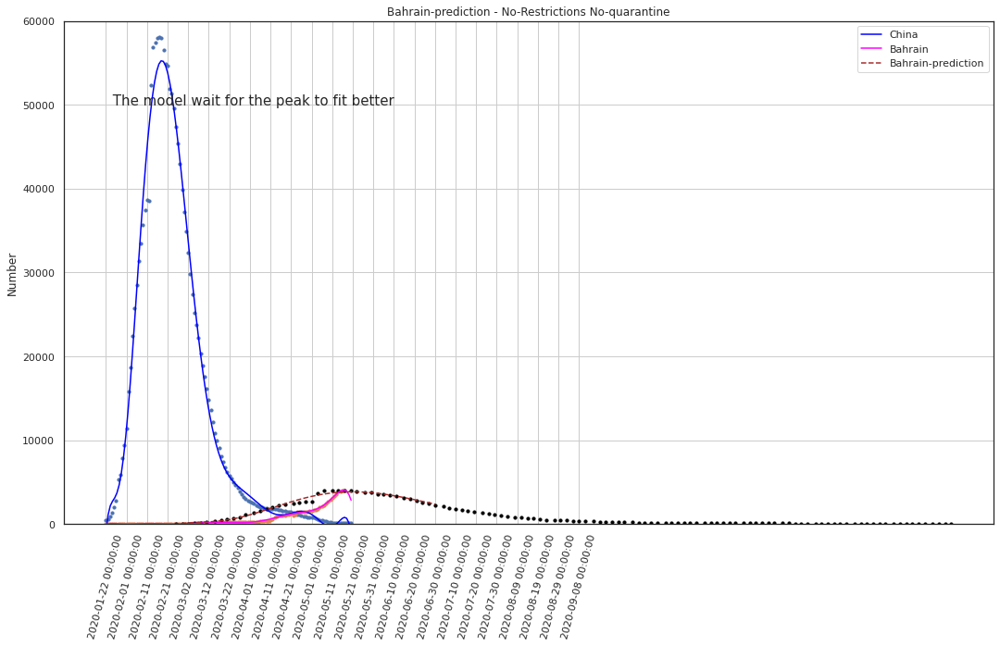

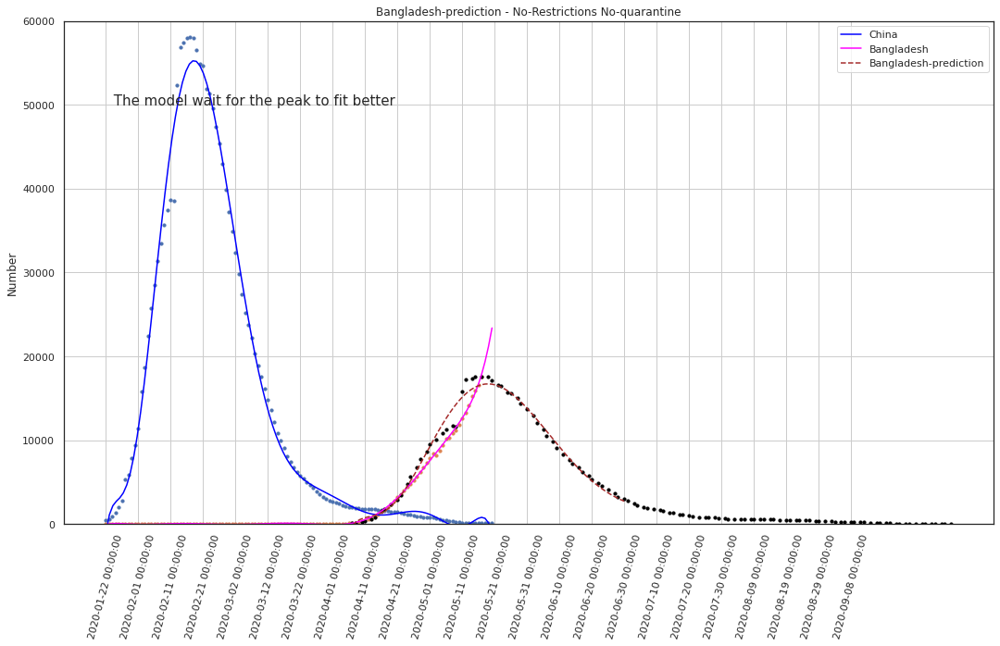

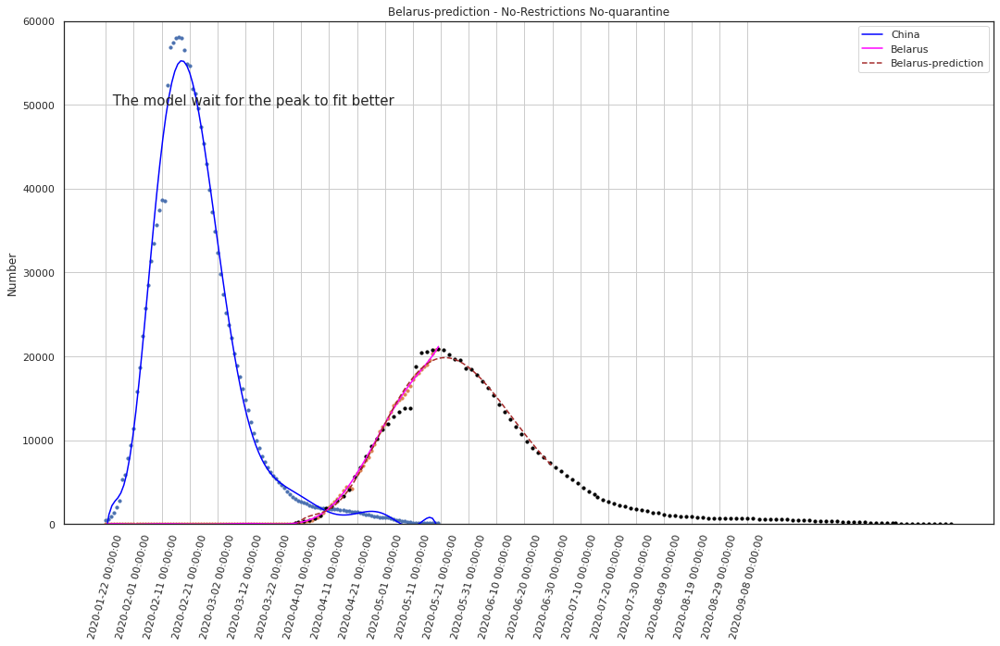

...

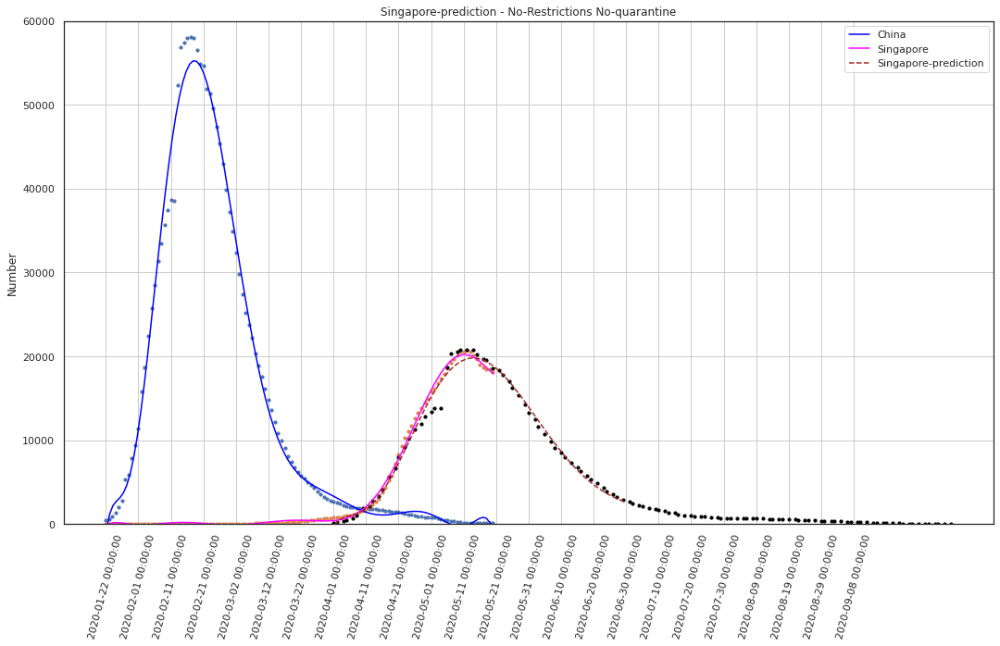

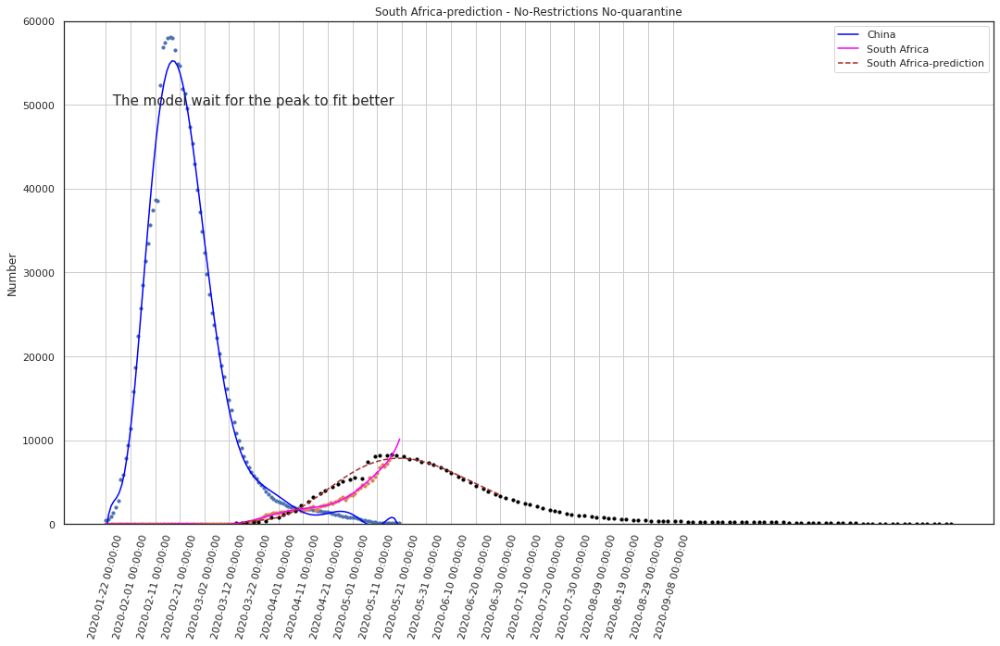

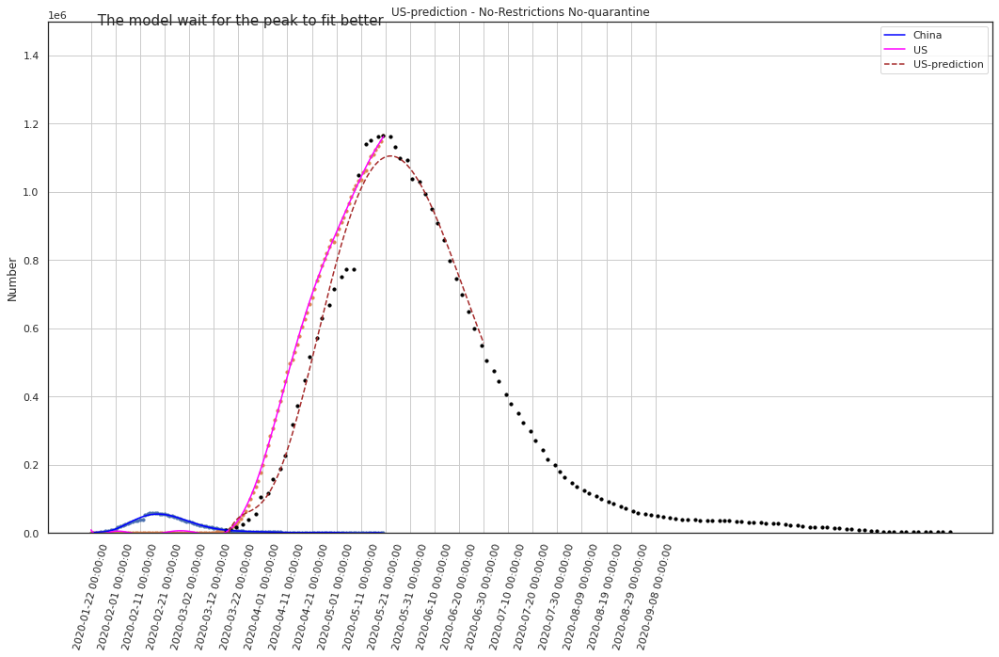

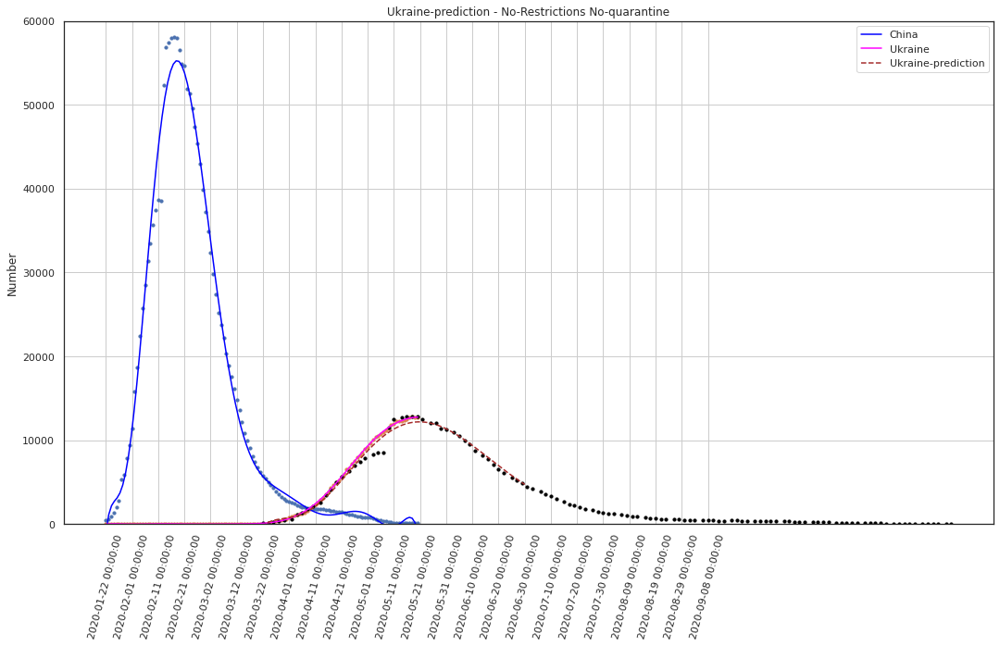

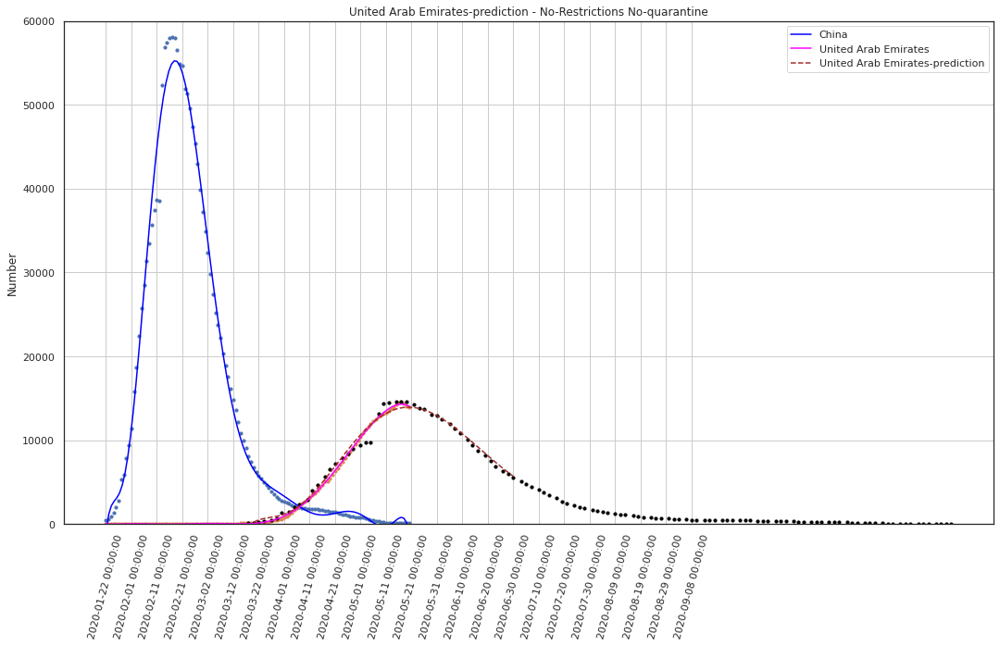

In [227]:
for countryindex in codiv_country_without_Restrictions_qurantine_active.T:
#codiv_country_quarantine_active.T:
    # china is only in quarntine group
    if countryindex=="Singapore" or countryindex=="Qatar" or countryindex=="Kuwait":
        trigger=2000
    else:
        trigger=300
    coefs_Country,x_tr_Country,y_tr_Country,coefs_Country_prev,x_tr_Country_prev,y_tr_Country_prev,StartCountryIndex=Polifq(countryindex,shift=1,Version="NoQuaNoRES",trigger=trigger)
    y_Country = np.polyval(coefs_Country, x_values)
    y_Country_prev = np.polyval(coefs_Country_prev, x_values)
    # adjust the ymax graph limit
    if countryindex=="US":
        ymax=1500000
    else:
        if countryindex=="Brazil":
            ymax=180000
        else:
            ymax=60000
    fig = plt.figure(figsize= (18, 10))
    plt.scatter(x_tr_China, y_tr_China, s=10)
    plt.plot(x_values[0:lendataChina], y_China[0:lendataChina], label='China',c="blue")
    if countryindex!="China":
        plt.scatter(x_tr_Country, y_tr_Country, s=10)
        plt.plot(x_values[0:lendataChina], y_Country[0:lendataChina], label=countryindex,c="magenta")
        plt.scatter(x_tr_Country_prev,y_tr_Country_prev, s=10,c="black")
        PredictionName='%s-prediction'%(countryindex,)
        plt.plot(x_values, y_Country_prev, label=PredictionName,c="brown",ls='dashed')
    plt.ylim(-5,ymax)
    plt.ylabel("Number")
    plt.grid(True)
    tickvalues = range(0,len(dfdate),10)
    plt.xticks(ticks = tickvalues ,labels = dfdate["date"], rotation = 75)
    if countryindex!="China":
        Title='%s-prediction - No-Restrictions No-quarantine'%(countryindex,)
        plt.title(Title)
    else:
        plt.title("China")
    ##
    Texte=""
    if countryindex=="Armenia" or countryindex=="Bahrain" or countryindex=="Bangladesh" or countryindex=="Belarus"or countryindex=="Brazil"or countryindex=="Chile"or countryindex=="United Kingdom"or countryindex=="US":
        Texte=" The model wait for the peak to fit better"  
    if countryindex=="Ecuador" or countryindex=="Indonesia" or countryindex=="Kuwait" or countryindex=="Mexico" or countryindex=="Oman" or countryindex=="Pakistan" or countryindex=="Quatar" or countryindex=="South Africa":
        Texte=" The model wait for the peak to fit better"
    if countryindex=="Dominican Republic" or countryindex=="Ghana":
        Texte=" The model wait for more data to fit better"
    plt.text(1, ymax-10000, Texte, fontsize=15)
    plt.legend()
    plt.show()